In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import pandas as pd
import numpy as np
import os
from scipy.stats import pearsonr
from itertools import combinations

In [3]:
zip_path = "C:\\Users\\user49\\Downloads\\wine+quality.zip"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.printdir()
    zip_ref.extractall("C:\\Users\\user49\\Downloads\\wine_quality_data")

File Name                                             Modified             Size
winequality-red.csv                            2023-05-22 22:24:00        84199
winequality-white.csv                          2023-05-22 22:24:00       264426
winequality.names                              2023-05-22 22:24:00         3305


In [4]:
with zipfile.ZipFile(zip_path) as z:
    with z.open('winequality-red.csv') as f:
        red_wine = pd.read_csv(f, sep=';')

In [5]:
red_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [6]:
red_wine.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [7]:
num_cols = red_wine.select_dtypes(include=['float64', 'int64']).columns
red_wine[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
volatile acidity,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
citric acid,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
residual sugar,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
chlorides,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
free sulfur dioxide,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
total sulfur dioxide,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
density,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
pH,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
sulphates,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


In [8]:
def map_quality_category(x):
    if x <= 4:
        return 'low'
    elif x <= 6:
        return 'medium'
    else:
        return 'high'

red_wine['quality_category'] = red_wine['quality'].apply(map_quality_category)
red_wine['quality_category'].value_counts()

quality_category
medium    1319
high       217
low         63
Name: count, dtype: int64

In [9]:
cat_cols = red_wine['quality_category']
cat_cols.head(20)

0     medium
1     medium
2     medium
3     medium
4     medium
5     medium
6     medium
7       high
8       high
9     medium
10    medium
11    medium
12    medium
13    medium
14    medium
15    medium
16      high
17    medium
18       low
19    medium
Name: quality_category, dtype: object

In [10]:
red_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_category
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,medium
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,medium
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,medium
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,medium
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,medium


In [11]:
df = red_wine.copy()

Feature: fixed acidity
       fixed acidity
count    1599.000000
mean        8.319637
std         1.741096
min         4.600000
25%         7.100000
50%         7.900000
75%         9.200000
max        15.900000


Skewness: 0.983
Kurtosis: 1.132




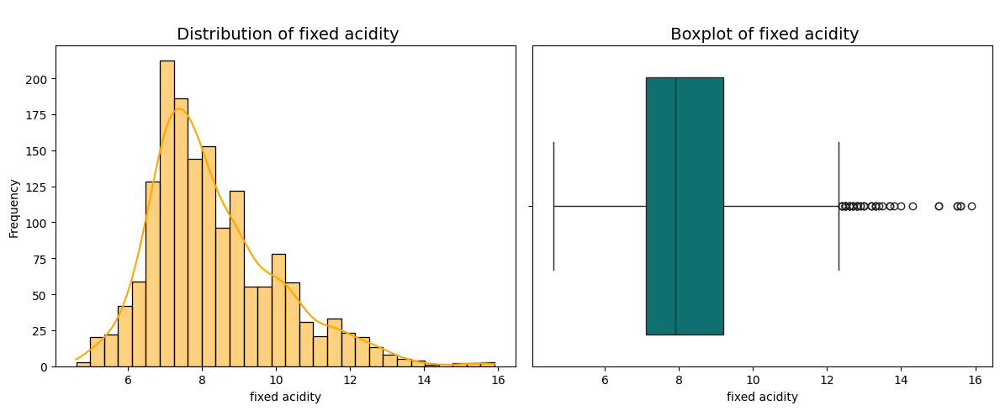

The distribution of fixed acidity is moderately skewed. Consider square root transformation.
Feature: volatile acidity
       volatile acidity
count       1599.000000
mean           0.527821
std            0.179060
min            0.120000
25%            0.390000
50%            0.520000
75%            0.640000
max            1.580000


Skewness: 0.672
Kurtosis: 1.226




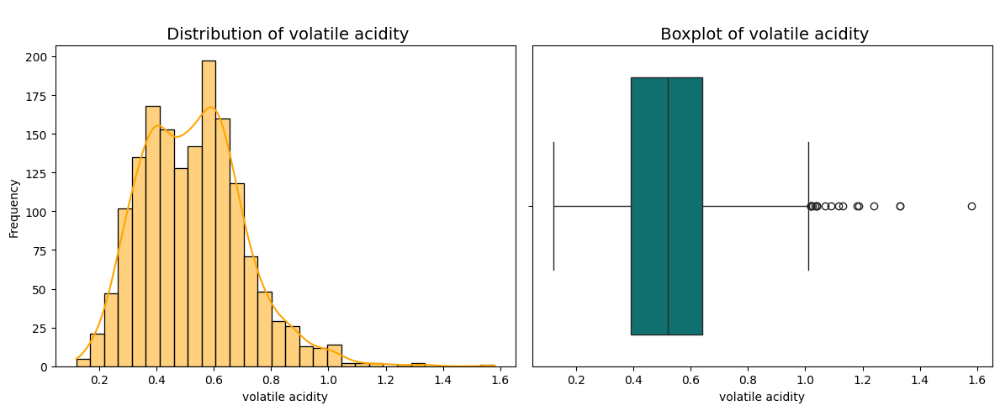

The distribution of volatile acidity is moderately skewed. Consider square root transformation.
Feature: citric acid
       citric acid
count  1599.000000
mean      0.270976
std       0.194801
min       0.000000
25%       0.090000
50%       0.260000
75%       0.420000
max       1.000000


Skewness: 0.318
Kurtosis: -0.789




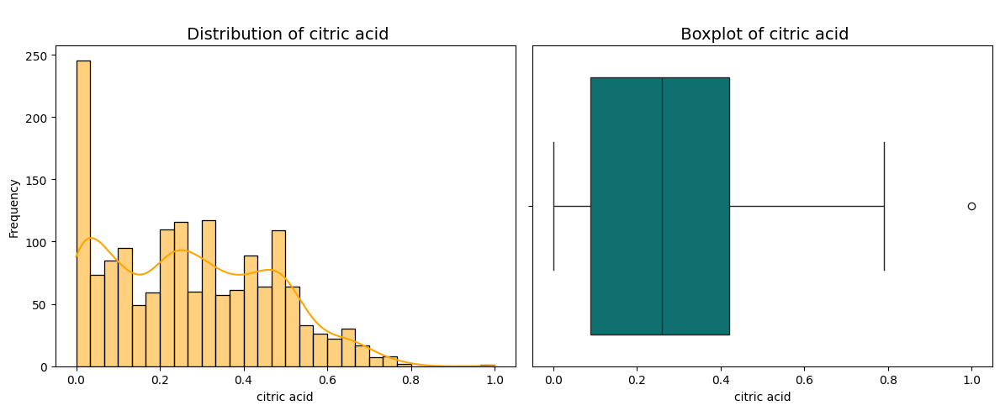

The distribution of citric acid is approximately symmetric.
Feature: residual sugar
       residual sugar
count     1599.000000
mean         2.538806
std          1.409928
min          0.900000
25%          1.900000
50%          2.200000
75%          2.600000
max         15.500000


Skewness: 4.541
Kurtosis: 28.618




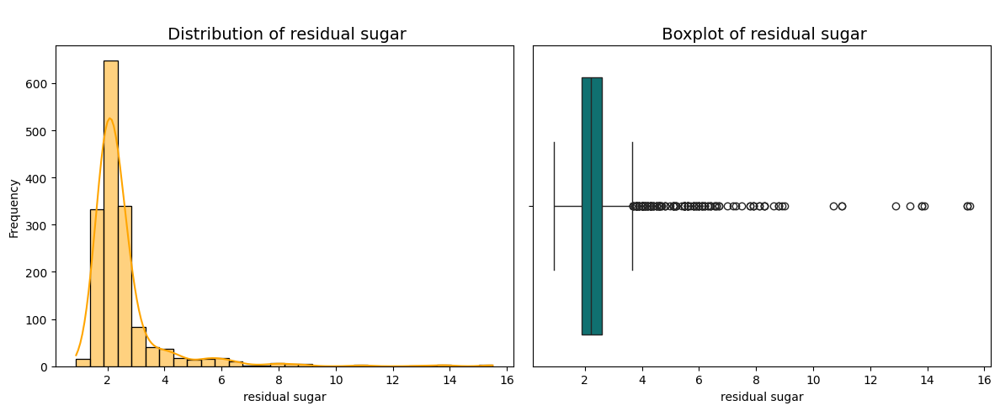

The distribution of residual sugar is highly skewed. Consider log or Box-Cox transformation.
Feature: chlorides
         chlorides
count  1599.000000
mean      0.087467
std       0.047065
min       0.012000
25%       0.070000
50%       0.079000
75%       0.090000
max       0.611000


Skewness: 5.680
Kurtosis: 41.716




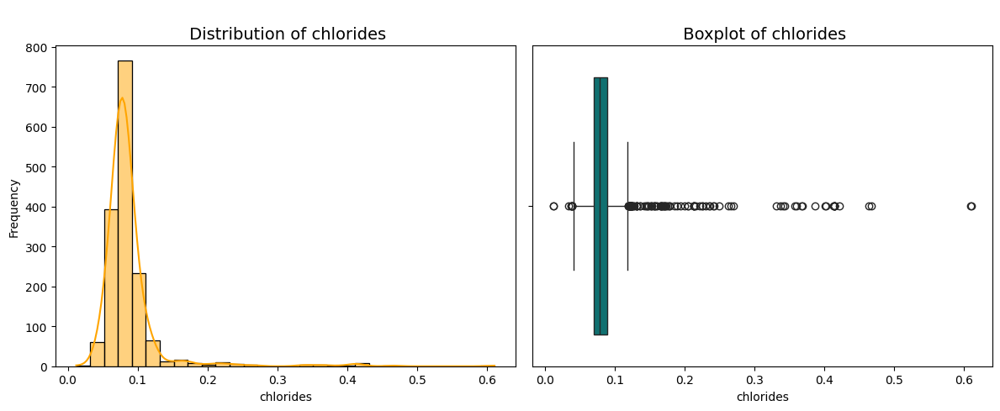

The distribution of chlorides is highly skewed. Consider log or Box-Cox transformation.
Feature: free sulfur dioxide
       free sulfur dioxide
count          1599.000000
mean             15.874922
std              10.460157
min               1.000000
25%               7.000000
50%              14.000000
75%              21.000000
max              72.000000


Skewness: 1.251
Kurtosis: 2.024




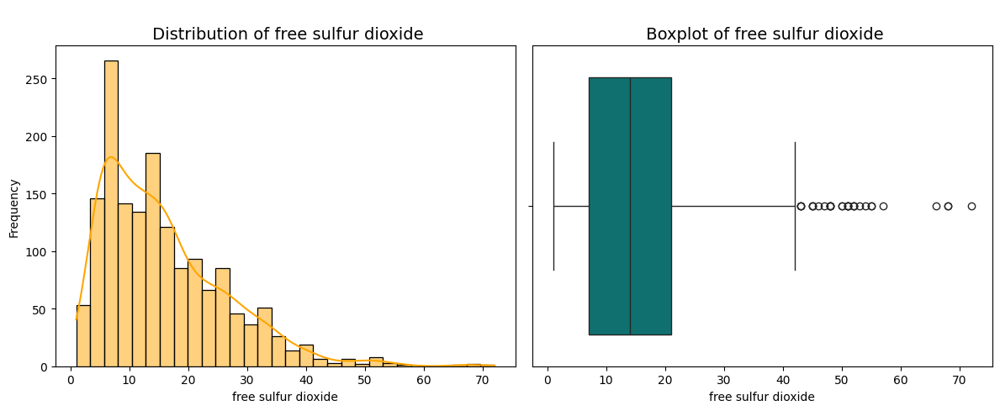

The distribution of free sulfur dioxide is highly skewed. Consider log or Box-Cox transformation.
Feature: total sulfur dioxide
       total sulfur dioxide
count           1599.000000
mean              46.467792
std               32.895324
min                6.000000
25%               22.000000
50%               38.000000
75%               62.000000
max              289.000000


Skewness: 1.516
Kurtosis: 3.810




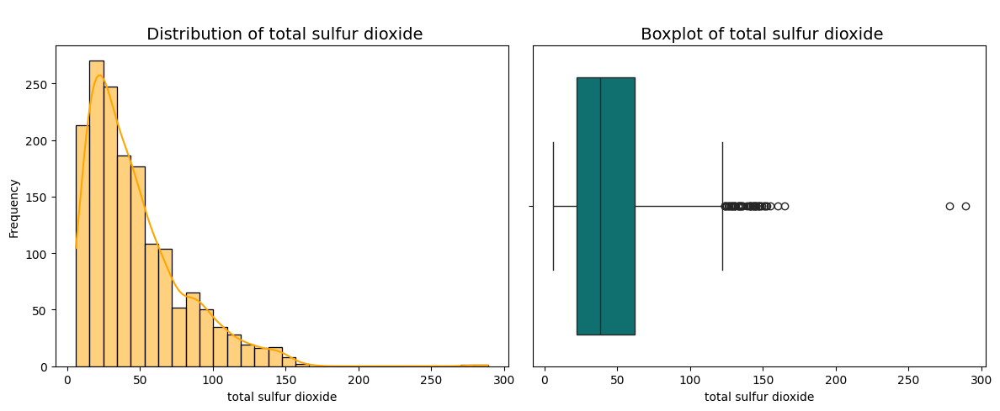

The distribution of total sulfur dioxide is highly skewed. Consider log or Box-Cox transformation.
Feature: density
           density
count  1599.000000
mean      0.996747
std       0.001887
min       0.990070
25%       0.995600
50%       0.996750
75%       0.997835
max       1.003690


Skewness: 0.071
Kurtosis: 0.934




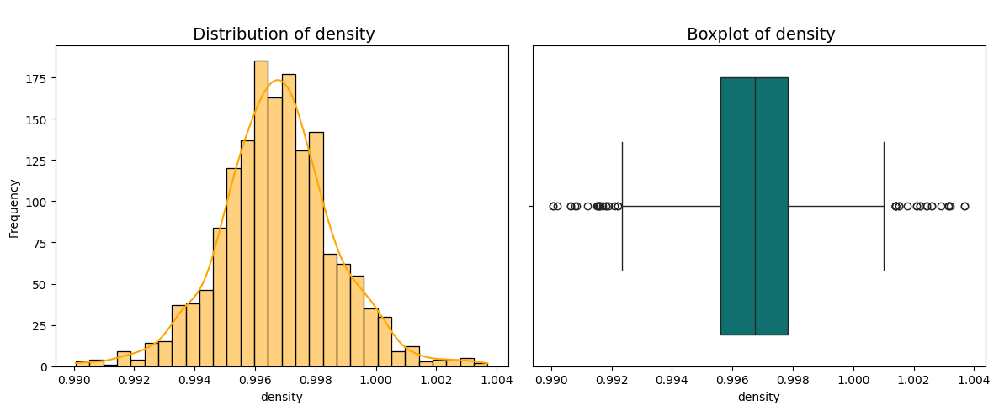

The distribution of density is approximately symmetric.
Feature: pH
                pH
count  1599.000000
mean      3.311113
std       0.154386
min       2.740000
25%       3.210000
50%       3.310000
75%       3.400000
max       4.010000


Skewness: 0.194
Kurtosis: 0.807




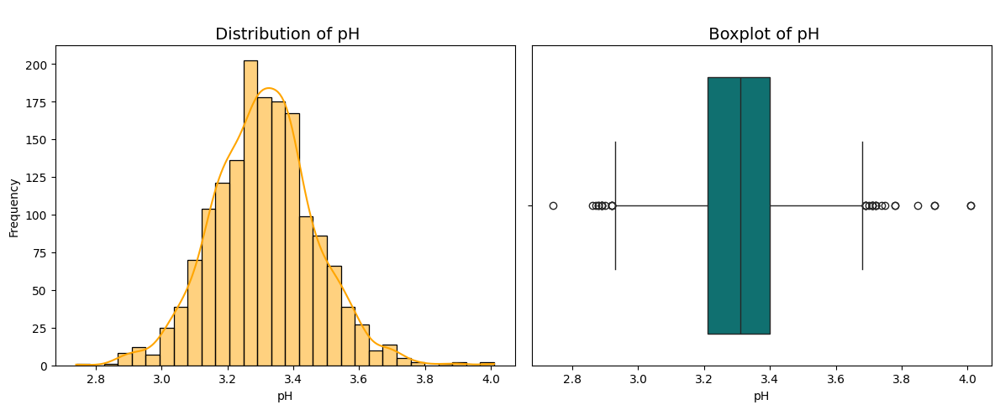

The distribution of pH is approximately symmetric.
Feature: sulphates
         sulphates
count  1599.000000
mean      0.658149
std       0.169507
min       0.330000
25%       0.550000
50%       0.620000
75%       0.730000
max       2.000000


Skewness: 2.429
Kurtosis: 11.720




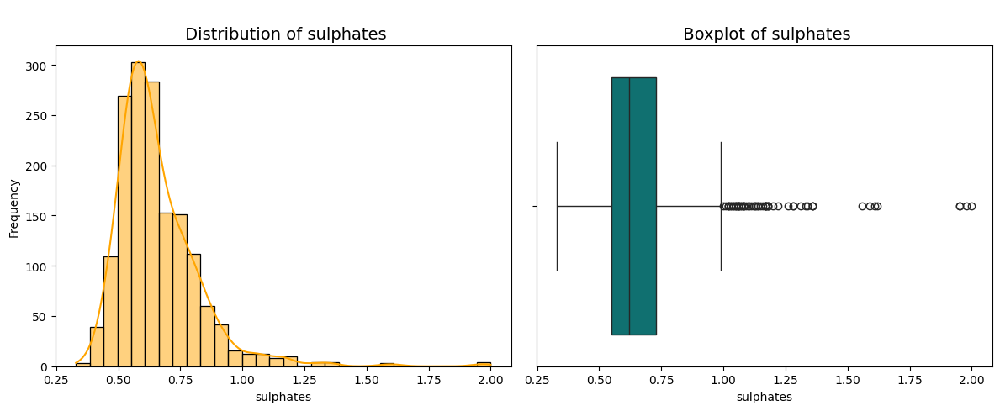

The distribution of sulphates is highly skewed. Consider log or Box-Cox transformation.
Feature: alcohol
           alcohol
count  1599.000000
mean     10.422983
std       1.065668
min       8.400000
25%       9.500000
50%      10.200000
75%      11.100000
max      14.900000


Skewness: 0.861
Kurtosis: 0.200




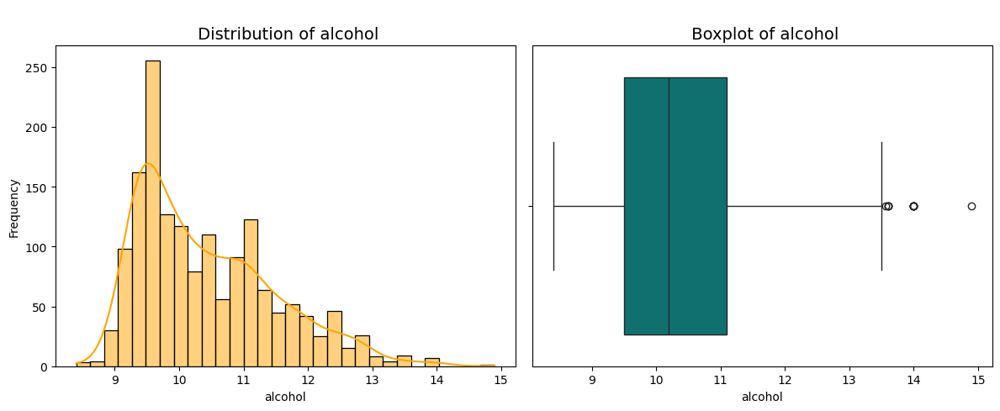

The distribution of alcohol is moderately skewed. Consider square root transformation.
Feature: quality
           quality
count  1599.000000
mean      5.636023
std       0.807569
min       3.000000
25%       5.000000
50%       6.000000
75%       6.000000
max       8.000000


Skewness: 0.218
Kurtosis: 0.297




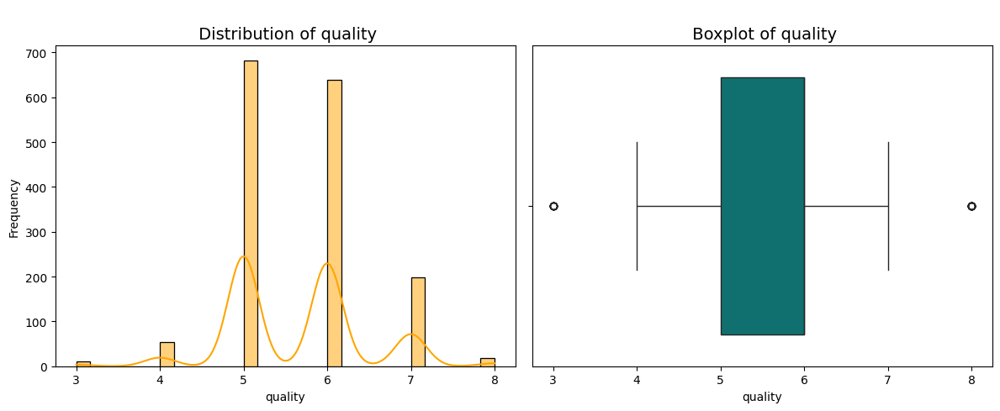

The distribution of quality is approximately symmetric.


In [12]:
def univariate_numerical_analysis(df, column):
    
    print(f"Feature: {column}")
    print("=" * 40)
    print(df[column].describe().to_frame())
    print("\n")
    print(f"Skewness: {df[column].skew():.3f}")
    print(f"Kurtosis: {df[column].kurtosis():.3f}") 
    print("\n")
    
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    sns.histplot(df[column], kde=True, bins=30, color='orange')
    plt.title(f'\n Distribution of {column}', fontsize=14)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[column], color='teal')
    plt.title(f'\n Boxplot of {column}', fontsize=14)

    plt.tight_layout()
    plt.show()
    
    if abs(df[column].skew()) > 1:
        print(f"The distribution of {column} is highly skewed. Consider log or Box-Cox transformation.")
    elif abs(df[column].skew()) > 0.5:
        print(f"The distribution of {column} is moderately skewed. Consider square root transformation.")
    else:
        print(f"The distribution of {column} is approximately symmetric.")
        
for col in num_cols:
    univariate_numerical_analysis(df, col)

Feature: quality_category
                  Count  Percentage
quality_category                   
medium             1319       82.49
high                217       13.57
low                  63        3.94



C:\Users\user49\AppData\Local\Temp\ipykernel_7508\3117867721.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=column, data=df, palette='Set2', order=freq.index, color='teal')


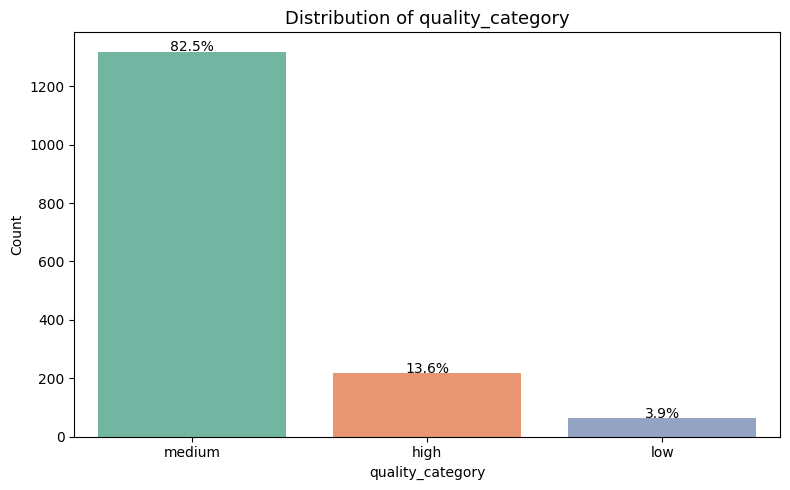

In [13]:
def univariate_categorical_analysis(df, column):
    
    print(f"Feature: {column}")
    print("=" * 40)
    
    freq = df[column].value_counts()
    prop = df[column].value_counts(normalize=True) * 100
    summary = pd.DataFrame({'Count': freq, 'Percentage': prop.round(2)})
    print(summary)
    print()
    
    plt.figure(figsize=(8, 5))
    ax = sns.countplot(x=column, data=df, palette='Set2', order=freq.index, color='teal')
    plt.title(f'Distribution of {column}', fontsize=13)
    plt.xlabel(column)
    plt.ylabel('Count')
    
    total = len(df[column])
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width()/2, height + 1,
                f'{(height/total) * 100:.1f}%', ha = 'center')
    
    plt.tight_layout()
    plt.show()
    
univariate_categorical_analysis(red_wine, "quality_category")

In [14]:
def correlation_with_target(df, target_col, figsize=(10, 2)):
    
    numeric_df = df.select_dtypes(include='number').copy()
    if target_col not in numeric_df.columns:
        raise ValueError(f"Target column '{target_col}' must be numeric and present in the dataframe.")
    
    corrs = numeric_df.corrwith(numeric_df[target_col]).drop(target_col)
    
    corrs_df = corrs.to_frame(name='corr').T

    plt.figure(figsize=figsize)
    sns.heatmap(
        corrs_df,
        annot=True,
        fmt=".3f",
        cmap="coolwarm",
        center=0,
        vmin=-1,
        vmax=1,
        cbar_kws={'orientation': 'vertical', 'shrink':0.7}
    )
    plt.xticks(rotation=45, ha='right')
    plt.yticks([0], [target_col], rotation=0)
    plt.title(f'Correlation of numeric features with {target_col}', fontsize=13)
    plt.tight_layout()
    plt.show()
    
    return corrs.reindex(corrs.abs().sort_values(ascending=False).index)

In [15]:
def annotated_target_heatmap(df, target_col, figsize=(12, 2.5)):
    # Compute correlation matrix (numeric columns only)
    corr = df.corr(numeric_only=True)
    
    # Extract correlation with the target column
    corr_series = corr[target_col].sort_values(ascending=False)
    
    # Plot annotated heatmap
    plt.figure(figsize=figsize)
    sns.heatmap(
        corr[[target_col]].sort_values(by=target_col, ascending=False),
        annot=True,
        cmap='coolwarm',
        center=0
    )
    plt.title(f'Correlation with Target: {target_col}')
    plt.tight_layout()
    plt.show()
    
    # Return correlation values
    return corr_series


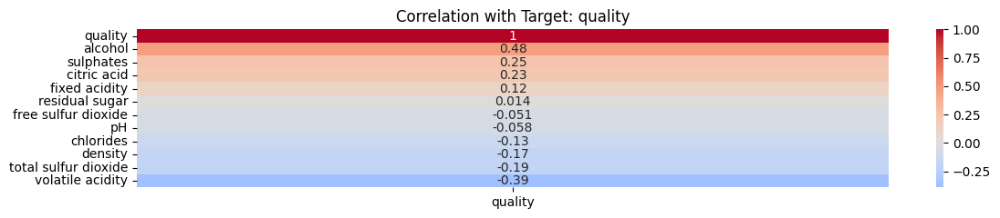

quality                 1.000000
alcohol                 0.476166
sulphates               0.251397
citric acid             0.226373
fixed acidity           0.124052
residual sugar          0.013732
free sulfur dioxide    -0.050656
pH                     -0.057731
chlorides              -0.128907
density                -0.174919
total sulfur dioxide   -0.185100
volatile acidity       -0.390558
Name: quality, dtype: float64


In [16]:
corr_series = annotated_target_heatmap(df, 'quality', figsize=(12,2.5))
print(corr_series) 


In [17]:
def numeric_bivariate_plot(df, x_col, y_col):

    corr, p_value = pearsonr(df[x_col], df[y_col])

    plt.figure(figsize=(8, 5))
    sns.regplot(data=df, x=x_col, y=y_col, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})

    plt.title(f"{y_col} vs {x_col}\nCorrelation: {corr:.3f} (p={p_value:.3f})", fontsize=13)
    plt.xlabel(x_col, fontsize=11)
    plt.ylabel(y_col, fontsize=11)
    plt.grid(alpha=0.3)
    plt.show()

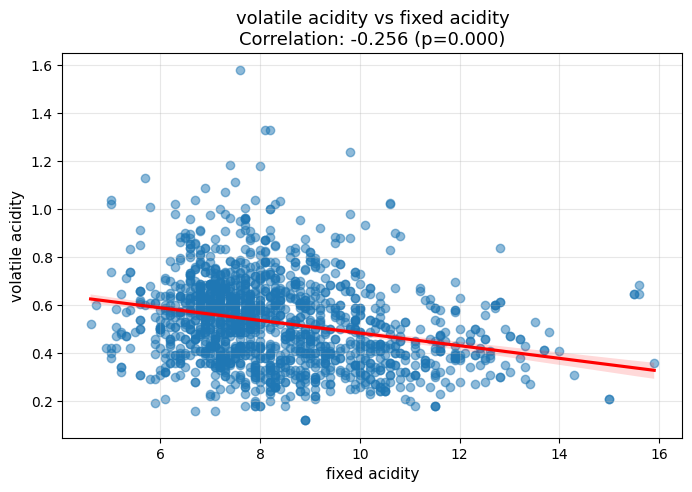

In [18]:
numeric_bivariate_plot(df, 'fixed acidity', 'volatile acidity')  

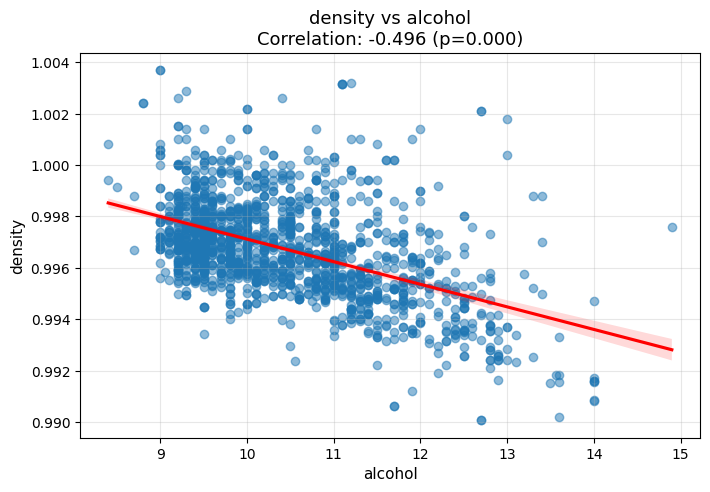

In [19]:
numeric_bivariate_plot(df, 'alcohol', 'density')

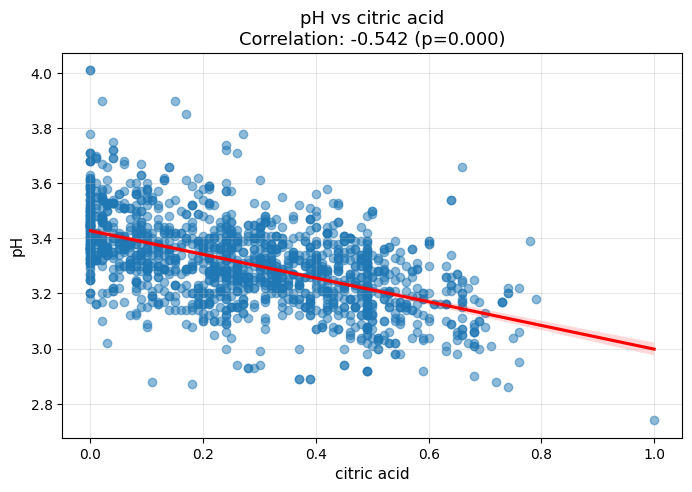

In [20]:
numeric_bivariate_plot(df, 'citric acid', 'pH')

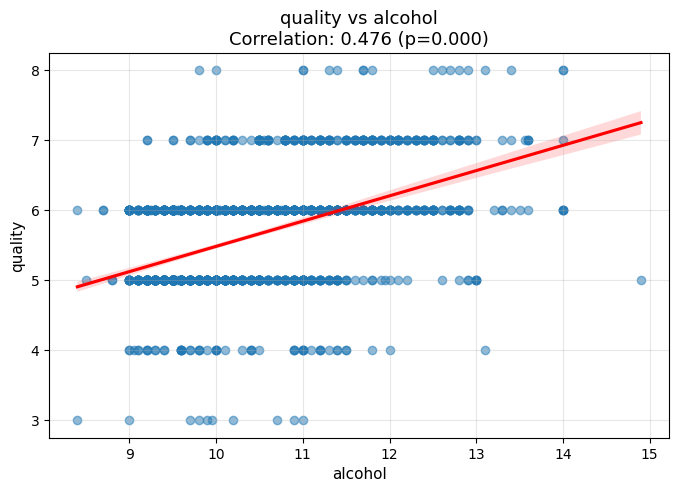

In [21]:
numeric_bivariate_plot(df, 'alcohol', 'quality')

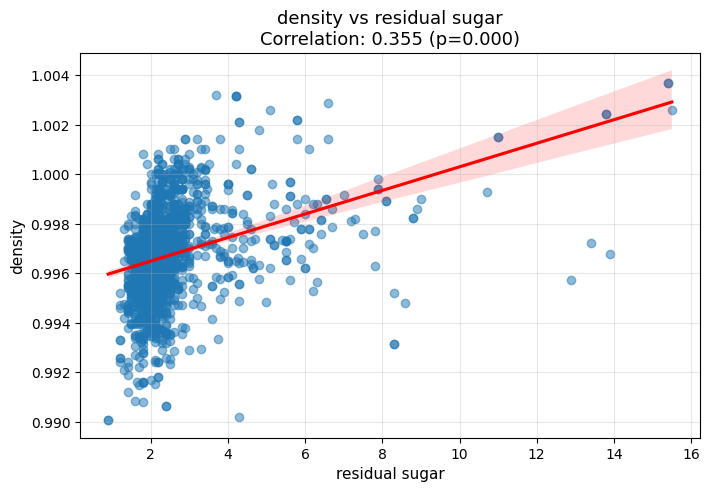

In [22]:
numeric_bivariate_plot(df, 'residual sugar', 'density')

In [23]:
def bivariate_num_cat(df, feature, target='quality_category'):
    
    print(f" Feature: {feature} vs {target}")
    print("=" * 50)
    
    summary = df.groupby(target)[feature].describe()[['mean', 'std', 'min', 'max']]
    print(summary)
    print()
    
    plt.figure(figsize = (10, 5))
    
    sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')
    plt.title(f'{feature} across {target} categories', fontsize=13)
    plt.xlabel(target)
    plt.ylabel(feature)
    plt.show()
    
    plt.figure(figsize=(10,5))
    sns.violinplot(x=target, y=feature, data=df, palette='Set3')
    plt.title(f'{feature} distributon by {target}', fontsize=13)
    plt.xlabel(target)
    plt.ylabel(feature)
    plt.show()

In [24]:
red_wine.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'quality_category'],
      dtype='object')

 Feature: fixed acidity vs quality_category
                      mean       std  min   max
quality_category                               
high              8.847005  1.999977  4.9  15.6
low               7.871429  1.649284  4.6  12.5
medium            8.254284  1.682935  4.7  15.9



C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


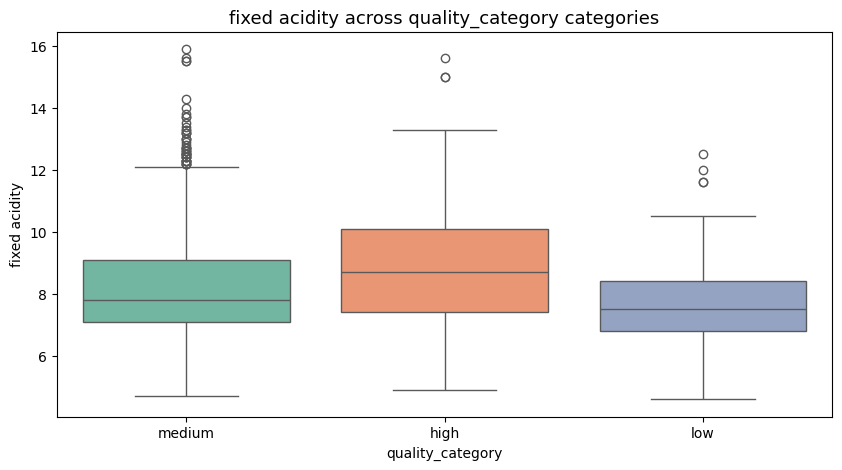

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


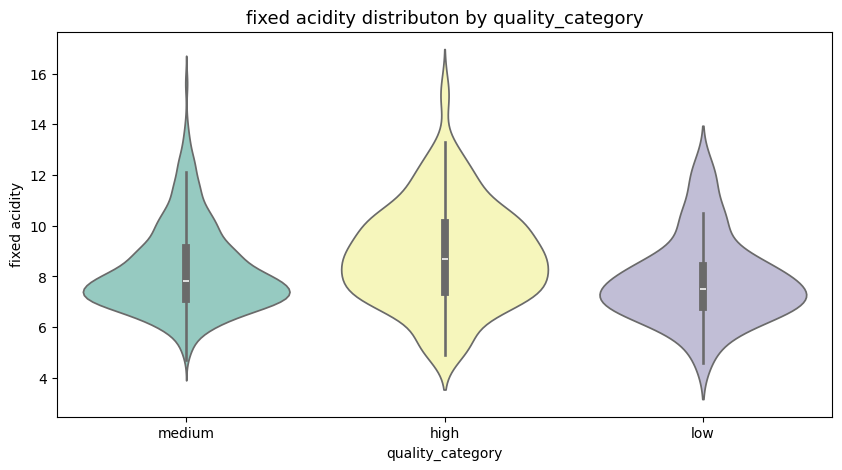

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


 Feature: volatile acidity vs quality_category
                      mean       std   min    max
quality_category                                 
high              0.405530  0.144963  0.12  0.915
low               0.724206  0.247970  0.23  1.580
medium            0.538560  0.167679  0.16  1.330



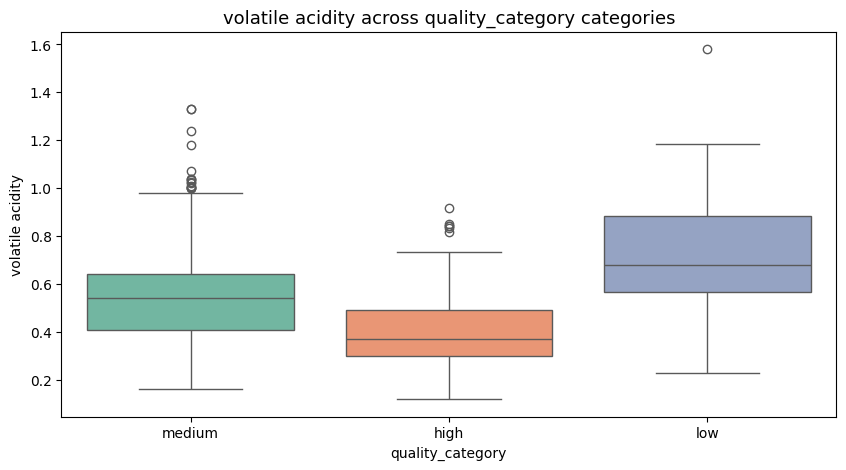

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


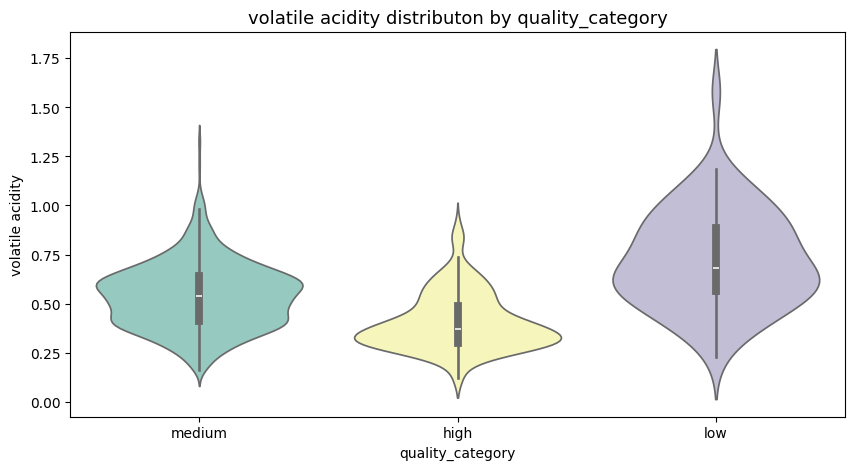

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


 Feature: citric acid vs quality_category
                      mean       std  min   max
quality_category                               
high              0.376498  0.194438  0.0  0.76
low               0.173651  0.207406  0.0  1.00
medium            0.258264  0.187995  0.0  0.79



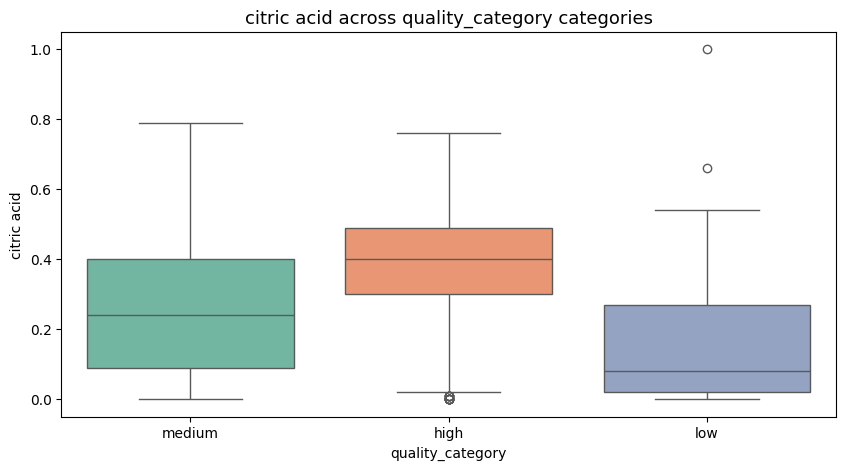

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


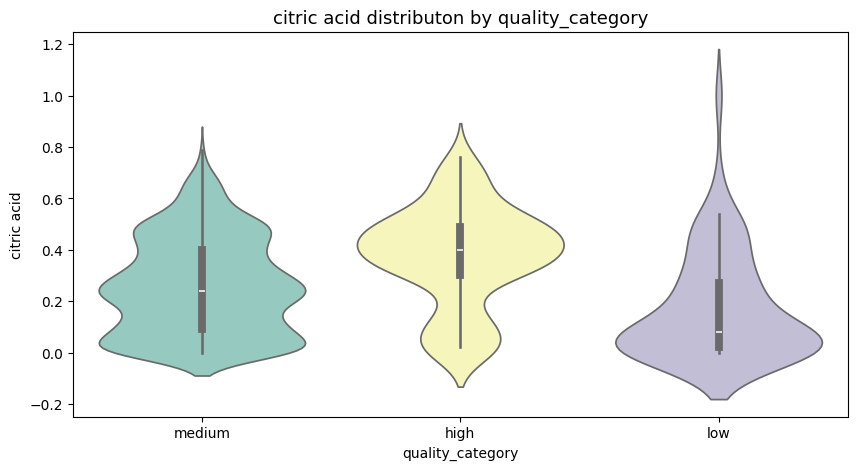

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


 Feature: residual sugar vs quality_category
                      mean       std  min   max
quality_category                               
high              2.708756  1.363026  1.2   8.9
low               2.684921  1.723735  1.2  12.9
medium            2.503867  1.399633  0.9  15.5



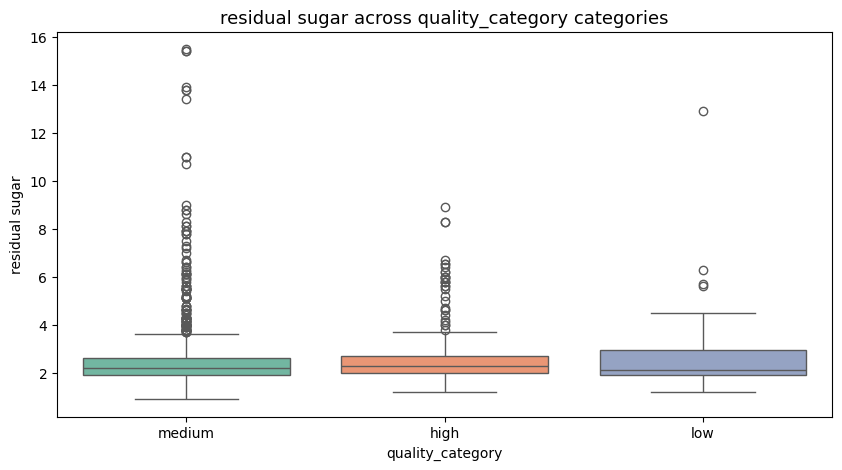

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


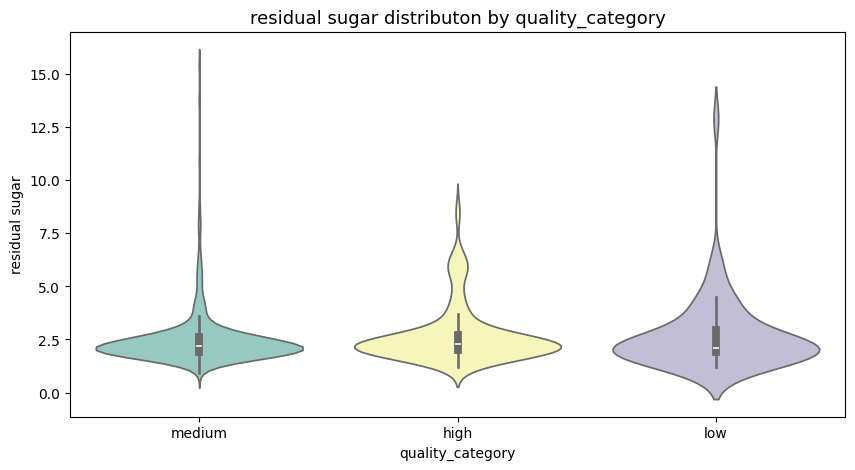

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


 Feature: chlorides vs quality_category
                      mean       std    min    max
quality_category                                  
high              0.075912  0.028480  0.012  0.358
low               0.095730  0.075121  0.045  0.610
medium            0.088973  0.047538  0.034  0.611



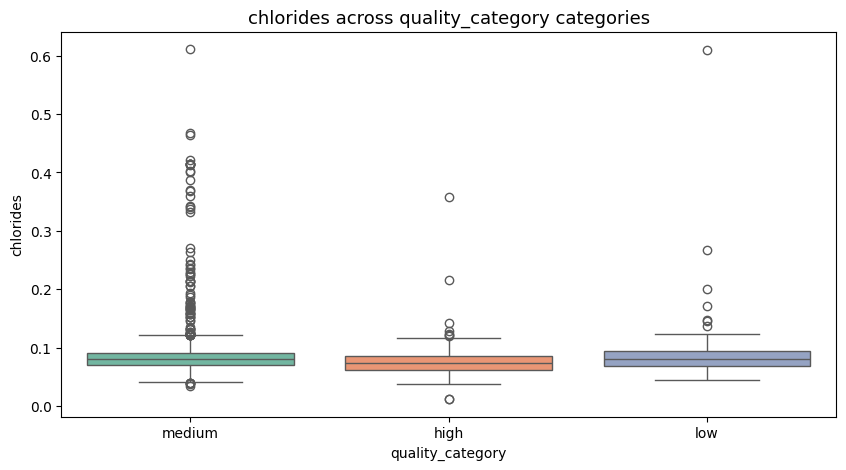

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


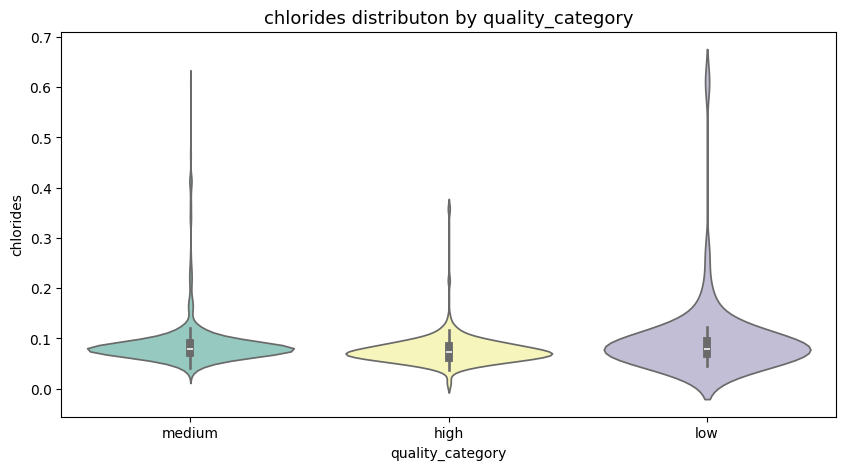

 Feature: free sulfur dioxide vs quality_category
                       mean        std  min   max
quality_category                                 
high              13.981567  10.234615  3.0  54.0
low               12.063492   9.076508  3.0  41.0
medium            16.368461  10.492335  1.0  72.0



C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


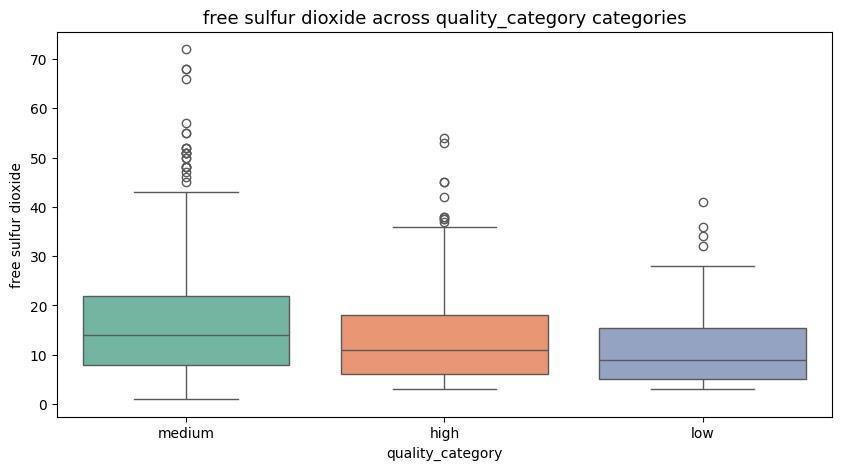

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


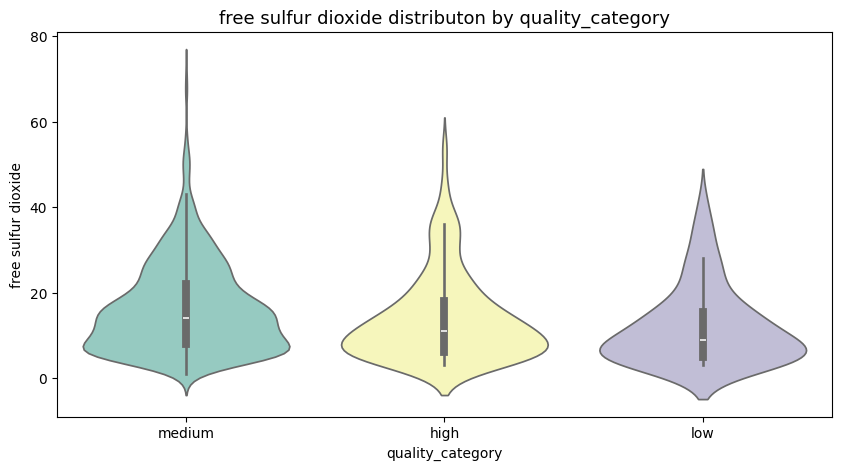

 Feature: total sulfur dioxide vs quality_category
                       mean        std  min    max
quality_category                                  
high              34.889401  32.572238  7.0  289.0
low               34.444444  26.395123  7.0  119.0
medium            48.946929  32.714030  6.0  165.0



C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


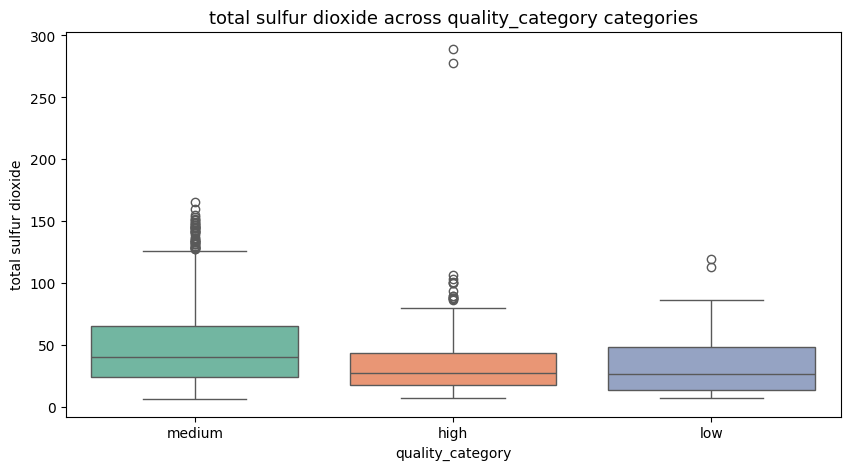

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


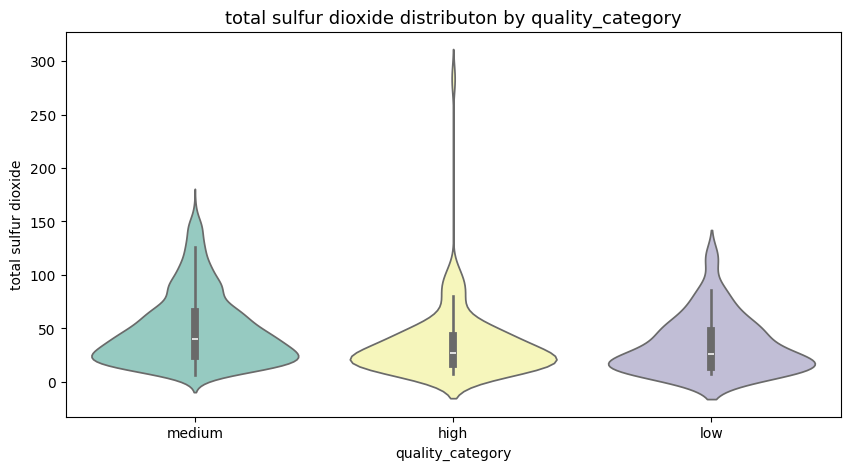

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


 Feature: density vs quality_category
                      mean       std      min      max
quality_category                                      
high              0.996030  0.002201  0.99064  1.00320
low               0.996689  0.001667  0.99340  1.00100
medium            0.996867  0.001815  0.99007  1.00369



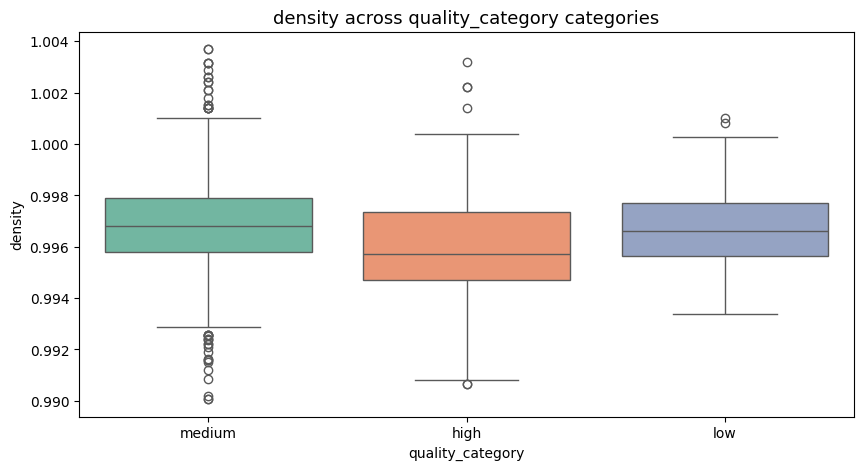

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


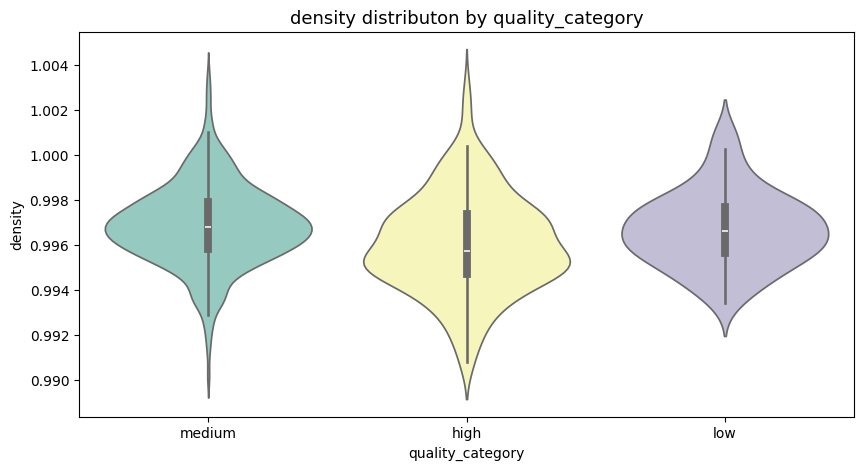

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


 Feature: pH vs quality_category
                      mean       std   min   max
quality_category                                
high              3.288802  0.154478  2.88  3.78
low               3.384127  0.175100  2.74  3.90
medium            3.311296  0.152345  2.86  4.01



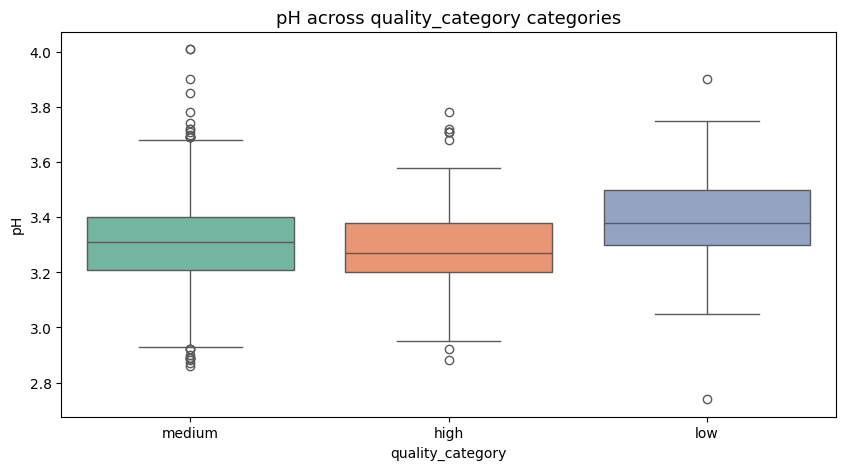

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


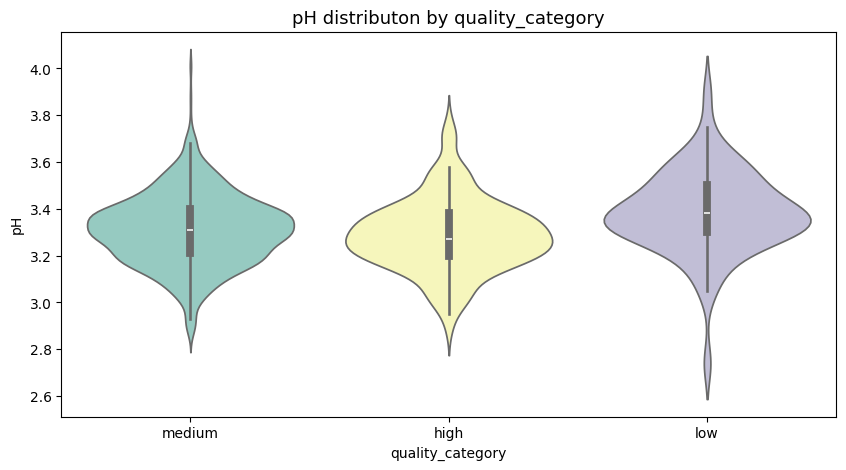

 Feature: sulphates vs quality_category
                      mean       std   min   max
quality_category                                
high              0.743456  0.134038  0.39  1.36
low               0.592222  0.224323  0.33  2.00
medium            0.647263  0.167334  0.37  1.98



C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


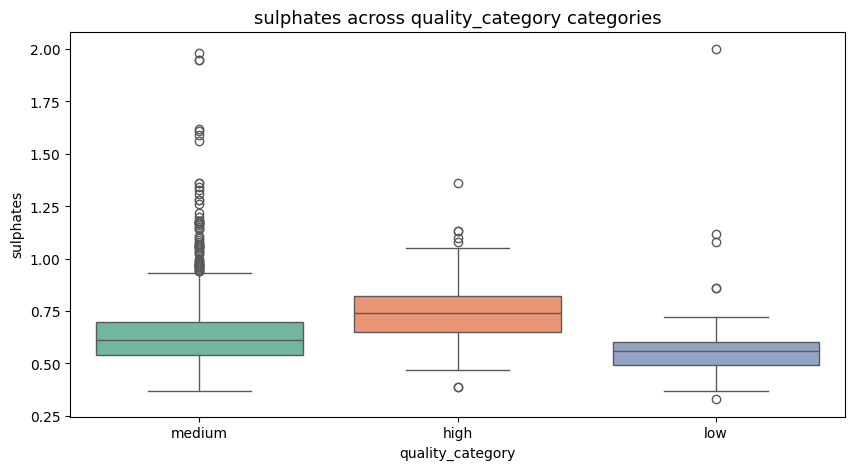

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


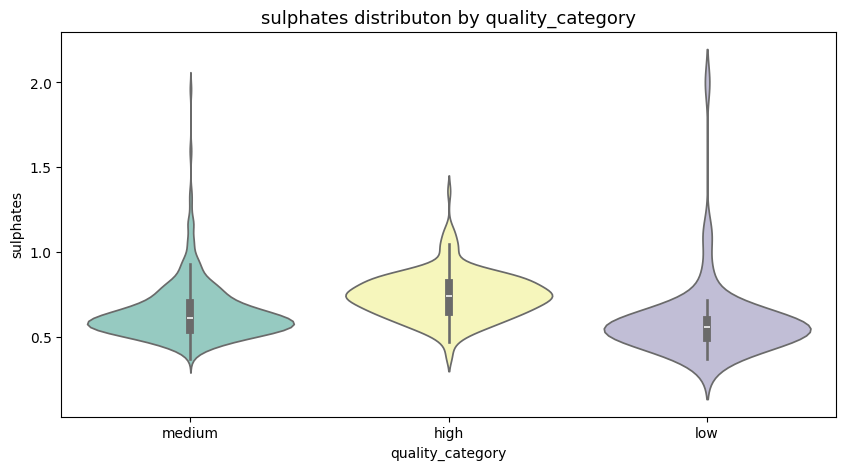

 Feature: alcohol vs quality_category
                       mean       std  min   max
quality_category                                
high              11.518049  0.998153  9.2  14.0
low               10.215873  0.918178  8.4  13.1
medium            10.252717  0.972354  8.4  14.9



C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


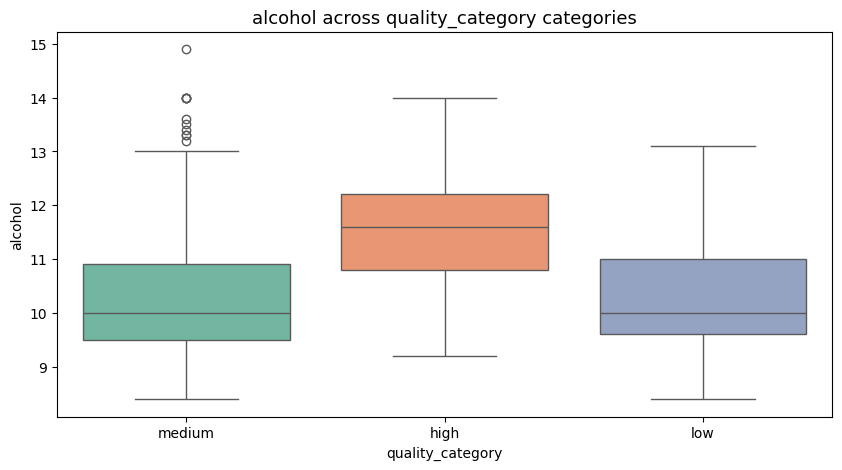

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


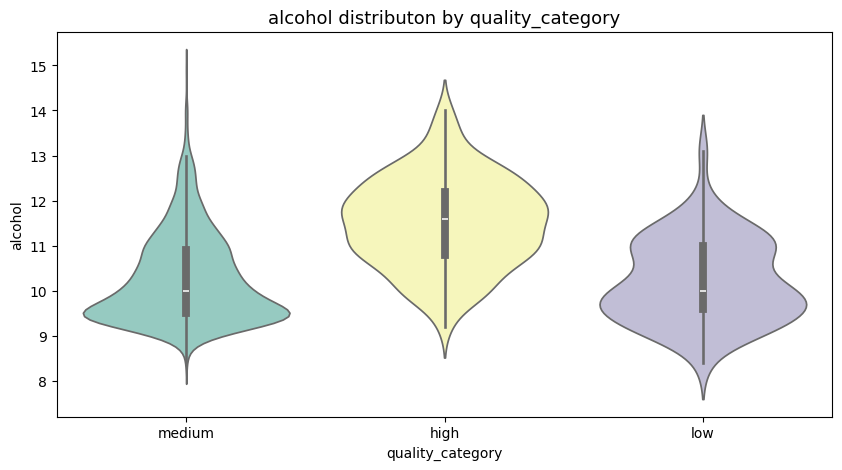

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = target, y = feature, data = df, palette = 'Set2')


 Feature: quality vs quality_category
                      mean       std  min  max
quality_category                              
high              7.082949  0.276443  7.0  8.0
low               3.841270  0.368359  3.0  4.0
medium            5.483700  0.499924  5.0  6.0



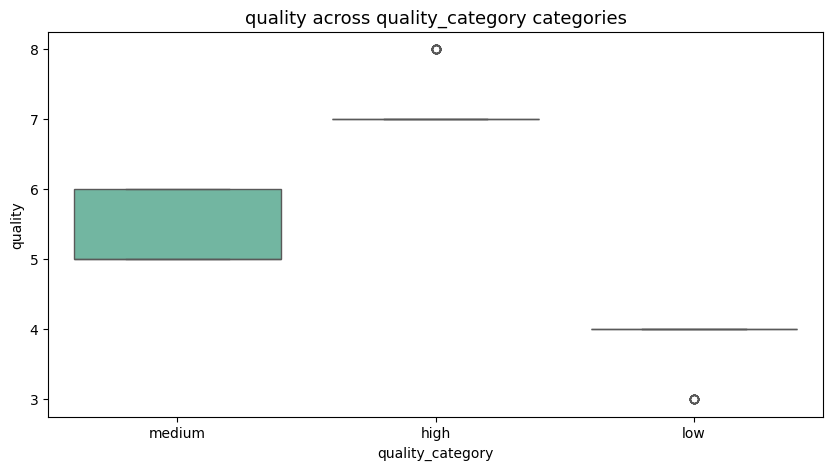

C:\Users\user49\AppData\Local\Temp\ipykernel_7508\583392141.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=df, palette='Set3')


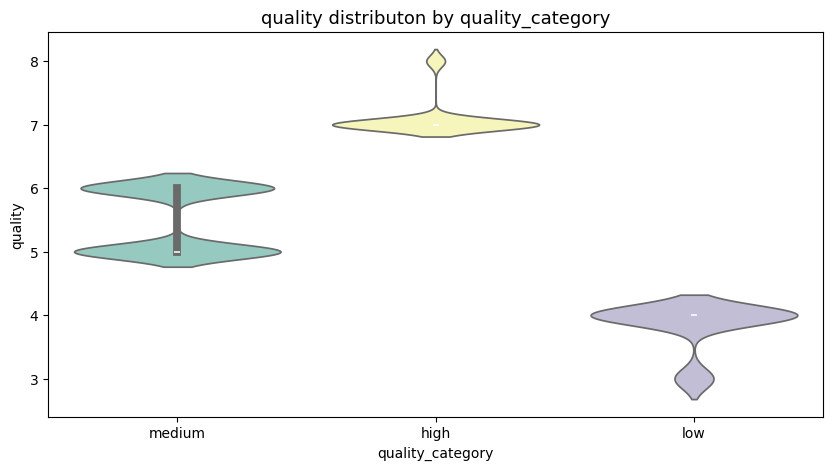

In [25]:
for col in num_cols:
    bivariate_num_cat(df, col, target="quality_category")



In [26]:
def trivariate_plot(df, x_col, y_col, hue_col):
    """
    Visualizes the relationship between two numeric variables
    with a third categorical variable shown by color (hue).
    
    Parameters
    ----------
    df : pandas.DataFrame
        The dataset.
    x_col : str
        The first numeric feature (x-axis).
    y_col : str
        The second numeric feature (y-axis).
    hue_col : str
        The categorical feature (color grouping).
    """

    plt.figure(figsize=(8, 6))
    sns.lmplot(
        data=df, 
        x=x_col, 
        y=y_col, 
        hue=hue_col, 
        height=6, 
        aspect=1.2, 
        scatter_kws={'alpha':0.6}, 
        line_kws={'linewidth':2}
    )
    plt.title(f"{y_col} vs {x_col} by {hue_col}", fontsize=13)
    plt.xlabel(x_col, fontsize=11)
    plt.ylabel(y_col, fontsize=11)
    plt.grid(alpha=0.3)
    plt.show()


<Figure size 800x600 with 0 Axes>

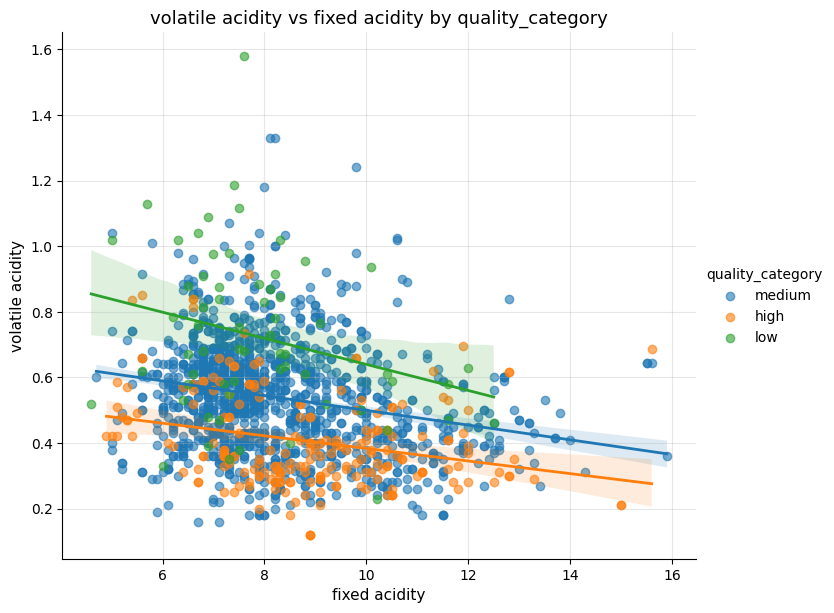

<Figure size 800x600 with 0 Axes>

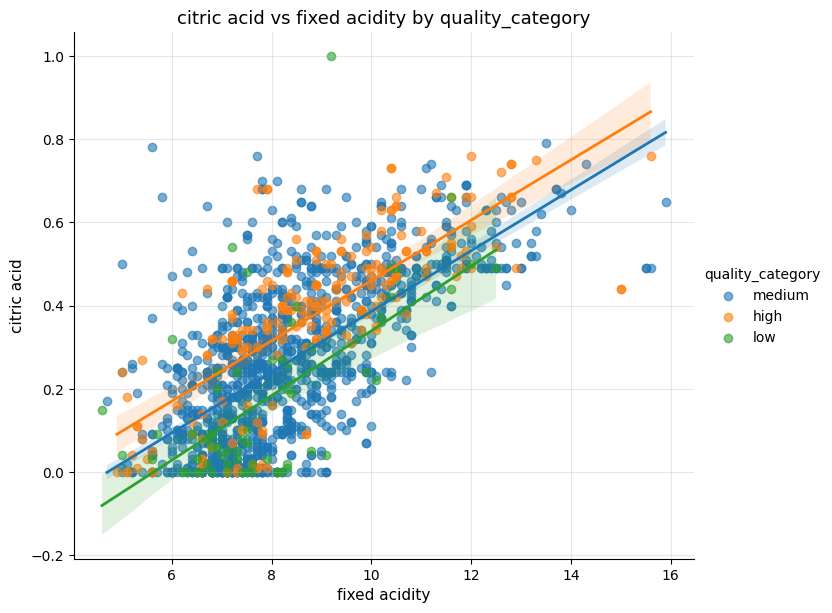

<Figure size 800x600 with 0 Axes>

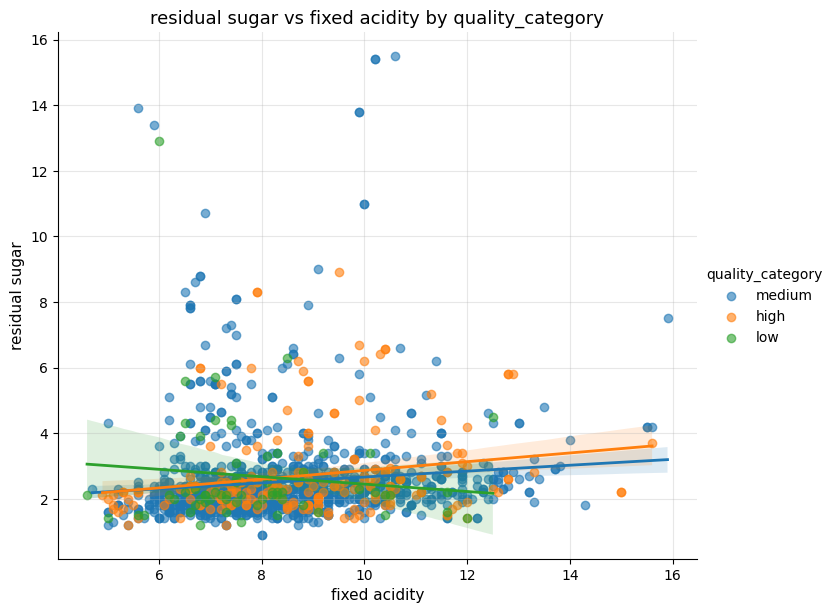

<Figure size 800x600 with 0 Axes>

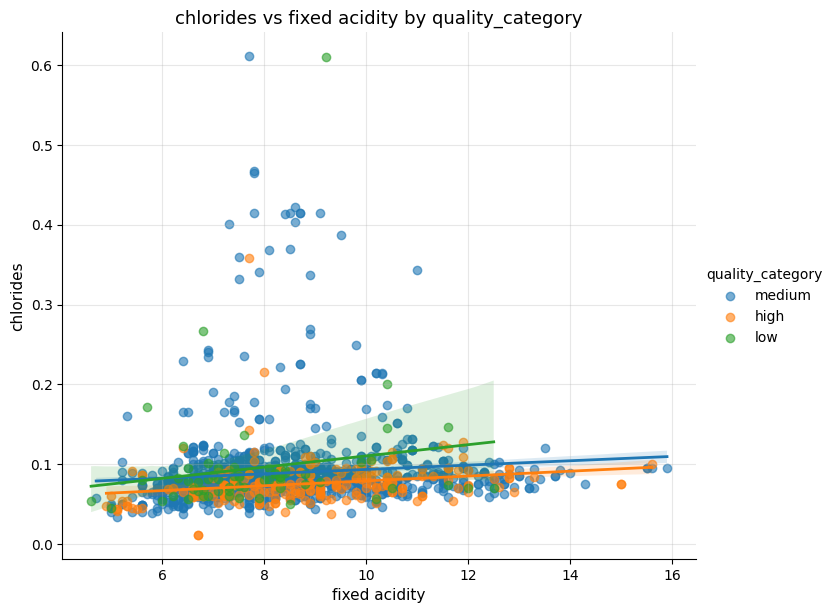

<Figure size 800x600 with 0 Axes>

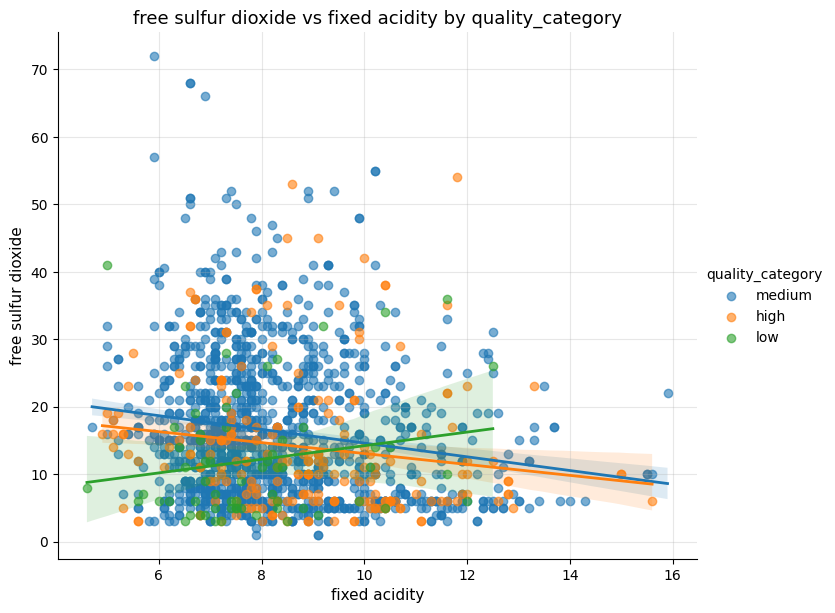

<Figure size 800x600 with 0 Axes>

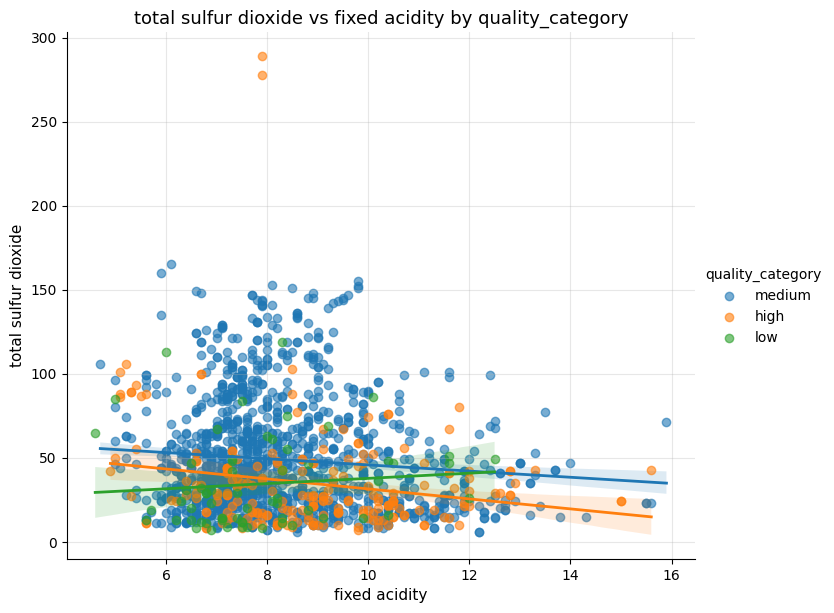

<Figure size 800x600 with 0 Axes>

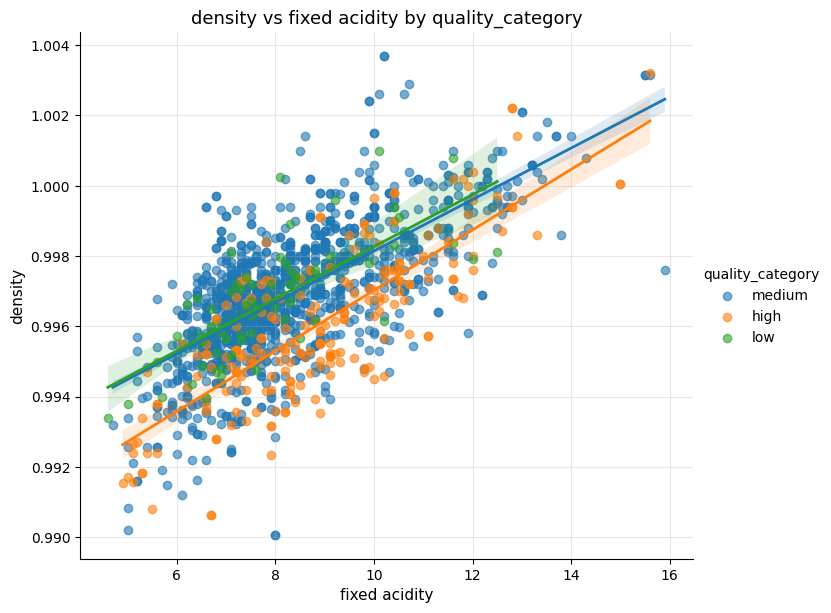

<Figure size 800x600 with 0 Axes>

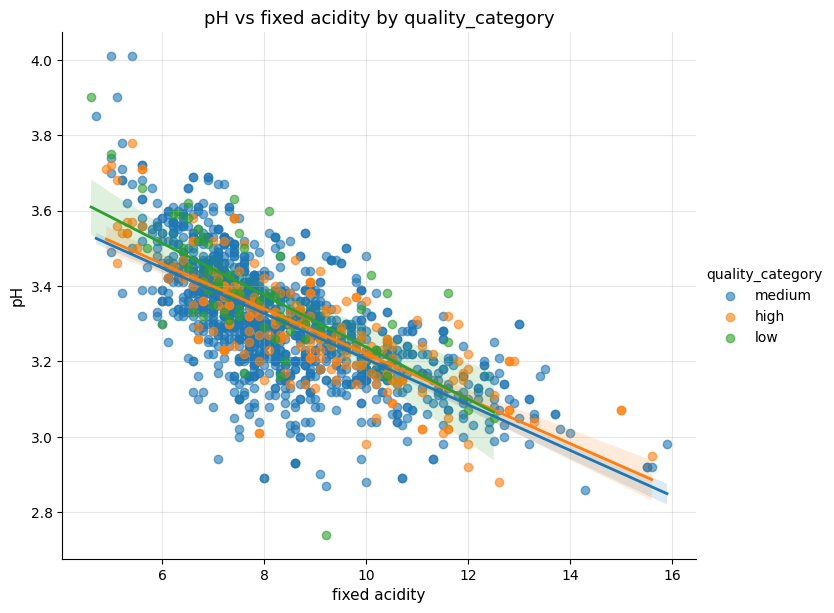

<Figure size 800x600 with 0 Axes>

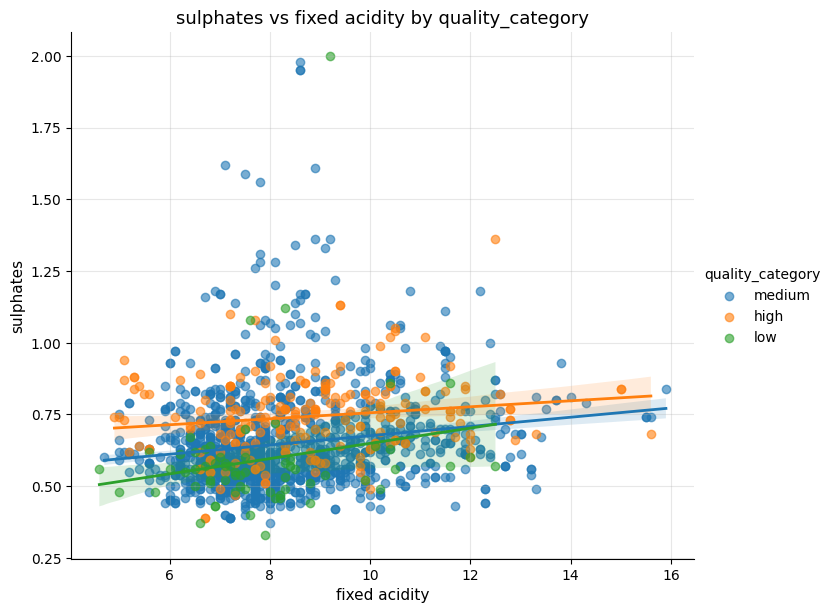

<Figure size 800x600 with 0 Axes>

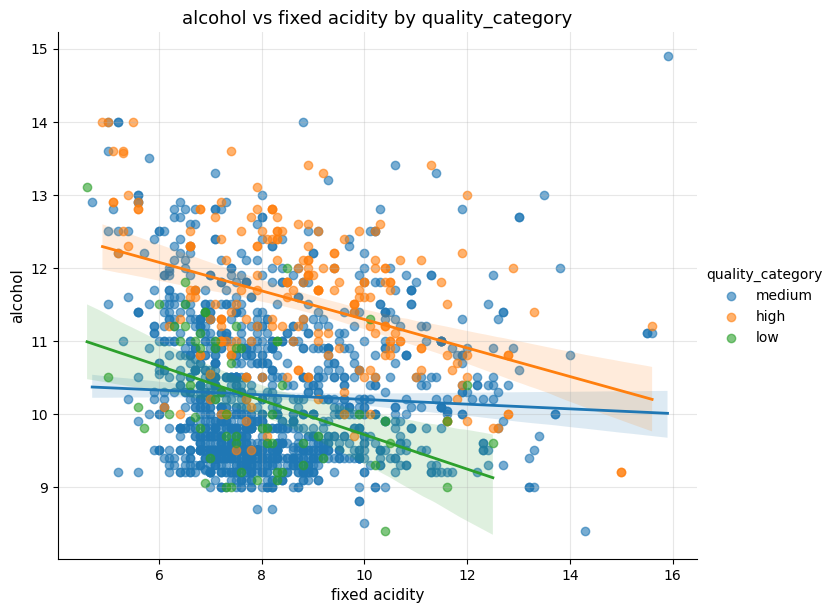

<Figure size 800x600 with 0 Axes>

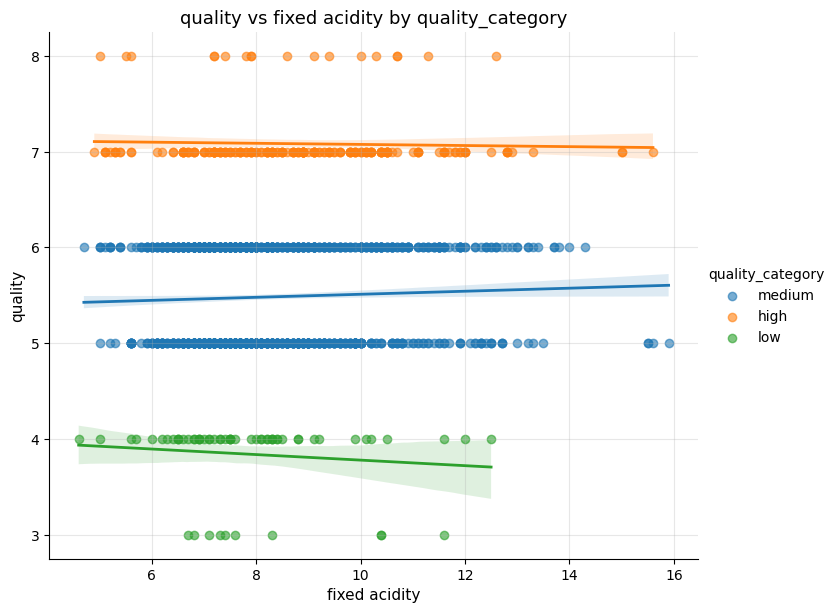

<Figure size 800x600 with 0 Axes>

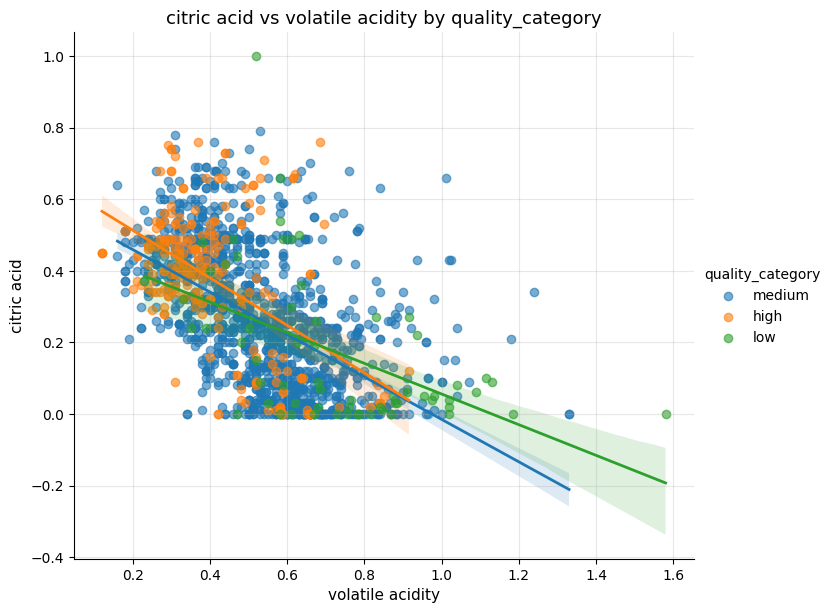

<Figure size 800x600 with 0 Axes>

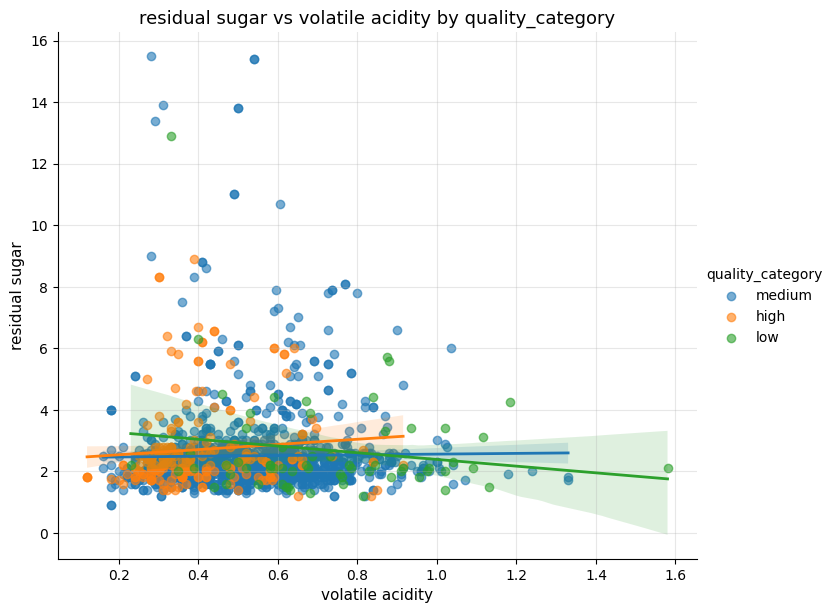

<Figure size 800x600 with 0 Axes>

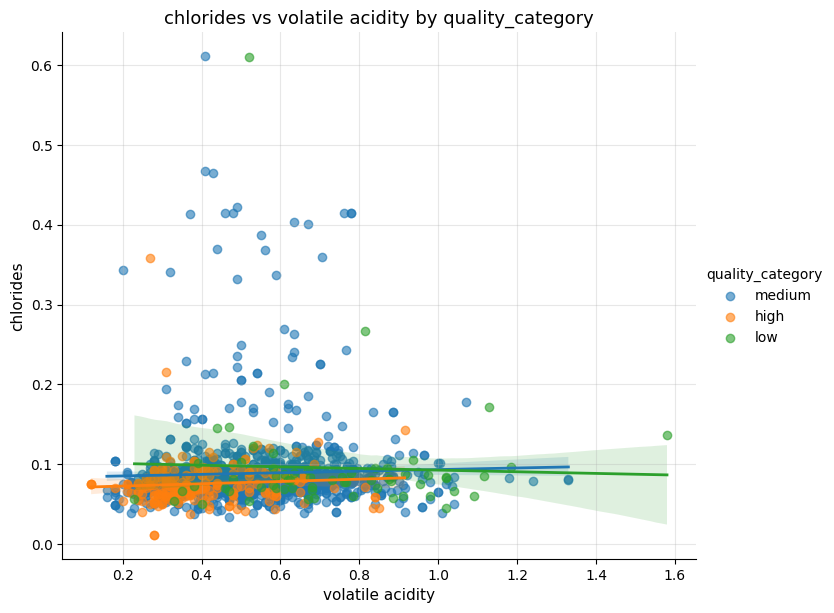

<Figure size 800x600 with 0 Axes>

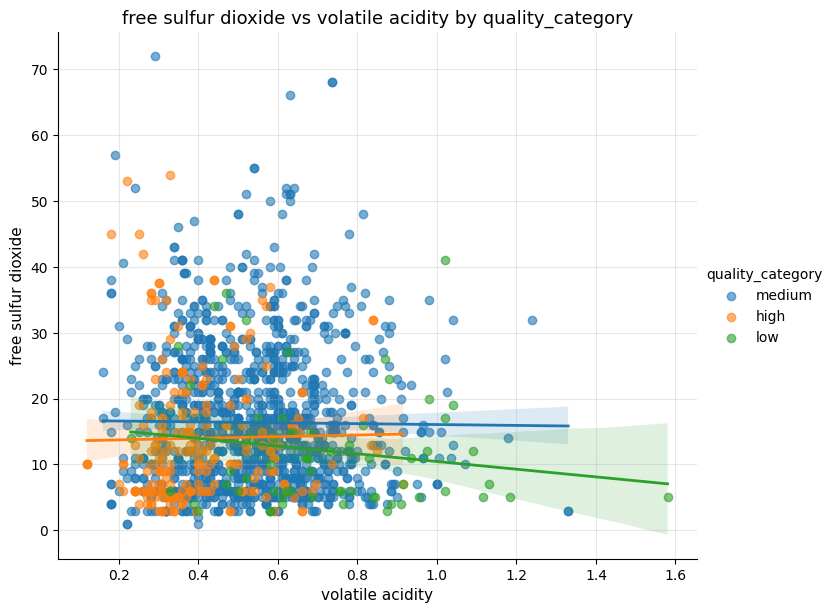

<Figure size 800x600 with 0 Axes>

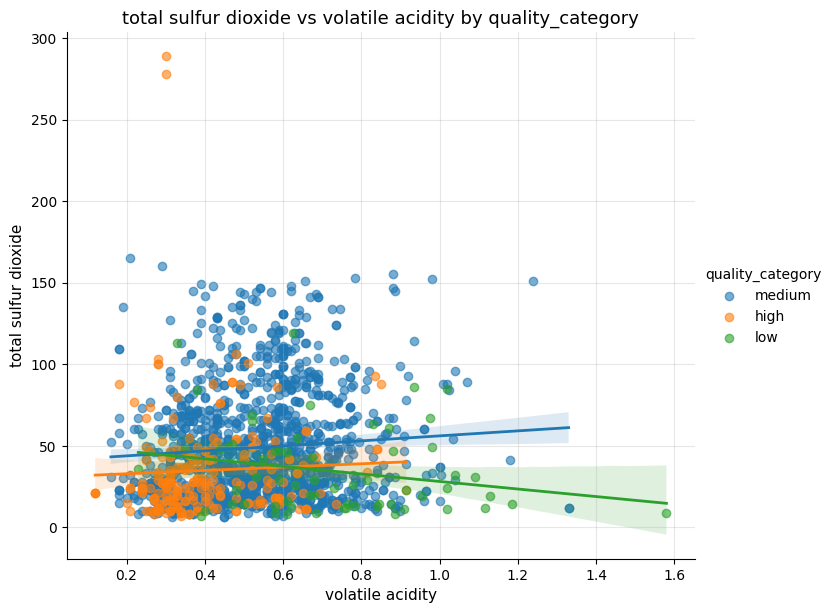

<Figure size 800x600 with 0 Axes>

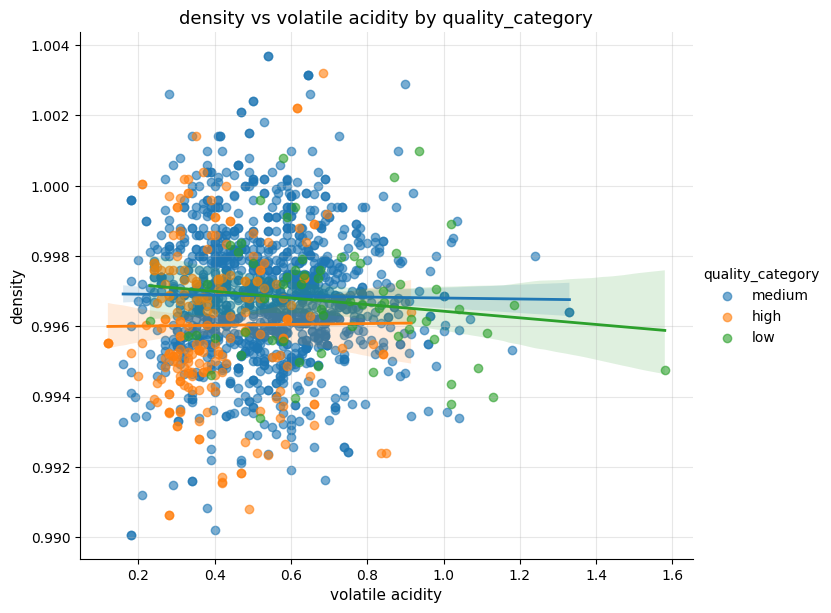

<Figure size 800x600 with 0 Axes>

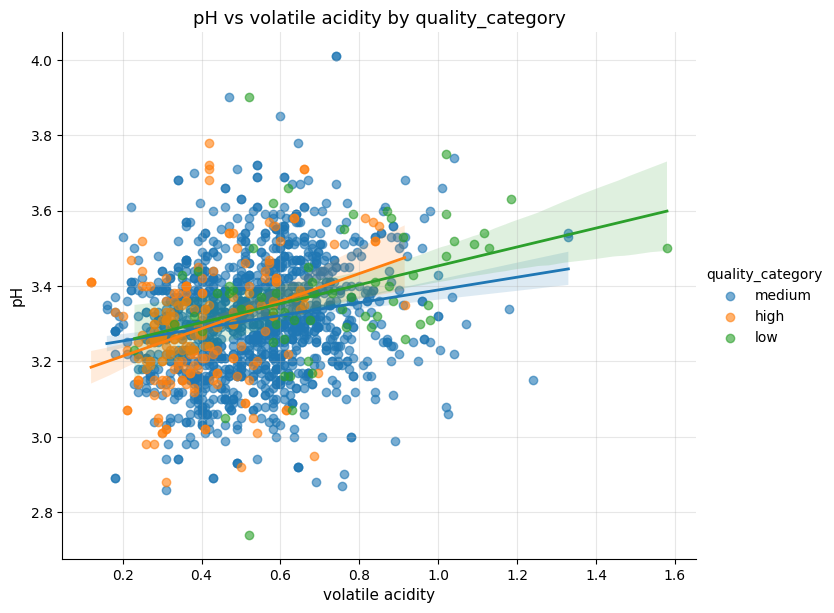

<Figure size 800x600 with 0 Axes>

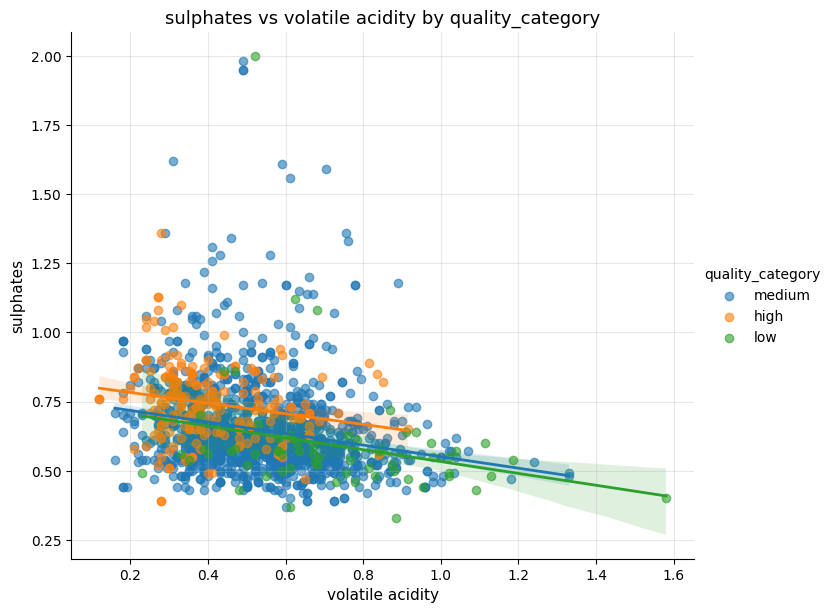

<Figure size 800x600 with 0 Axes>

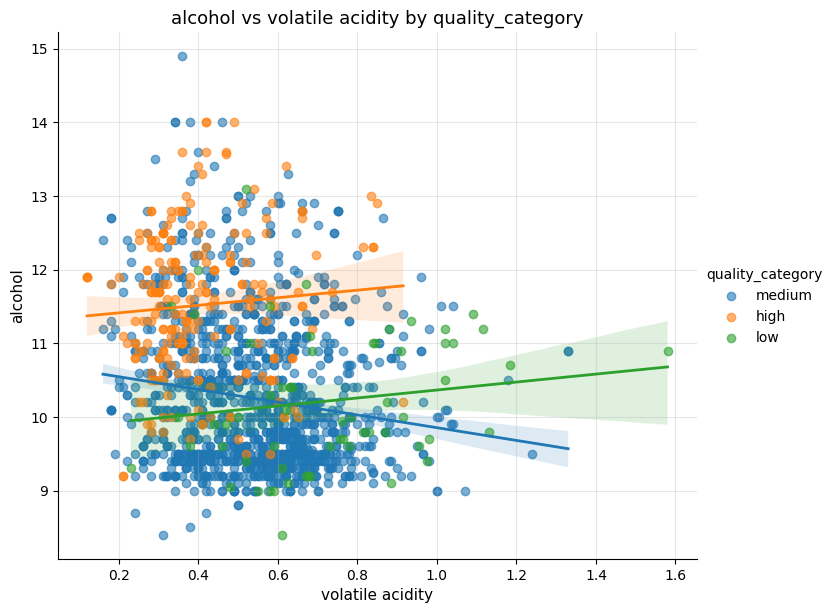

<Figure size 800x600 with 0 Axes>

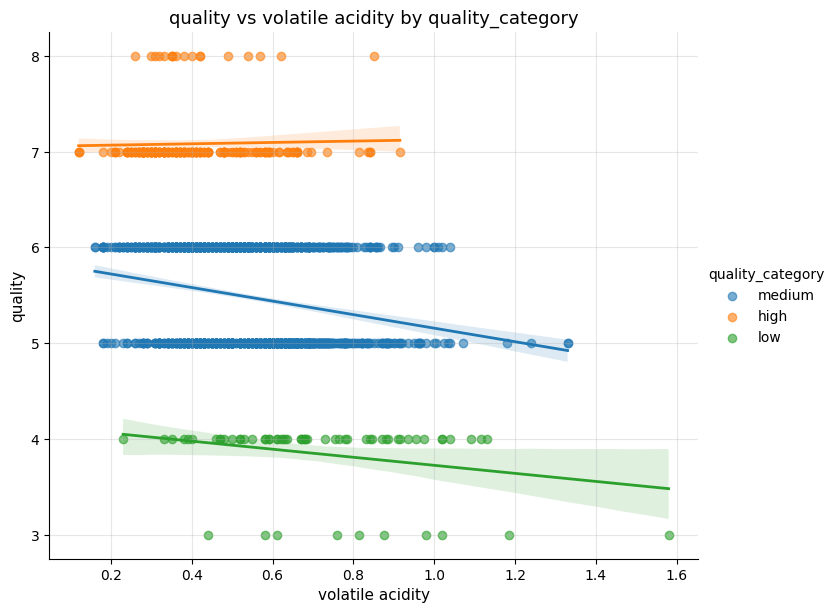

<Figure size 800x600 with 0 Axes>

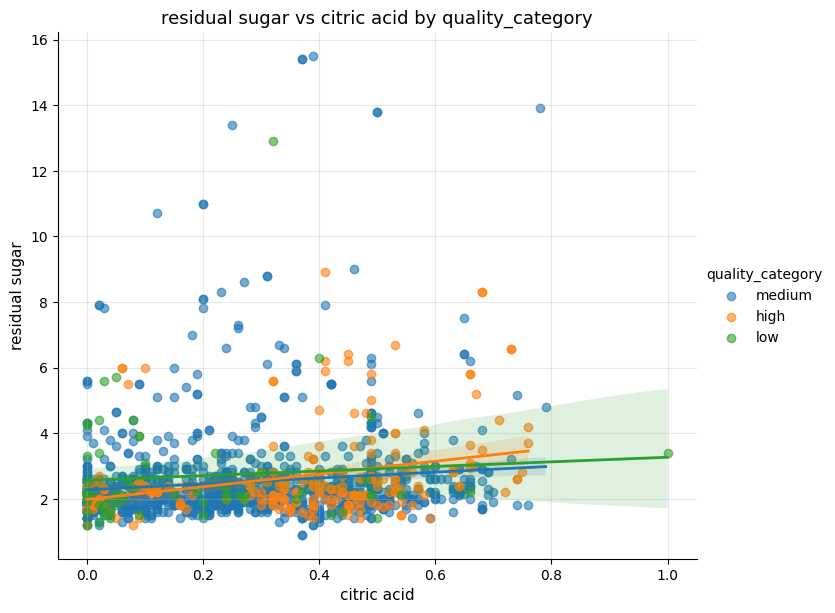

<Figure size 800x600 with 0 Axes>

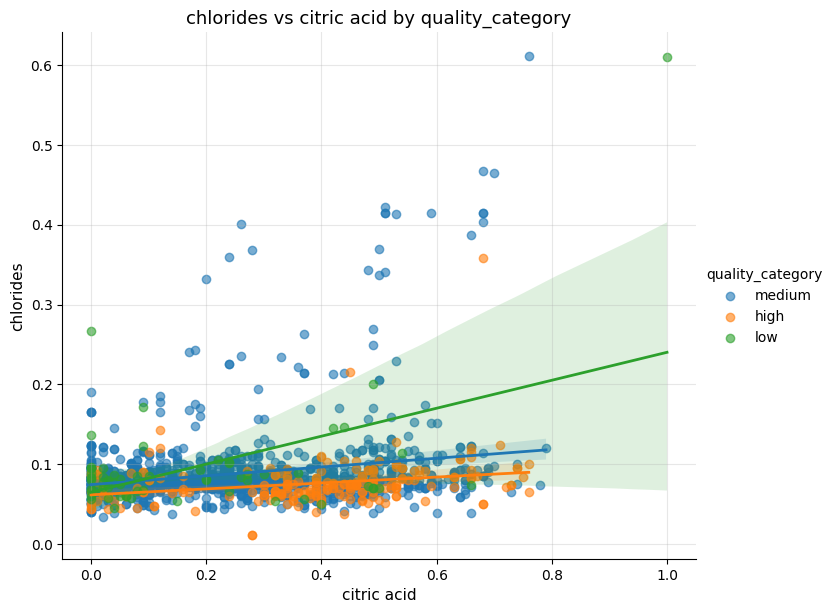

<Figure size 800x600 with 0 Axes>

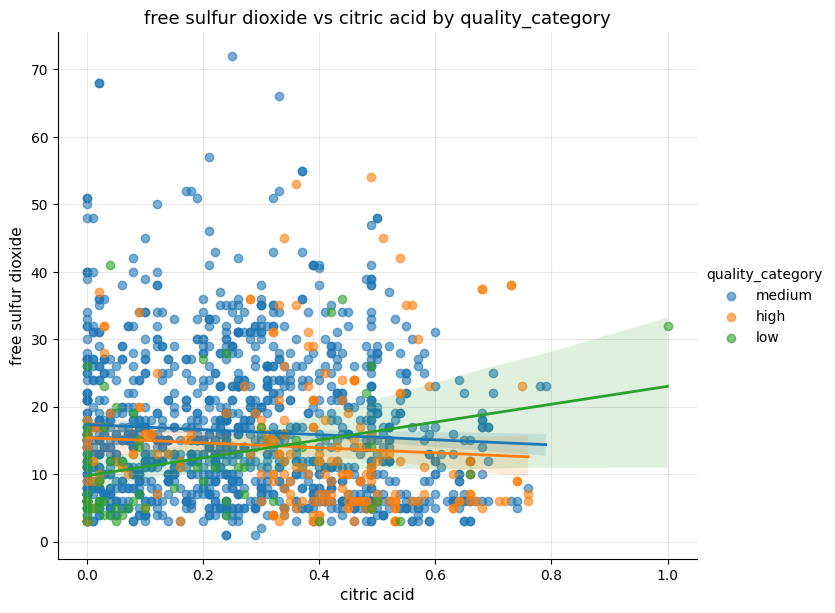

<Figure size 800x600 with 0 Axes>

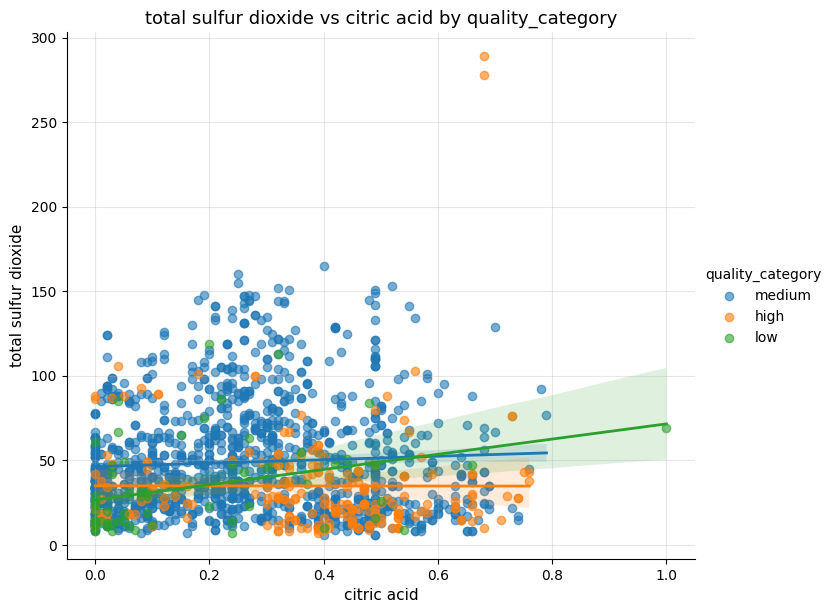

<Figure size 800x600 with 0 Axes>

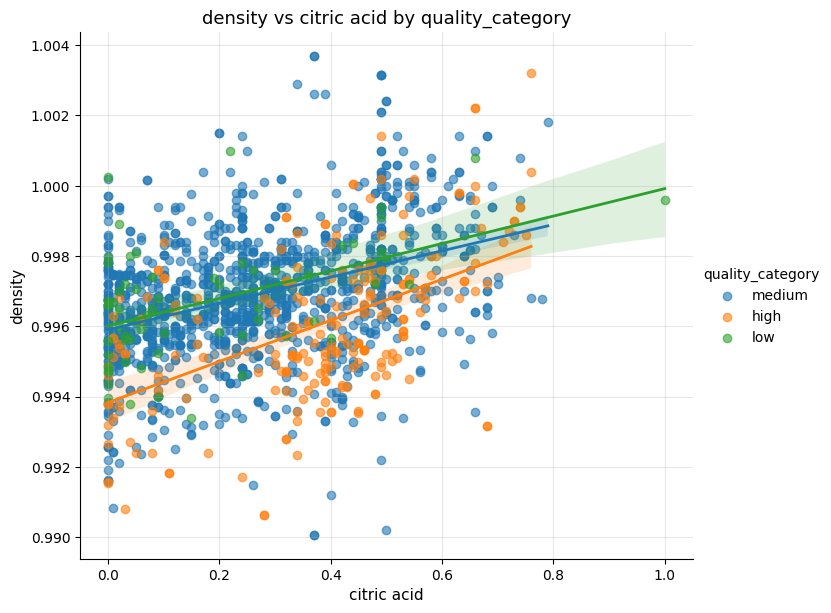

<Figure size 800x600 with 0 Axes>

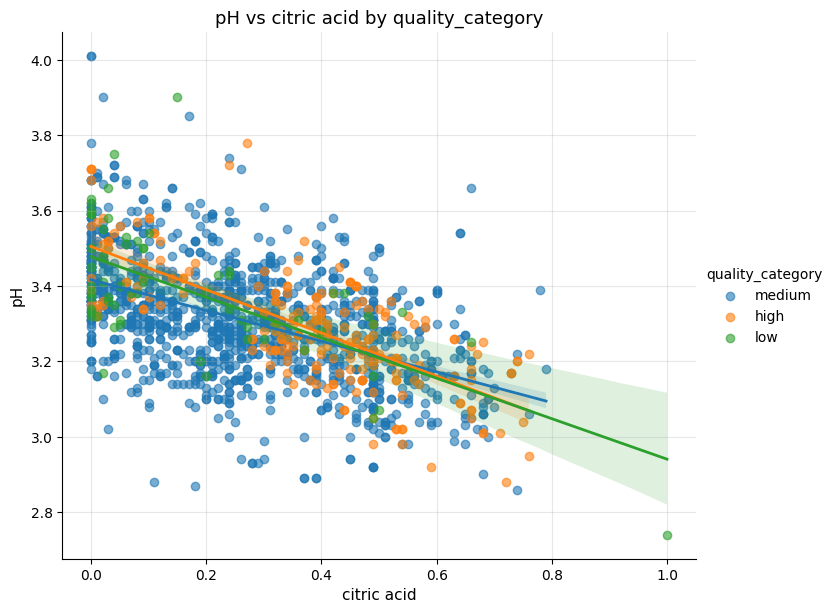

<Figure size 800x600 with 0 Axes>

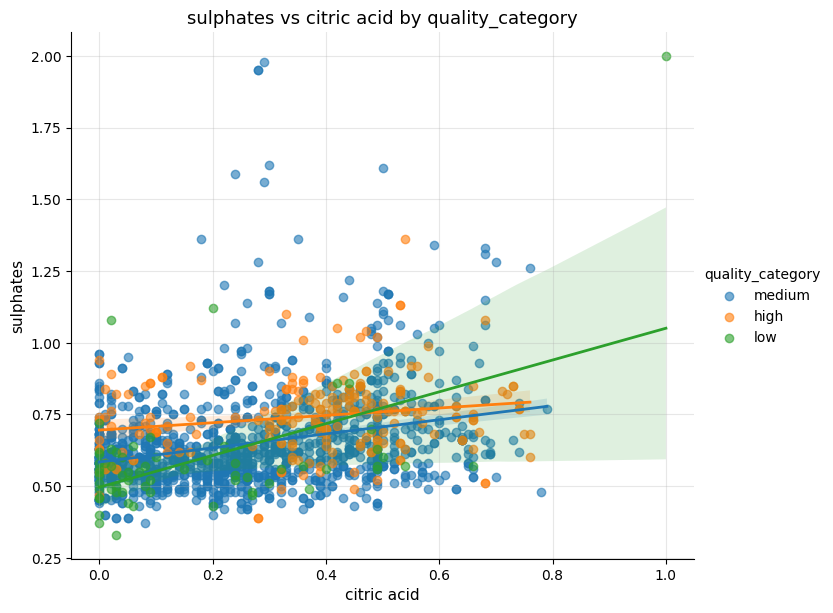

<Figure size 800x600 with 0 Axes>

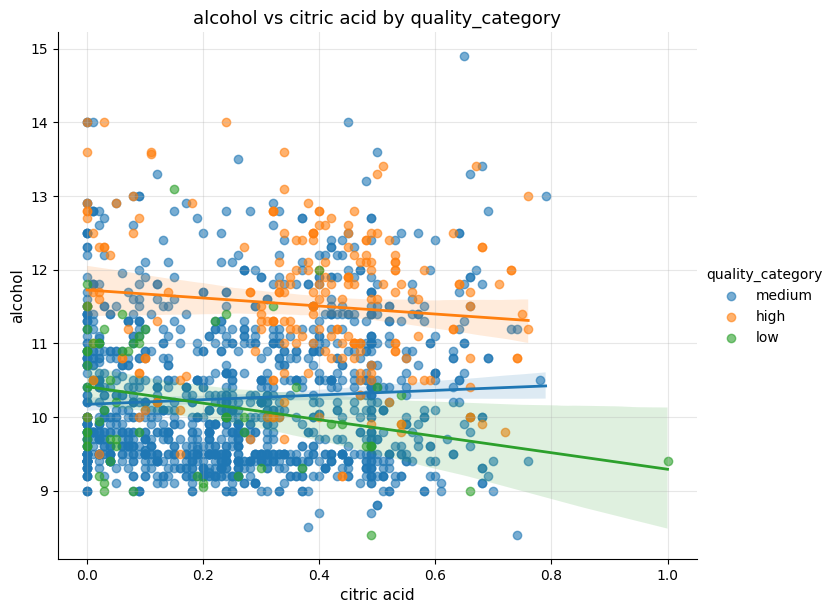

<Figure size 800x600 with 0 Axes>

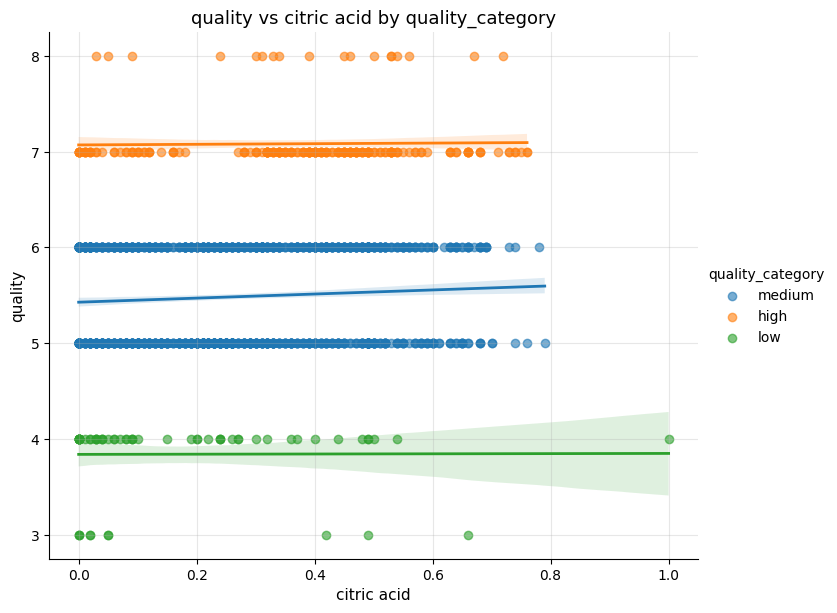

<Figure size 800x600 with 0 Axes>

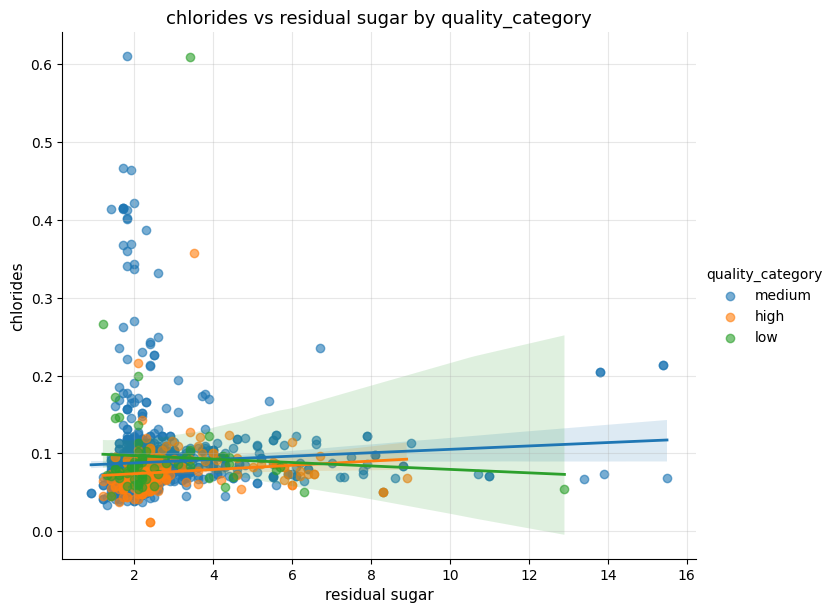

<Figure size 800x600 with 0 Axes>

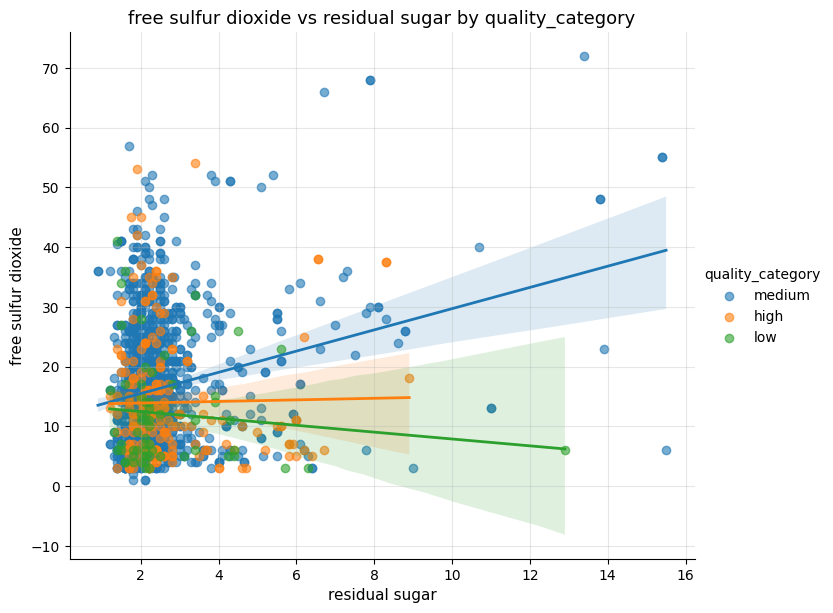

<Figure size 800x600 with 0 Axes>

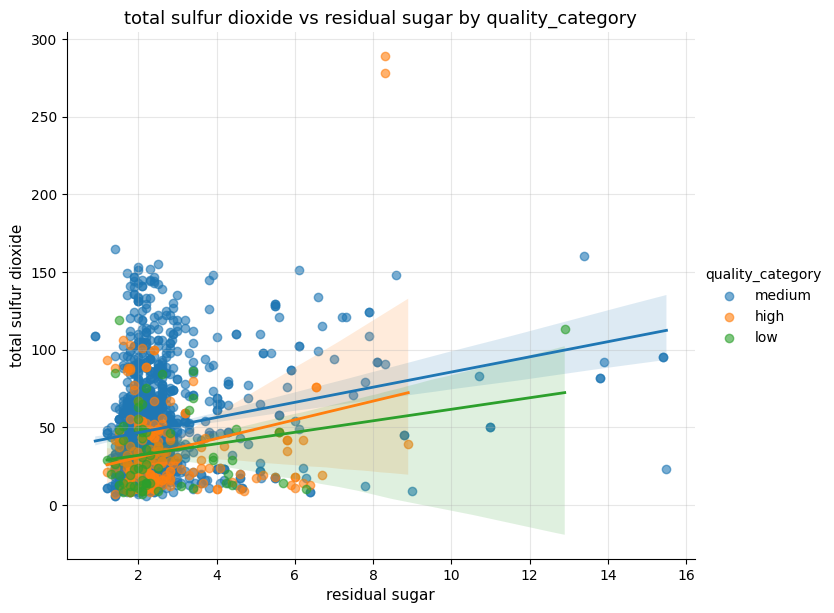

<Figure size 800x600 with 0 Axes>

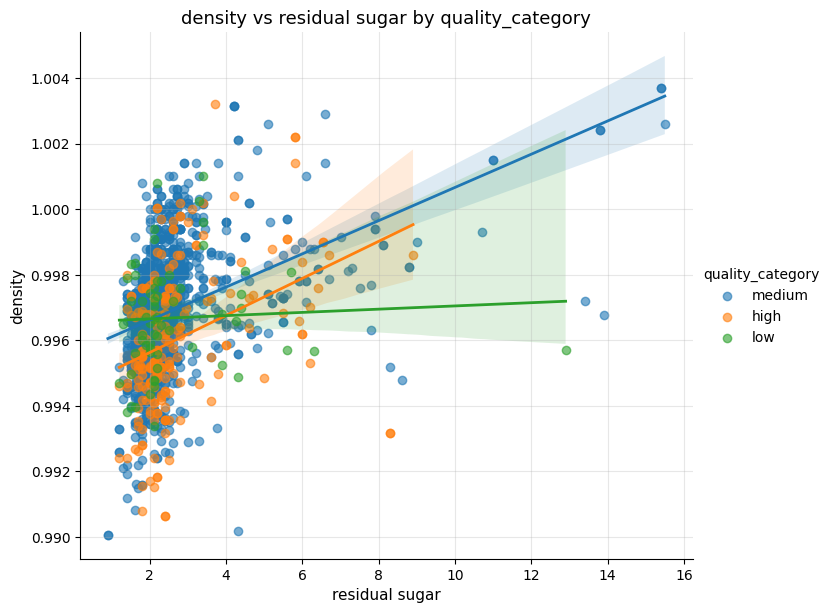

<Figure size 800x600 with 0 Axes>

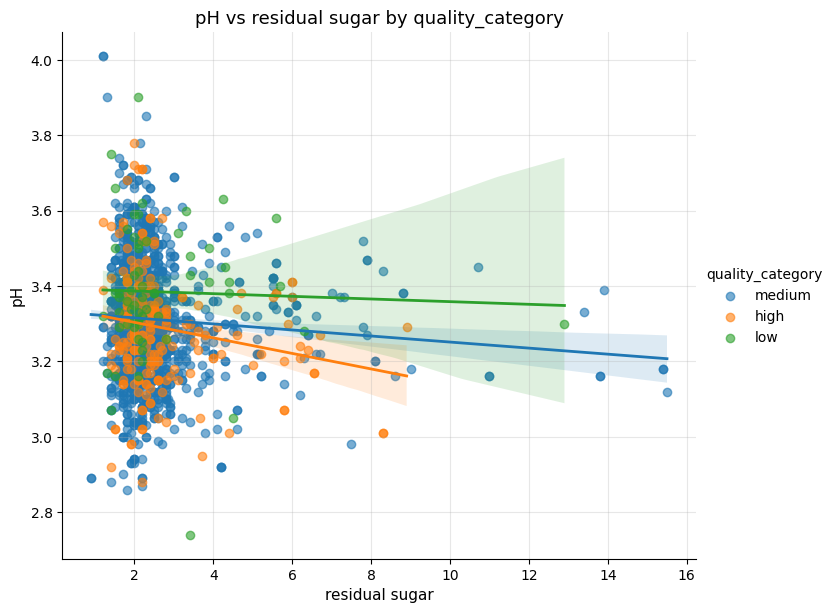

<Figure size 800x600 with 0 Axes>

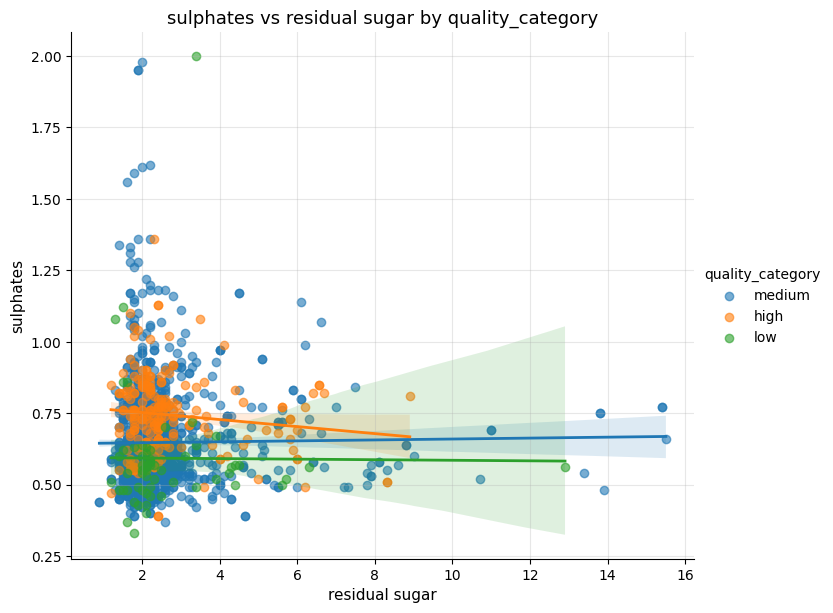

<Figure size 800x600 with 0 Axes>

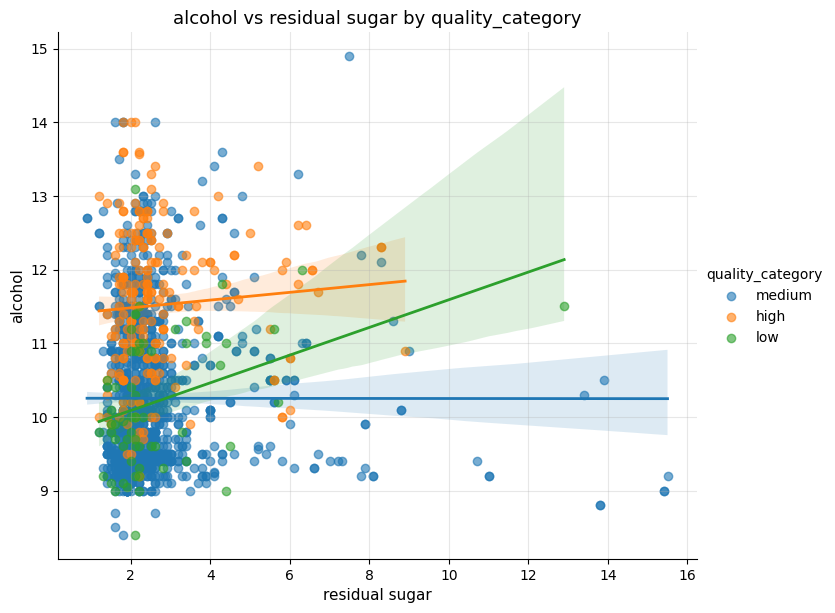

<Figure size 800x600 with 0 Axes>

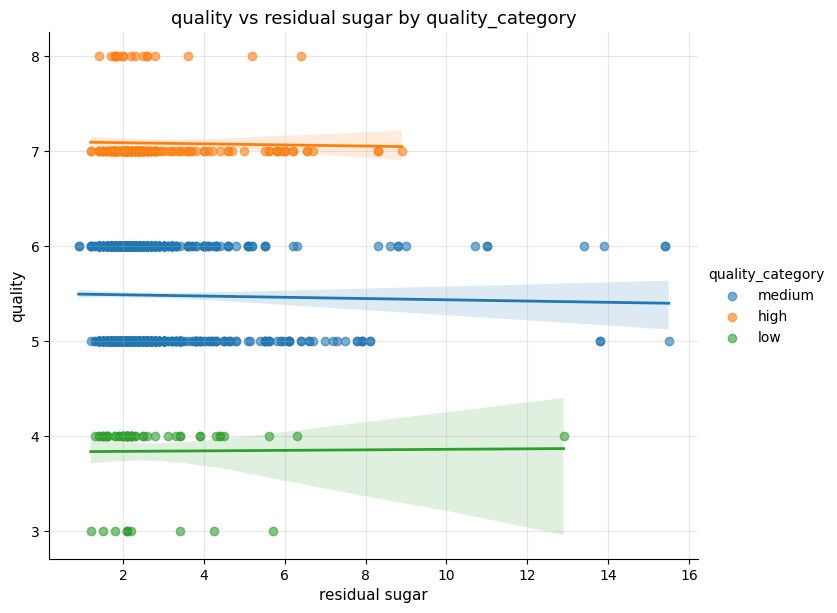

<Figure size 800x600 with 0 Axes>

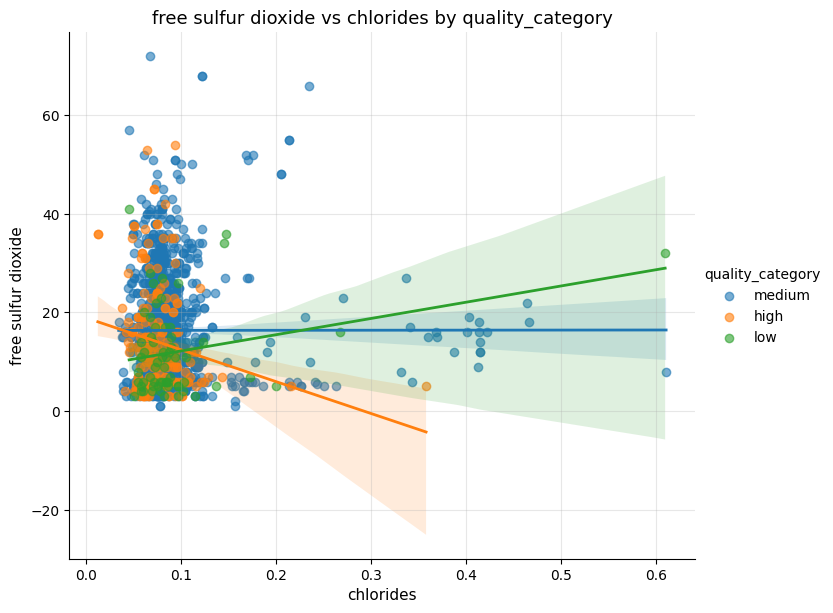

<Figure size 800x600 with 0 Axes>

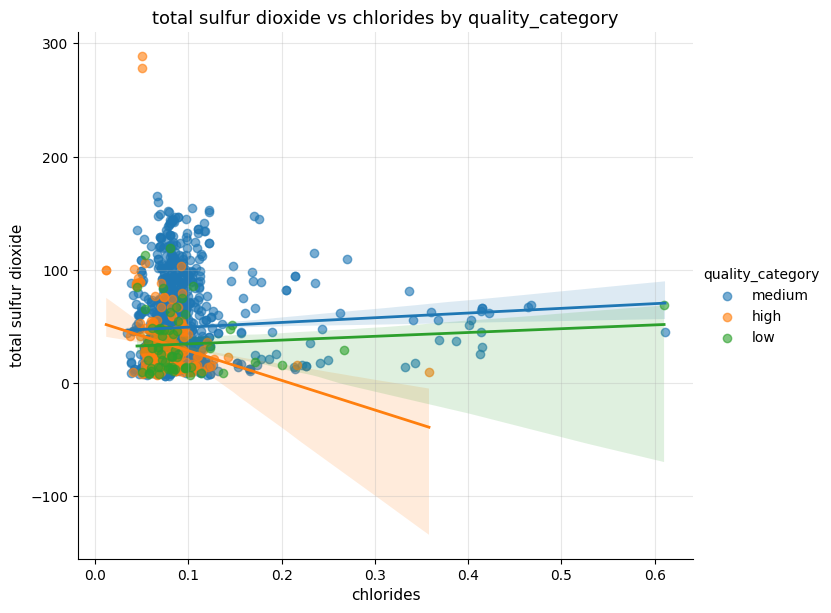

<Figure size 800x600 with 0 Axes>

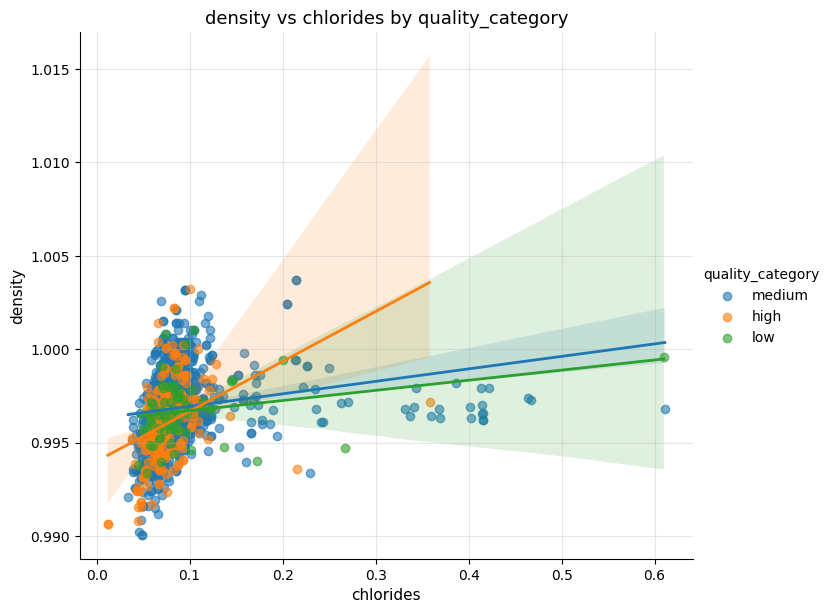

<Figure size 800x600 with 0 Axes>

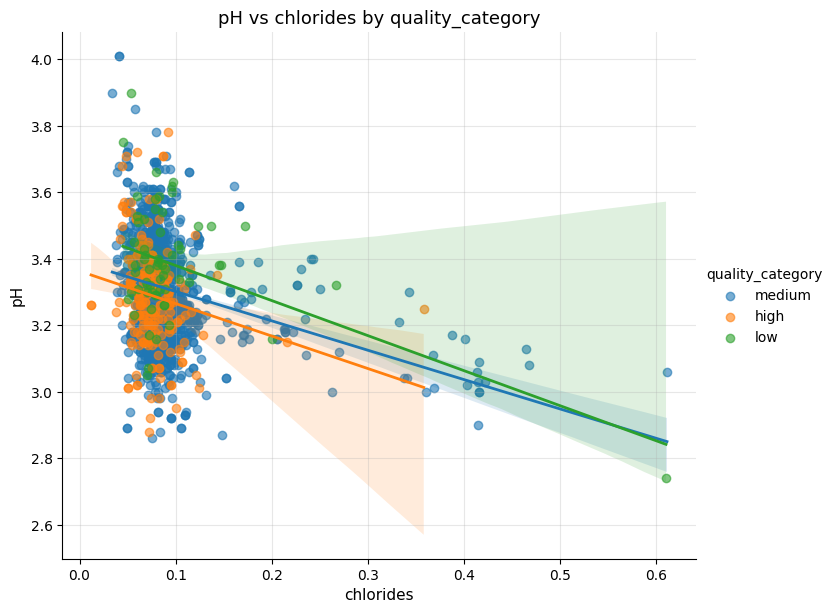

<Figure size 800x600 with 0 Axes>

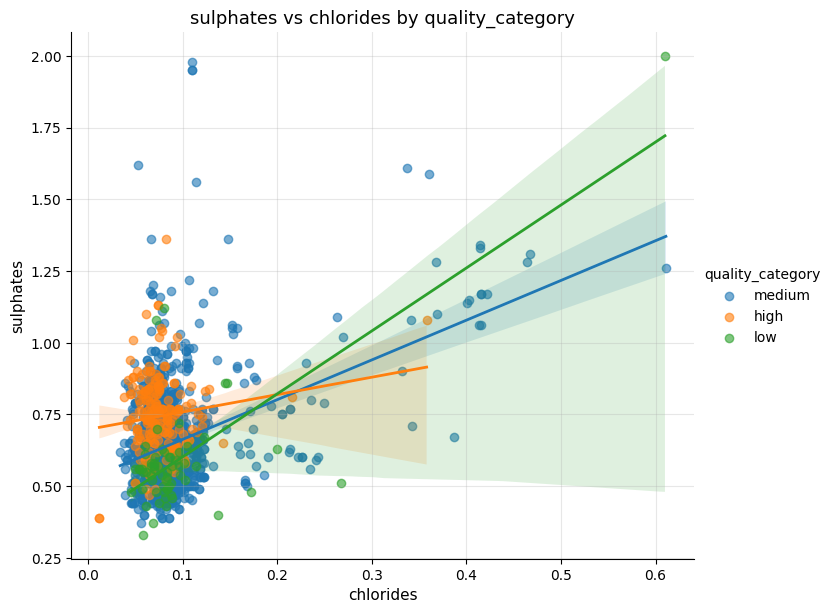

<Figure size 800x600 with 0 Axes>

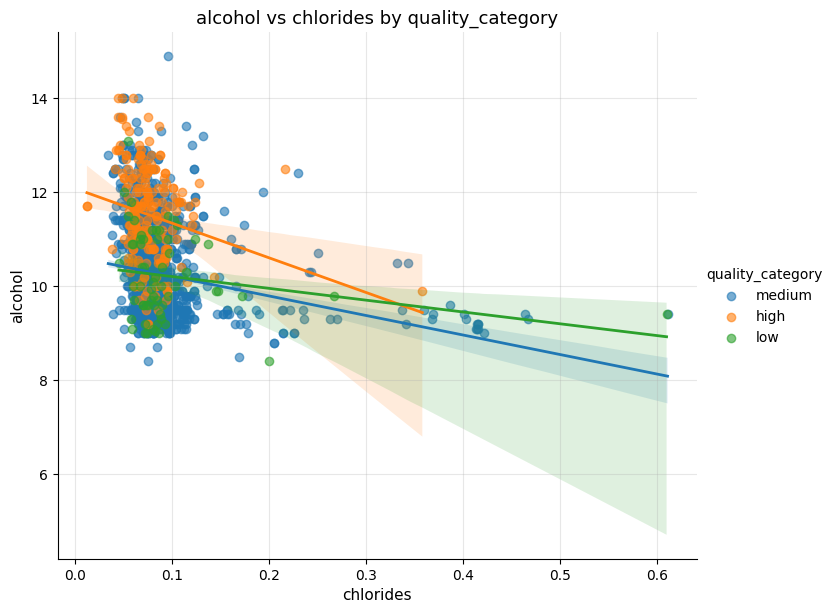

<Figure size 800x600 with 0 Axes>

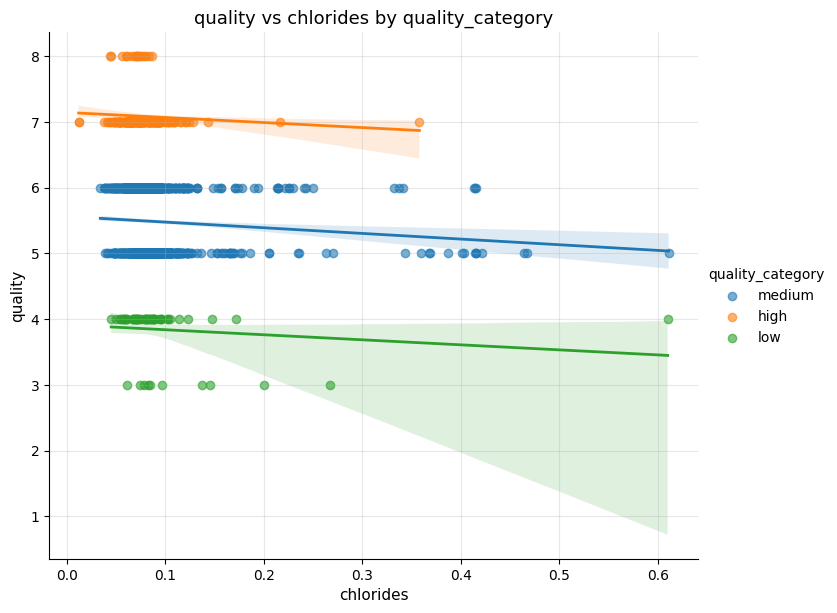

<Figure size 800x600 with 0 Axes>

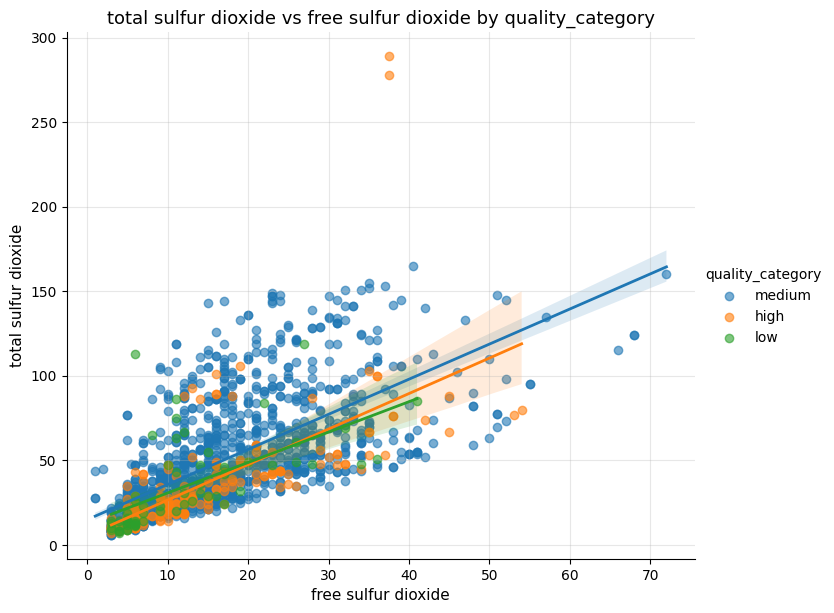

<Figure size 800x600 with 0 Axes>

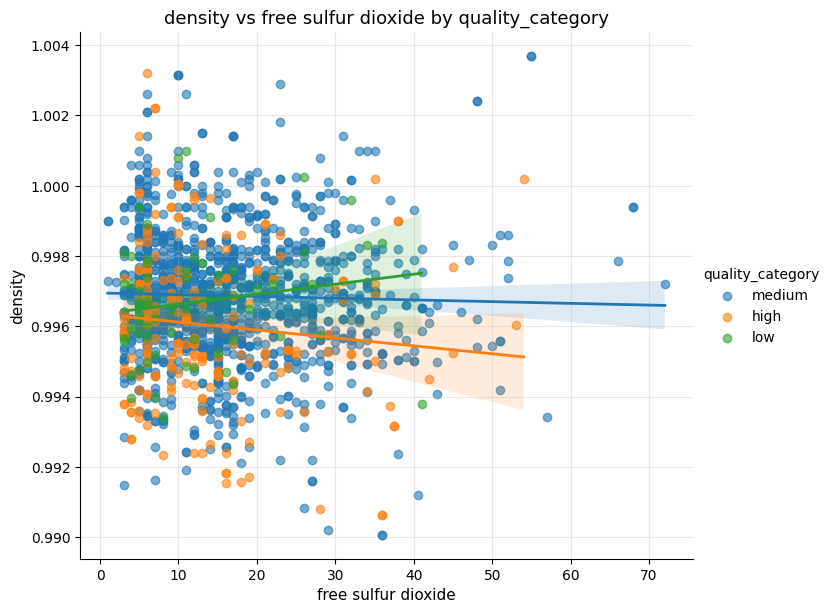

<Figure size 800x600 with 0 Axes>

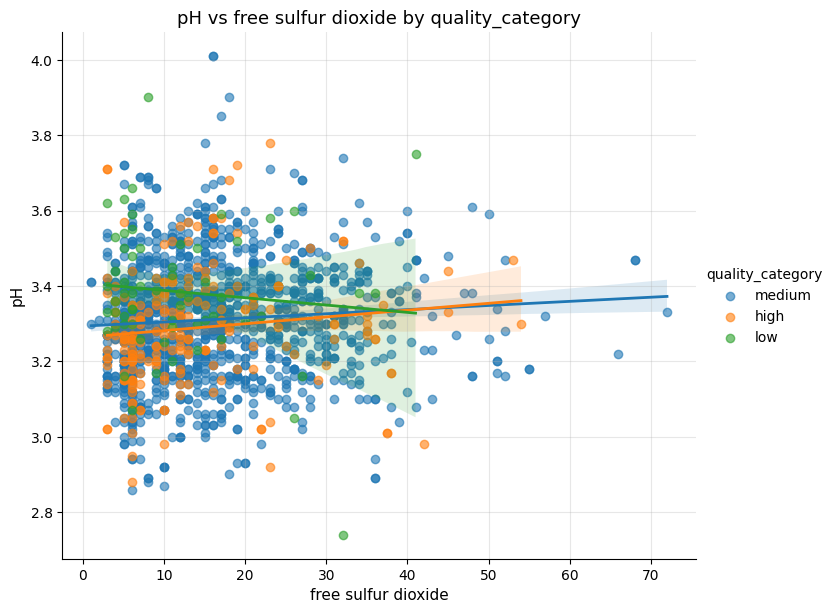

<Figure size 800x600 with 0 Axes>

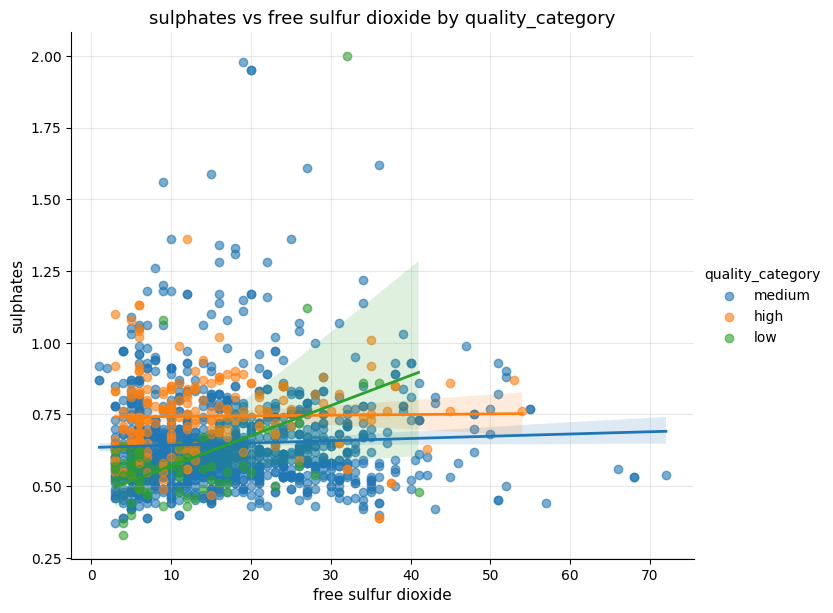

<Figure size 800x600 with 0 Axes>

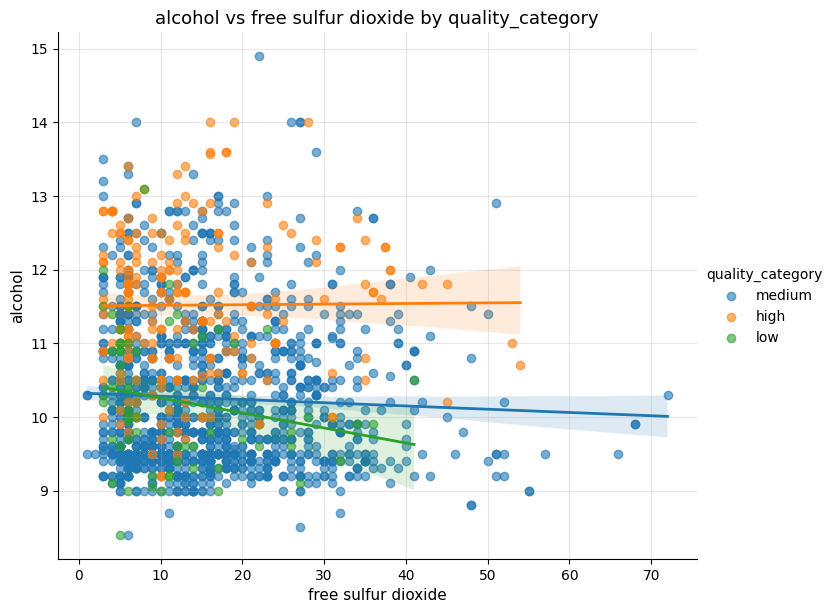

<Figure size 800x600 with 0 Axes>

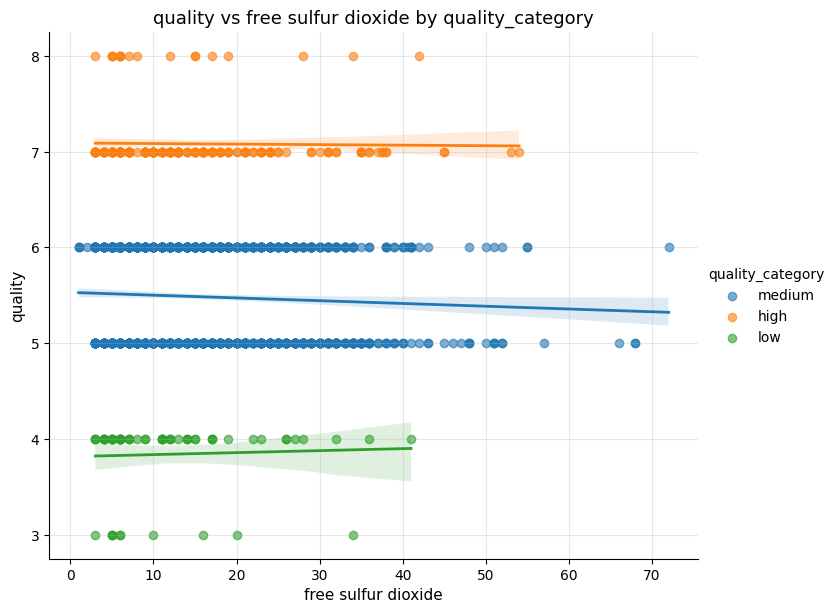

<Figure size 800x600 with 0 Axes>

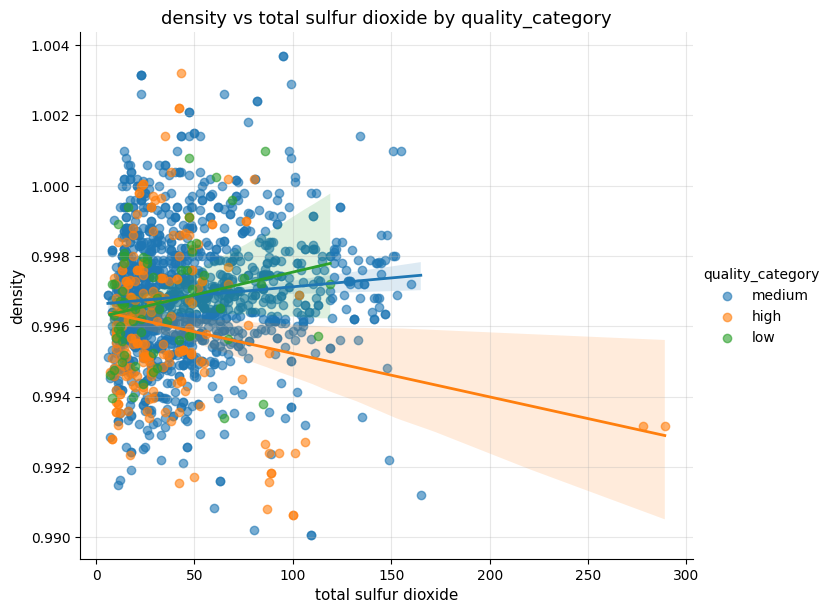

<Figure size 800x600 with 0 Axes>

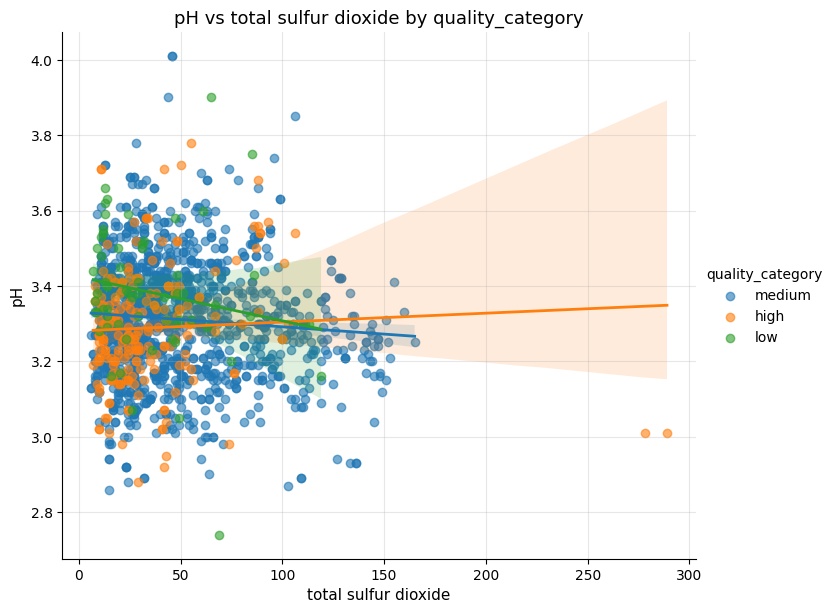

<Figure size 800x600 with 0 Axes>

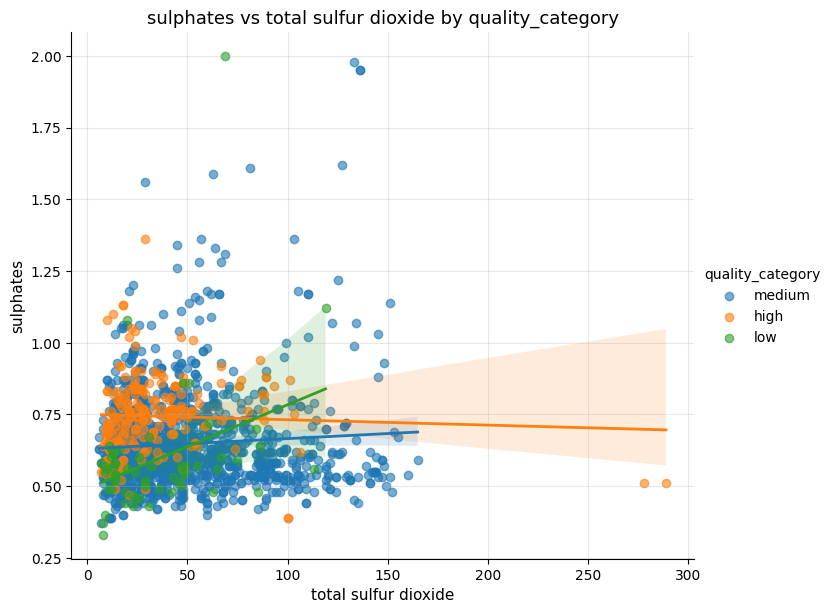

<Figure size 800x600 with 0 Axes>

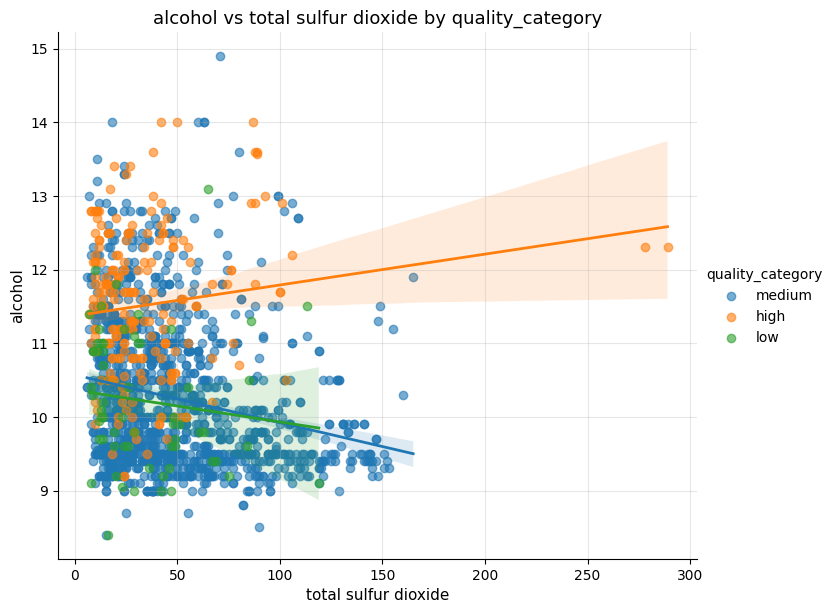

<Figure size 800x600 with 0 Axes>

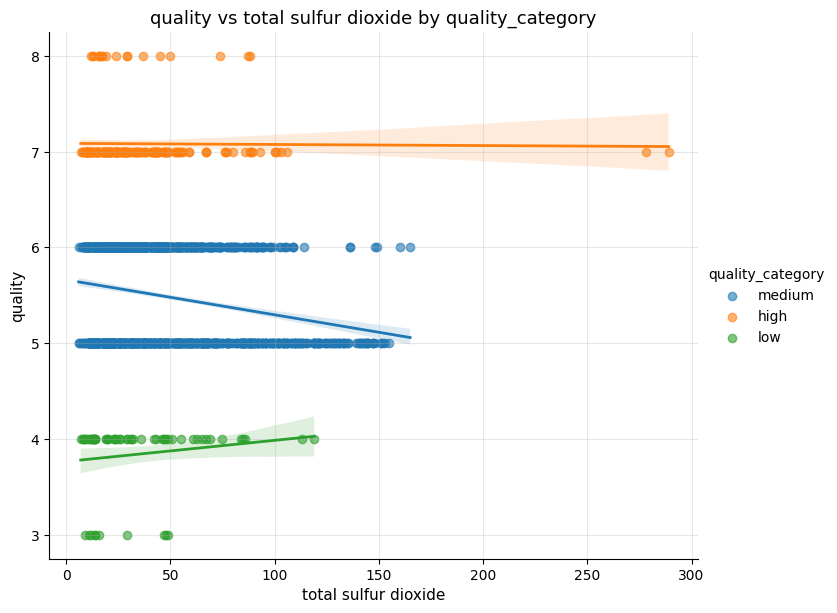

<Figure size 800x600 with 0 Axes>

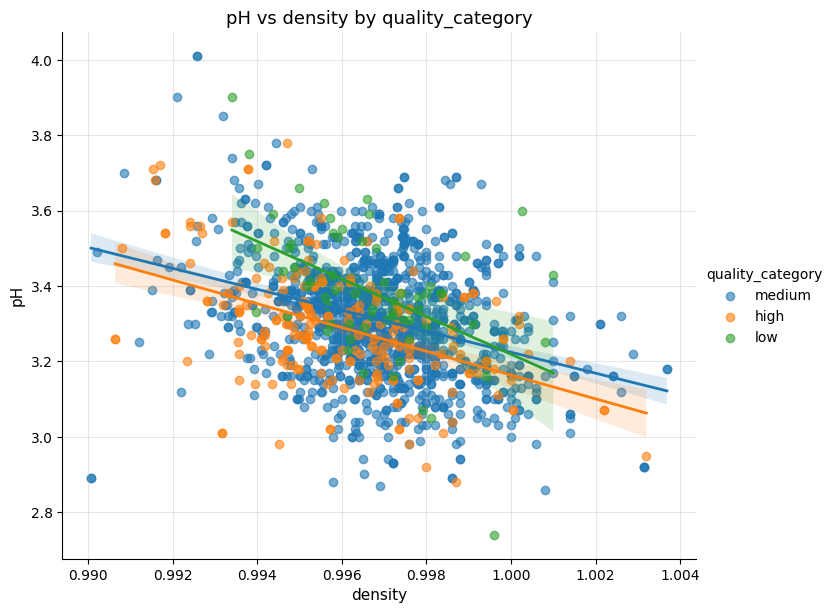

<Figure size 800x600 with 0 Axes>

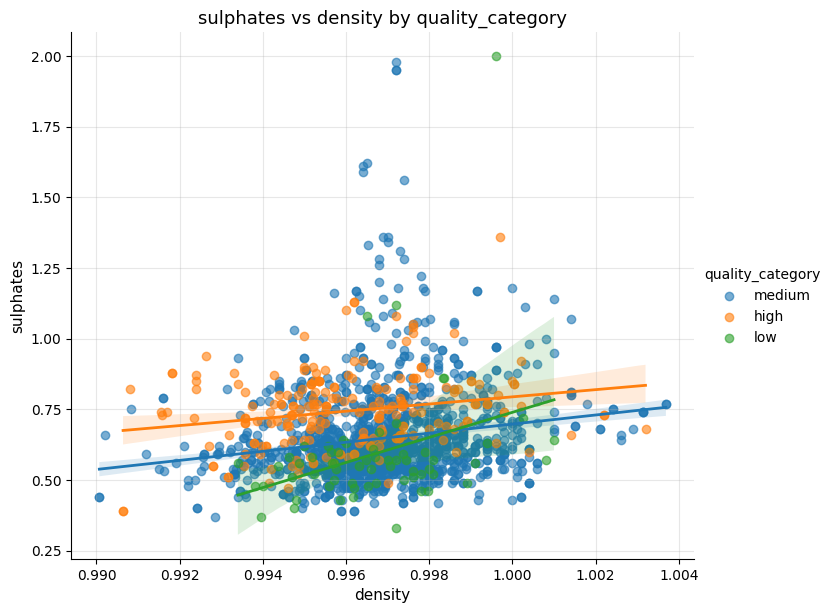

<Figure size 800x600 with 0 Axes>

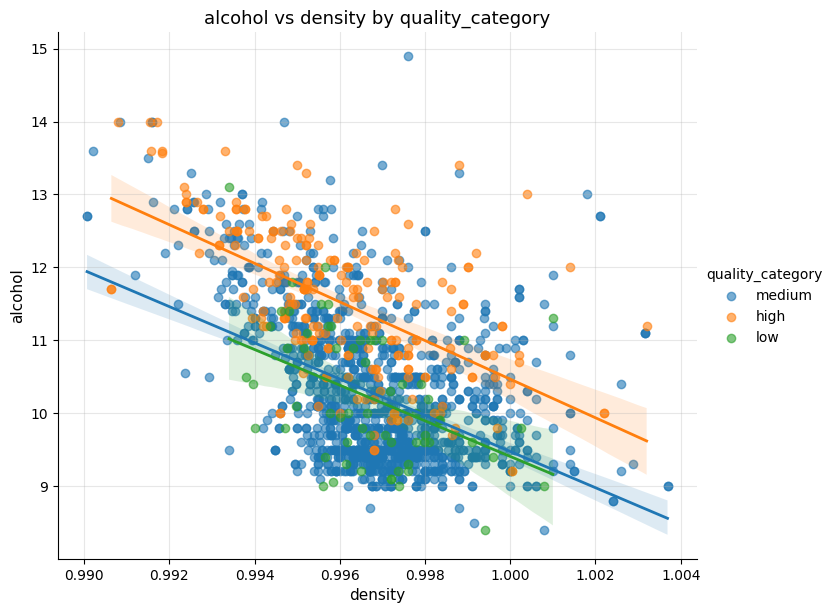

<Figure size 800x600 with 0 Axes>

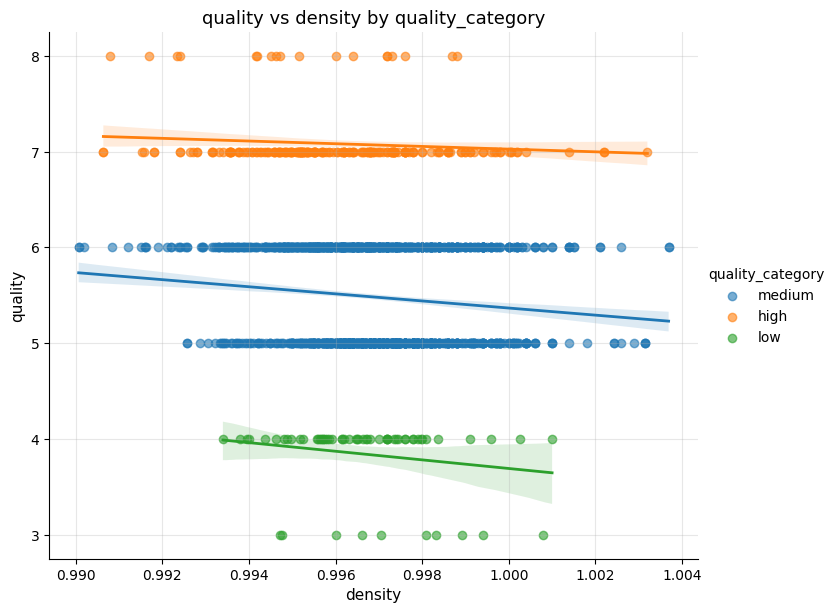

<Figure size 800x600 with 0 Axes>

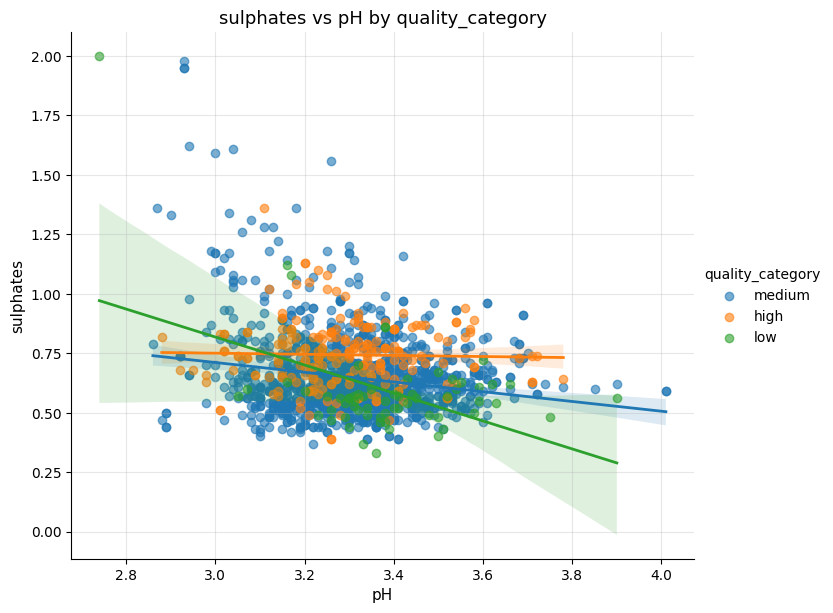

<Figure size 800x600 with 0 Axes>

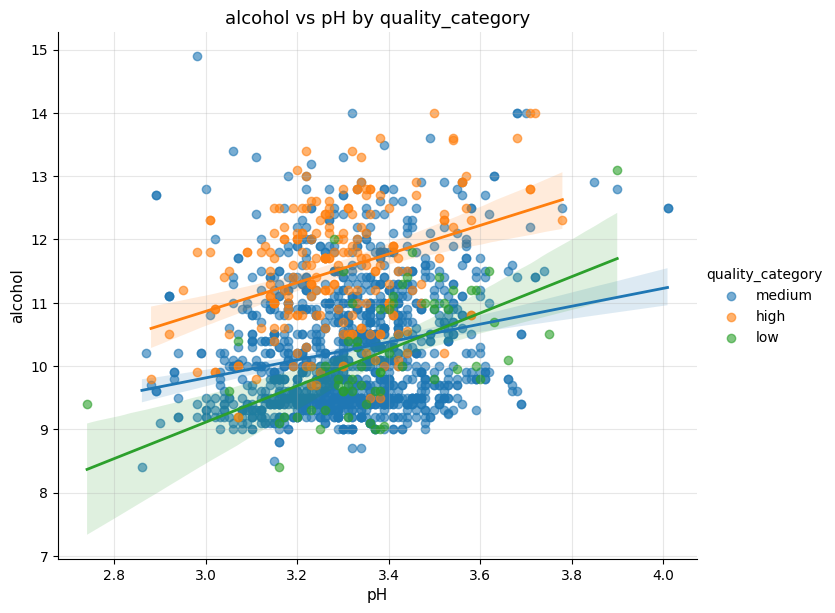

<Figure size 800x600 with 0 Axes>

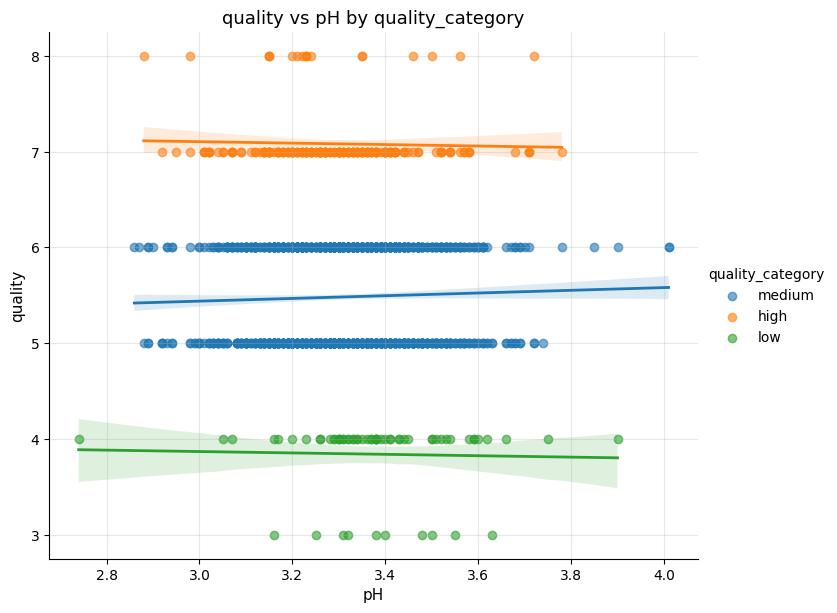

<Figure size 800x600 with 0 Axes>

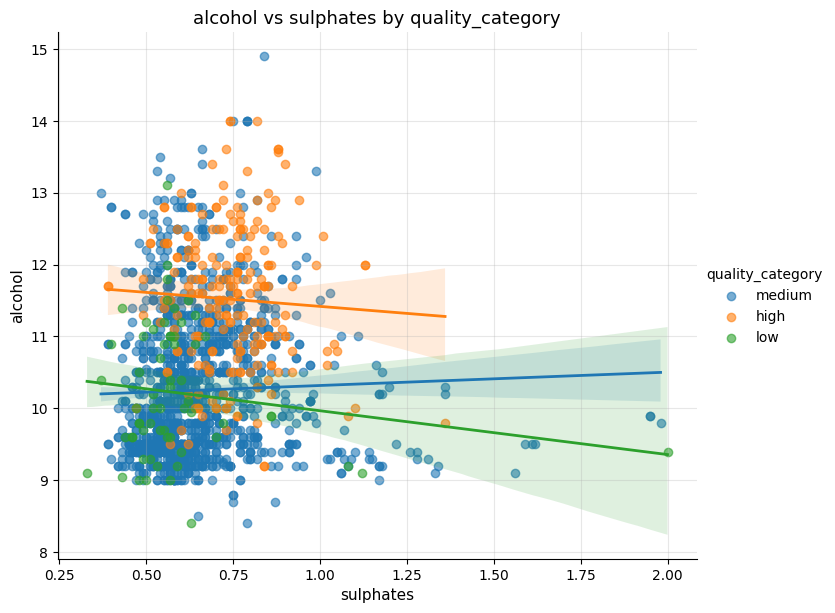

<Figure size 800x600 with 0 Axes>

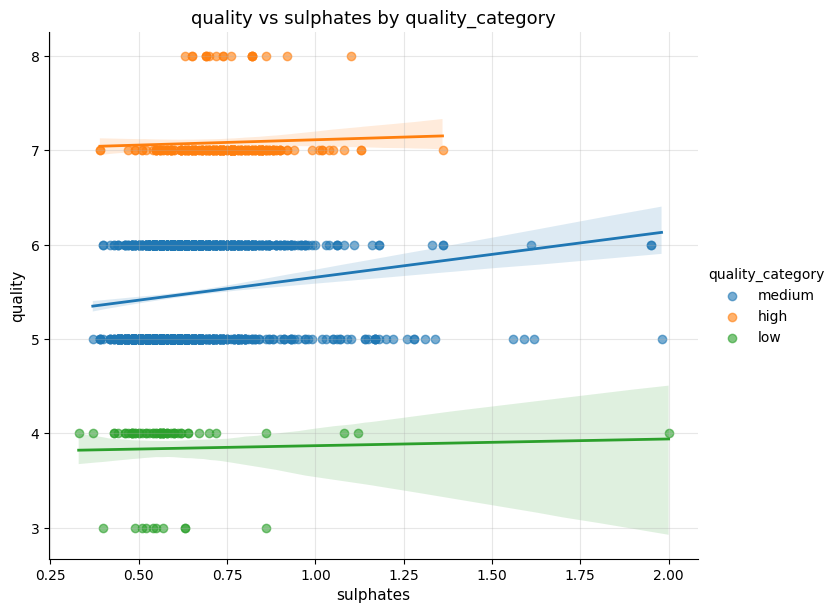

<Figure size 800x600 with 0 Axes>

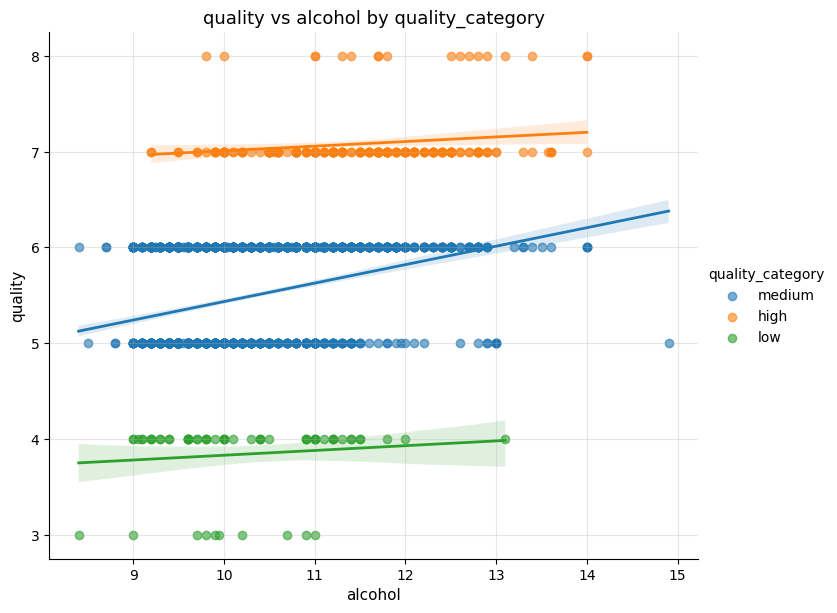

In [27]:
for x_col, y_col in combinations(num_cols, 2):
    trivariate_plot(df, x_col, y_col, "quality_category")

In [28]:
def grouped_summary(df):
    """
    Computes summary statistics grouped by wine quality.
    """
    summary = df.groupby('quality').mean(numeric_only=True).round(2)
    return summary

In [29]:
grouped_summary(df)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
quality,,,,,,,,,,,
3,8.36,0.88,0.17,2.64,0.12,11.00,24.90,1.0,3.40,0.57,9.96
4,7.78,0.69,0.17,2.69,0.09,12.26,36.25,1.0,3.38,0.60,10.27
5,8.17,0.58,0.24,2.53,0.09,16.98,56.51,1.0,3.30,0.62,9.90
6,8.35,0.50,0.27,2.48,0.08,15.71,40.87,1.0,3.32,0.68,10.63
7,8.87,0.40,0.38,2.72,0.08,14.05,35.02,1.0,3.29,0.74,11.47
8,8.57,0.42,0.39,2.58,0.07,13.28,33.44,1.0,3.27,0.77,12.09


In [30]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_category
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,medium
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,medium
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,medium
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,medium
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,medium


In [32]:
df.drop(columns=['quality_category'], inplace=True)

In [33]:
df.head(2)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.0,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5


In [34]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

In [35]:
y = df['quality']
X = df.drop(columns=['quality'])

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=234)

In [36]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=234, max_iter=10)
model.fit(X_train, y_train)

c:\Users\user49\Documents\module_3\model\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
c:\Users\user49\Documents\module_3\model\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 10 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=10).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,234
,solver,'lbfgs'
,max_iter,10
,multi_class,'multinomial'


c:\Users\user49\Documents\module_3\model\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\user49\Documents\module_3\model\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\user49\Documents\module_3\model\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00        11
           5       0.70      0.53      0.60       136
           6       0.47      0.79      0.59       128
           7       0.00      0.00      0.00        40
           8       0.00      0.00      0.00         3

    accuracy                           0.54       320
   macro avg       0.19      0.22      0.20       320
weighted avg       0.48      0.54      0.49       320



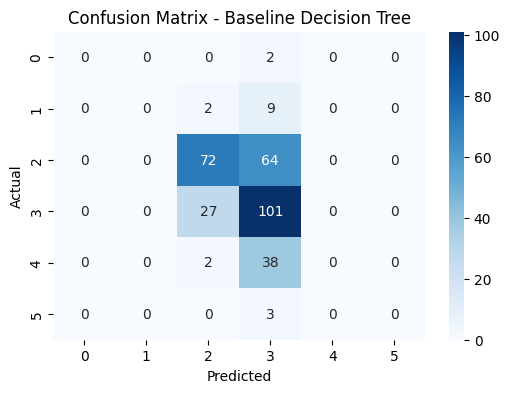

In [37]:
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

# Confusion Matrix 
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Baseline Decision Tree")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [38]:
from sklearn.tree import DecisionTreeClassifier


model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,42
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [39]:
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00        11
           5       0.74      0.74      0.74       136
           6       0.67      0.62      0.65       128
           7       0.49      0.62      0.55        40
           8       0.25      0.33      0.29         3

    accuracy                           0.64       320
   macro avg       0.36      0.39      0.37       320
weighted avg       0.64      0.64      0.64       320



Baseline Decision Tree Accuracy: 0.644

Classification Report:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00        11
           5       0.74      0.74      0.74       136
           6       0.67      0.62      0.65       128
           7       0.49      0.62      0.55        40
           8       0.25      0.33      0.29         3

    accuracy                           0.64       320
   macro avg       0.36      0.39      0.37       320
weighted avg       0.64      0.64      0.64       320



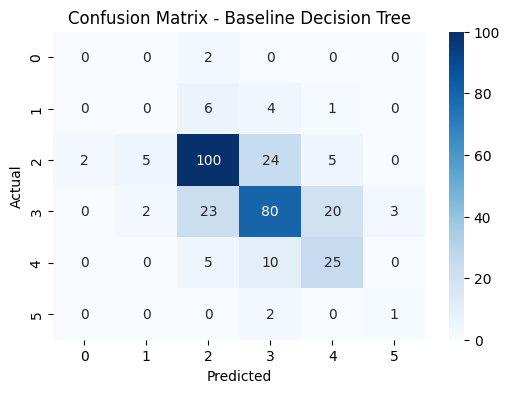

In [40]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, y_pred)
print(f"Baseline Decision Tree Accuracy: {accuracy:.3f}\n")
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix 
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Baseline Decision Tree")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

**Our Base Model Reports**

| Model                   | Accuracy | Macro F1 | Weighted F1 | Key Strength                                           | Key Weakness                                                                     |
| :---------------------- | :------- | :------- | :---------- | :----------------------------------------------------- | :------------------------------------------------------------------------------- |
| **Logistic Regression** | **0.54** | **0.20** | **0.49**    | Interpretable, fast                                    | Fails on minority classes (3,4,7,8); can’t capture nonlinear relationships       |
| **Decision Tree**       | **0.64** | **0.37** | **0.64**    | Captures nonlinear patterns; robust to feature scaling | Overfits easily; ignores feature correlation and noise; unstable without pruning |


In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import warnings
warnings.filterwarnings('ignore')

# Preprocessing libraries
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import IsolationForest
from sklearn.metrics import classification_report, confusion_matrix

# Statistical libraries
from scipy import stats
from scipy.stats import zscore, skew

# Set style for better visualizations
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

print("Libraries imported successfully!")

Libraries imported successfully!


In [42]:
df_processed = df.copy()



# 1. Check for missing values (EDA showed no missing values)
print("\n1. Missing Values:")
missing_values = df_processed.isnull().sum()
if missing_values.sum() > 0:
    print(missing_values[missing_values > 0])
else:
    print("No missing values found (as expected from EDA)")

# 2. Check for duplicates
print("\n2. Duplicate Rows:")
duplicates = df_processed.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")
if duplicates > 0:
    print(f"Percentage of duplicates: {(duplicates/len(df_processed))*100:.2f}%")

# 3. Check skewness for variables identified in EDA as right-skewed
print("\n3. Skewness Analysis (EDA identified right-skewed variables):")
skewed_vars = ['residual sugar', 'total sulfur dioxide', 'chlorides']
for var in skewed_vars:
    if var in df_processed.columns:
        skewness = skew(df_processed[var])
        print(f"{var}: skewness = {skewness:.3f} ({'right-skewed' if skewness > 0.5 else 'approximately normal'})")

# 4. Check correlation with target (EDA evidence)
print("\n4. Correlation with Quality (EDA Evidence):")
correlations = df_processed.corr()['quality'].sort_values(key=abs, ascending=False)
print("High-signal features (|correlation| > 0.2):")
high_signal = correlations[abs(correlations) > 0.2].drop('quality')
for feature, corr in high_signal.items():
    print(f"  {feature}: {corr:.3f}")

print("\nLow-signal features (|correlation| < 0.1):")
low_signal = correlations[abs(correlations) < 0.1]
for feature, corr in low_signal.items():
    print(f"  {feature}: {corr:.3f}")


1. Missing Values:
No missing values found (as expected from EDA)

2. Duplicate Rows:
Number of duplicate rows: 240
Percentage of duplicates: 15.01%

3. Skewness Analysis (EDA identified right-skewed variables):
residual sugar: skewness = 4.536 (right-skewed)
total sulfur dioxide: skewness = 1.514 (right-skewed)
chlorides: skewness = 5.675 (right-skewed)

4. Correlation with Quality (EDA Evidence):
High-signal features (|correlation| > 0.2):
  alcohol: 0.476
  volatile acidity: -0.391
  sulphates: 0.251
  citric acid: 0.226

Low-signal features (|correlation| < 0.1):
  pH: -0.058
  free sulfur dioxide: -0.051
  residual sugar: 0.014


In [43]:
if duplicates > 0:
    print(f"Removing {duplicates} duplicate rows...")
    df_processed = df_processed.drop_duplicates()
    print(f"Dataset shape after removing duplicates: {df_processed.shape}")
else:
    print("✓ No duplicates to remove (as expected from EDA)")

Removing 240 duplicate rows...
Dataset shape after removing duplicates: (1359, 12)


In [44]:
print("=== LOG-TRANSFORMING SKEWED VARIABLES ===")
print("EDA identified these variables as right-skewed and recommended log transformation:")

# Variables to log-transform based on EDA findings
skewed_vars = ['residual sugar', 'total sulfur dioxide', 'chlorides']

for var in skewed_vars:
    if var in df_processed.columns:
        # Check if variable has zero or negative values
        min_val = df_processed[var].min()
        if min_val <= 0:
            # Use log1p for variables with zeros
            df_processed[f'{var}_log'] = np.log1p(df_processed[var])
            print(f"✓ {var}: Applied log1p transformation (had {min_val:.3f} minimum value)")
        else:
            # Use log for positive values only
            df_processed[f'{var}_log'] = np.log(df_processed[var])
            print(f"✓ {var}: Applied log transformation")
        
        # Check skewness before and after
        original_skew = skew(df_processed[var])
        transformed_skew = skew(df_processed[f'{var}_log'])
        print(f"  Original skewness: {original_skew:.3f} → Transformed skewness: {transformed_skew:.3f}")

print(f"\nDataset shape after log transformation: {df_processed.shape}")
print("New log-transformed columns:", [col for col in df_processed.columns if '_log' in col])

=== LOG-TRANSFORMING SKEWED VARIABLES ===
EDA identified these variables as right-skewed and recommended log transformation:
✓ residual sugar: Applied log transformation
  Original skewness: 4.543 → Transformed skewness: 1.763
✓ total sulfur dioxide: Applied log transformation
  Original skewness: 1.539 → Transformed skewness: -0.078
✓ chlorides: Applied log transformation
  Original skewness: 5.496 → Transformed skewness: 1.886

Dataset shape after log transformation: (1359, 15)
New log-transformed columns: ['residual sugar_log', 'total sulfur dioxide_log', 'chlorides_log']


In [45]:
print("=== OUTLIER TREATMENT (IQR-CAPPING METHOD) ===")
print("EDA recommended IQR-capping for extreme acidity/sulphates to preserve data points")

# Define numerical columns (excluding target)
numerical_cols = df_processed.select_dtypes(include=[np.number]).columns.tolist()
if 'quality' in numerical_cols:
    numerical_cols.remove('quality')

print(f"Treating outliers in {len(numerical_cols)} numerical features...")

# Apply IQR-capping method
outliers_capped = 0
for col in numerical_cols:
    Q1 = df_processed[col].quantile(0.25)
    Q3 = df_processed[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Count outliers before capping
    outliers_before = ((df_processed[col] < lower_bound) | (df_processed[col] > upper_bound)).sum()
    
    if outliers_before > 0:
        # Cap outliers
        df_processed[col] = np.where(df_processed[col] < lower_bound, lower_bound, df_processed[col])
        df_processed[col] = np.where(df_processed[col] > upper_bound, upper_bound, df_processed[col])
        outliers_capped += outliers_before
        print(f"✓ {col}: Capped {outliers_before} outliers")

print(f"\nTotal outliers capped: {outliers_capped}")
print(f"Dataset shape after outlier treatment: {df_processed.shape}")

=== OUTLIER TREATMENT (IQR-CAPPING METHOD) ===
EDA recommended IQR-capping for extreme acidity/sulphates to preserve data points
Treating outliers in 14 numerical features...
✓ fixed acidity: Capped 41 outliers
✓ volatile acidity: Capped 19 outliers
✓ citric acid: Capped 1 outliers
✓ residual sugar: Capped 126 outliers
✓ chlorides: Capped 87 outliers
✓ free sulfur dioxide: Capped 26 outliers
✓ total sulfur dioxide: Capped 45 outliers
✓ density: Capped 35 outliers
✓ pH: Capped 28 outliers
✓ sulphates: Capped 55 outliers
✓ alcohol: Capped 12 outliers
✓ residual sugar_log: Capped 96 outliers
✓ chlorides_log: Capped 102 outliers

Total outliers capped: 673
Dataset shape after outlier treatment: (1359, 15)


In [46]:
print("FEATURE ENGINEERING BASED ON EDA RECOMMENDATIONS")

# 1. Acidity ratio: fixed_to_volatile = fixed_acidity / volatile_acidity
# EDA rationale: Quality improves when stable acids (fixed) dominate over volatile (harsh) acids
print("1. Creating acidity ratio features...")
eps = 1e-6  # Small constant to avoid divide-by-zero

df_processed['FA_to_VA_ratio'] = df_processed['fixed acidity'] / (df_processed['volatile acidity'] + eps)
print("- FA_to_VA_ratio: fixed_acidity / volatile_acidity")

# 2. Citric balance: citric_over_total_acid = citric_acid / (fixed_acidity + volatile_acidity + eps)
# EDA rationale: Citric acid adds freshness, normalize by total acid captures relative freshness
df_processed['citric_over_total_acid'] = df_processed['citric acid'] / (df_processed['fixed acidity'] + df_processed['volatile acidity'] + eps)
print("- citric_over_total_acid: citric_acid / (fixed_acidity + volatile_acidity)")

# 3. Alcohol–Acidity interaction: alcohol / volatile_acidity
# EDA rationale: High alcohol only signals high quality when volatile acidity is low
df_processed['alcohol_acid_interaction'] = df_processed['alcohol'] / (df_processed['volatile acidity'] + eps)
print("- alcohol_acid_interaction: alcohol / volatile_acidity")

# 4. Fermentation efficiency: alcohol_density_ratio = alcohol / density
# EDA rationale: Density decreases while alcohol increases with quality - captures fermentation completeness
df_processed['alcohol_density_ratio'] = df_processed['alcohol'] / (df_processed['density'] + eps)
print("- alcohol_density_ratio: alcohol / density")

# 5. Sulphate–citric interaction: sulphates * citric_acid
# EDA rationale: Sulphates and citric acid jointly correlate with perceived freshness and preservation
df_processed['sulphate_citric_interaction'] = df_processed['sulphates'] * df_processed['citric acid']
print("- sulphate_citric_interaction: sulphates * citric_acid")

# 6. Total acidity (sum of all acidity measures)
df_processed['total_acidity'] = df_processed['fixed acidity'] + df_processed['volatile acidity'] + df_processed['citric acid']
print("- total_acidity: sum of all acidity measures")

# 7. pH-acidity balance (EDA showed pH and acidity are chemically related)
df_processed['ph_acidity_balance'] = df_processed['pH'] * df_processed['total_acidity']
print("- ph_acidity_balance: pH * total_acidity")

print(f"\nDataset shape after feature engineering: {df_processed.shape}")
print(f"New engineered features: {[col for col in df_processed.columns if col not in df.columns]}")

FEATURE ENGINEERING BASED ON EDA RECOMMENDATIONS
1. Creating acidity ratio features...
- FA_to_VA_ratio: fixed_acidity / volatile_acidity
- citric_over_total_acid: citric_acid / (fixed_acidity + volatile_acidity)
- alcohol_acid_interaction: alcohol / volatile_acidity
- alcohol_density_ratio: alcohol / density
- sulphate_citric_interaction: sulphates * citric_acid
- total_acidity: sum of all acidity measures
- ph_acidity_balance: pH * total_acidity

Dataset shape after feature engineering: (1359, 22)
New engineered features: ['residual sugar_log', 'total sulfur dioxide_log', 'chlorides_log', 'FA_to_VA_ratio', 'citric_over_total_acid', 'alcohol_acid_interaction', 'alcohol_density_ratio', 'sulphate_citric_interaction', 'total_acidity', 'ph_acidity_balance']


In [47]:
print("=== FEATURE SELECTION BASED ON EDA CORRELATION EVIDENCE ===")

# Separate features and target
X = df_processed.drop('quality', axis=1)
y = df_processed['quality']

print(f"Total features available: {X.shape[1]}")

# EDA-identified high-signal features (|correlation| > 0.2)
high_signal_features = ['alcohol', 'volatile acidity', 'sulphates', 'citric acid', 'density', 'chlorides']
print(f"\nEDA-identified high-signal features: {high_signal_features}")

# EDA-identified low-signal features (|correlation| < 0.1) 
low_signal_features = ['residual sugar', 'free sulfur dioxide']
print(f"EDA-identified low-signal features: {low_signal_features}")

# Check which features are actually available
available_high_signal = [f for f in high_signal_features if f in X.columns]
available_low_signal = [f for f in low_signal_features if f in X.columns]

print(f"\nAvailable high-signal features: {available_high_signal}")
print(f"Available low-signal features: {available_low_signal}")

# Create feature sets for evaluation
print("\n=== FEATURE SETS FOR EVALUATION ===")

# Set 1: All original features (excluding low-signal)
features_exclude_low_signal = [col for col in X.columns if col not in low_signal_features]
print(f"Set 1 - Exclude low-signal features: {len(features_exclude_low_signal)} features")

# Set 2: High-signal + engineered features
high_signal_plus_engineered = available_high_signal + [col for col in X.columns if any(keyword in col.lower() for keyword in ['ratio', 'interaction', 'balance', 'total', 'log'])]
print(f"Set 2 - High-signal + engineered: {len(high_signal_plus_engineered)} features")

# Set 3: All features (for comparison)
all_features = list(X.columns)
print(f"Set 3 - All features: {len(all_features)} features")

# Let's use Set 2 (high-signal + engineered) as recommended by EDA
selected_features = high_signal_plus_engineered
print(f"\n✓ Selected feature set: {len(selected_features)} features")

=== FEATURE SELECTION BASED ON EDA CORRELATION EVIDENCE ===
Total features available: 21

EDA-identified high-signal features: ['alcohol', 'volatile acidity', 'sulphates', 'citric acid', 'density', 'chlorides']
EDA-identified low-signal features: ['residual sugar', 'free sulfur dioxide']

Available high-signal features: ['alcohol', 'volatile acidity', 'sulphates', 'citric acid', 'density', 'chlorides']
Available low-signal features: ['residual sugar', 'free sulfur dioxide']

=== FEATURE SETS FOR EVALUATION ===
Set 1 - Exclude low-signal features: 19 features
Set 2 - High-signal + engineered: 17 features
Set 3 - All features: 21 features

✓ Selected feature set: 17 features


In [48]:

# Stratified data splitting based on EDA findings about class imbalance
print("=== STRATIFIED DATA SPLITTING ===")
print("EDA identified class imbalance - using stratified splitting to preserve class distribution")

# Select the chosen features
X_selected = X[selected_features]
print(f"Selected features shape: {X_selected.shape}")

# First split: 80% train+val, 20% test
X_temp, X_test, y_temp, y_test = train_test_split(
    X_selected, y, test_size=0.2, random_state=42, stratify=y
)

# Second split: 75% train, 25% validation (of the 80%)
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=42, stratify=y_temp
)

print(f"\nData split results:")
print(f"Training set: {X_train.shape} ({(X_train.shape[0]/len(X_selected))*100:.1f}%)")
print(f"Validation set: {X_val.shape} ({(X_val.shape[0]/len(X_selected))*100:.1f}%)")
print(f"Test set: {X_test.shape} ({(X_test.shape[0]/len(X_selected))*100:.1f}%)")

# Check class distribution in each set (should be similar due to stratification)
print(f"\nClass distribution verification:")
print("Training set quality distribution:")
print(y_train.value_counts().sort_index())
print("\nValidation set quality distribution:")
print(y_val.value_counts().sort_index())
print("\nTest set quality distribution:")
print(y_test.value_counts().sort_index())


=== STRATIFIED DATA SPLITTING ===
EDA identified class imbalance - using stratified splitting to preserve class distribution
Selected features shape: (1359, 17)

Data split results:
Training set: (815, 17) (60.0%)
Validation set: (272, 17) (20.0%)
Test set: (272, 17) (20.0%)

Class distribution verification:
Training set quality distribution:
quality
3      6
4     31
5    346
6    321
7    100
8     11
Name: count, dtype: int64

Validation set quality distribution:
quality
3      2
4     11
5    115
6    107
7     34
8      3
Name: count, dtype: int64

Test set quality distribution:
quality
3      2
4     11
5    116
6    107
7     33
8      3
Name: count, dtype: int64


In [49]:
# Apply StandardScaler as recommended by EDA
print("=== FEATURE SCALING (STANDARD SCALER) ===")
print("EDA recommended StandardScaler for distance-based models")

# Fit scaler on training data only (to avoid data leakage)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)

# Transform validation and test sets
X_val_scaled = scaler.transform(X_val)
X_val_scaled = pd.DataFrame(X_val_scaled, columns=X_val.columns)

X_test_scaled = scaler.transform(X_test)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

print("✓ Scaling applied successfully!")
print(f"Training set scaled - Mean: {X_train_scaled.mean().mean():.4f}, Std: {X_train_scaled.std().mean():.4f}")
print(f"Validation set scaled - Mean: {X_val_scaled.mean().mean():.4f}, Std: {X_val_scaled.std().mean():.4f}")
print(f"Test set scaled - Mean: {X_test_scaled.mean().mean():.4f}, Std: {X_test_scaled.std().mean():.4f}")

# Verify scaling worked correctly
print(f"\nScaling verification:")
print(f"Training set - Mean ≈ 0: {abs(X_train_scaled.mean().mean()) < 0.01}")
print(f"Training set - Std ≈ 1: {abs(X_train_scaled.std().mean() - 1) < 0.01}")

=== FEATURE SCALING (STANDARD SCALER) ===
EDA recommended StandardScaler for distance-based models
✓ Scaling applied successfully!
Training set scaled - Mean: -0.0000, Std: 1.0006
Validation set scaled - Mean: 0.0080, Std: 0.9902
Test set scaled - Mean: -0.0096, Std: 0.9558

Scaling verification:
Training set - Mean ≈ 0: True
Training set - Std ≈ 1: True


=== FEATURE IMPORTANCE ANALYSIS ===
Top 10 features by correlation with quality:
 1. density: 0.100
 2. alcohol_density_ratio: 0.098
 3. alcohol: 0.097
 4. chlorides: 0.063
 5. chlorides_log: 0.060
 6. ph_acidity_balance: 0.055
 7. FA_to_VA_ratio: 0.053
 8. total_acidity: 0.051
 9. volatile acidity: 0.050
10. citric acid: 0.038

Engineered features in top 10: ['chlorides_log', 'FA_to_VA_ratio', 'alcohol_density_ratio', 'total_acidity', 'ph_acidity_balance']


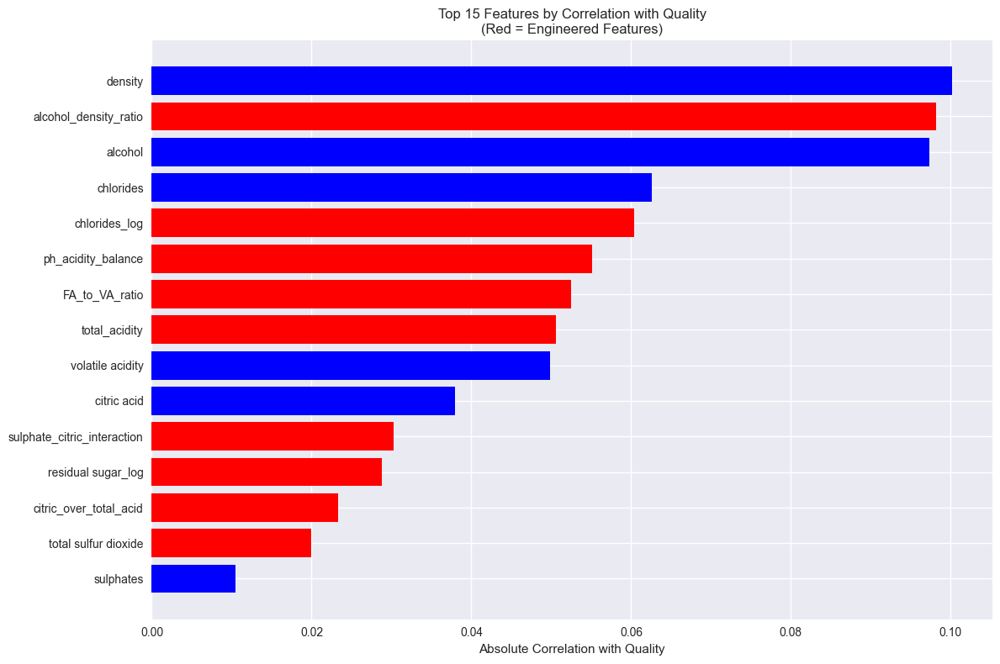


✓ Feature importance analysis completed
✓ 5 engineered features in top 10


In [50]:
# Feature importance analysis to validate EDA-based engineering
print("=== FEATURE IMPORTANCE ANALYSIS ===")

# Calculate correlation with target for all features
feature_correlations = X_train_scaled.corrwith(y_train).abs().sort_values(ascending=False)

print("Top 10 features by correlation with quality:")
for i, (feature, corr) in enumerate(feature_correlations.head(10).items(), 1):
    print(f"{i:2d}. {feature}: {corr:.3f}")

# Check if engineered features are among top features
engineered_features = [col for col in X_train_scaled.columns if any(keyword in col.lower() for keyword in ['ratio', 'interaction', 'balance', 'total', 'log'])]
print(f"\nEngineered features in top 10: {[f for f in engineered_features if f in feature_correlations.head(10).index]}")

# Visualize feature importance
plt.figure(figsize=(12, 8))
top_features = feature_correlations.head(15)
colors = ['red' if any(keyword in f.lower() for keyword in ['ratio', 'interaction', 'balance', 'total', 'log']) else 'blue' for f in top_features.index]

plt.barh(range(len(top_features)), top_features.values, color=colors)
plt.yticks(range(len(top_features)), top_features.index)
plt.xlabel('Absolute Correlation with Quality')
plt.title('Top 15 Features by Correlation with Quality\n(Red = Engineered Features)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

print(f"\n✓ Feature importance analysis completed")
print(f"✓ {len([f for f in engineered_features if f in feature_correlations.head(10).index])} engineered features in top 10")

In [51]:
print("SAVING PREPROCESSED DATA ")

# Save scaled datasets
X_train_scaled.to_csv('X_train_scaled.csv', index=False)
X_val_scaled.to_csv('X_val_scaled.csv', index=False)
X_test_scaled.to_csv('X_test_scaled.csv', index=False)

# Save target variables
y_train.to_csv('y_train.csv', index=False)
y_val.to_csv('y_val.csv', index=False)
y_test.to_csv('y_test.csv', index=False)

# Save preprocessing objects
import joblib
joblib.dump(scaler, 'scaler.pkl')
joblib.dump(selected_features, 'selected_features.pkl')

# Save feature importance
feature_importance_df = pd.DataFrame({
    'feature': feature_correlations.index,
    'correlation': feature_correlations.values
})
feature_importance_df.to_csv('feature_importance.csv', index=False)

# Save preprocessing summary
preprocessing_summary = {
    'original_shape': df.shape,
    'final_shape': df_processed.shape,
    'selected_features': selected_features,
    'engineered_features': engineered_features,
    'train_samples': X_train_scaled.shape[0],
    'val_samples': X_val_scaled.shape[0],
    'test_samples': X_test_scaled.shape[0],
    'scaling_method': 'StandardScaler',
    'outlier_treatment': 'IQR_capping',
    'log_transformed': ['residual sugar', 'total sulfur dioxide', 'chlorides']
}

import json
with open('preprocessing_summary.json', 'w') as f:
    json.dump(preprocessing_summary, f, indent=2)

print("- Preprocessed data saved successfully!")
print("\nFiles created:")
print("- X_train_scaled.csv, X_val_scaled.csv, X_test_scaled.csv")
print("- y_train.csv, y_val.csv, y_test.csv")
print("- scaler.pkl, selected_features.pkl")
print("- feature_importance.csv, preprocessing_summary.json")

SAVING PREPROCESSED DATA 
- Preprocessed data saved successfully!

Files created:
- X_train_scaled.csv, X_val_scaled.csv, X_test_scaled.csv
- y_train.csv, y_val.csv, y_test.csv
- scaler.pkl, selected_features.pkl
- feature_importance.csv, preprocessing_summary.json


In [52]:
# Final preprocessing summary
print(".....PREPROCESSING SUMMARY BASED ON EDA INSIGHTS.....")
print(f"Original dataset shape: {df.shape}")
print(f"Final processed dataset shape: {df_processed.shape}")
print(f"Selected features: {len(selected_features)}")
print(f"Training samples: {X_train_scaled.shape[0]}")
print(f"Validation samples: {X_val_scaled.shape[0]}")
print(f"Test samples: {X_test_scaled.shape[0]}")

print("\n.....PREPROCESSING STEPS COMPLETED (EDA-BASED).....")
print("> Data quality assessment (no missing values, duplicates handled)")
print("> Log-transformation of skewed variables (residual sugar, total SO₂, chlorides)")
print("> Outlier treatment using IQR-capping method")
print("> Feature engineering based on EDA recommendations:")
print("  - FA_to_VA_ratio (fixed acidity / volatile acidity)")
print("  - citric_over_total_acid (citric acid / total acidity)")
print("  - alcohol_acid_interaction (alcohol / volatile acidity)")
print("  - alcohol_density_ratio (alcohol / density)")
print("  - sulphate_citric_interaction (sulphates * citric acid)")
print("  - total_acidity (sum of all acidity measures)")
print("  - ph_acidity_balance (pH * total acidity)")
print("> Feature selection (high-signal features + engineered features)")
print("> Stratified data splitting (preserves class distribution)")
print("> StandardScaler applied (EDA recommendation for distance-based models)")
print("> Feature importance analysis (validates engineered features)")
print("> Data export (ready for modeling)")

print("\n.....EDA EVIDENCE IMPLEMENTED.....")
print("> High-signal features prioritized: alcohol, volatile acidity, sulphates, citric acid")
print("> Low-signal features excluded: residual sugar, free sulfur dioxide")
print("> Skewed variables log-transformed as recommended")
print("> Acidity ratios created based on grouped means analysis")
print("> Alcohol-acidity interactions based on trivariate analysis")
print("> Fermentation efficiency features based on density-alcohol relationship")


print(f"\n Preprocessing completed successfully!!!!!!")
print(".....Ready for modeling phase with EDA-informed preprocessing")

.....PREPROCESSING SUMMARY BASED ON EDA INSIGHTS.....
Original dataset shape: (1599, 12)
Final processed dataset shape: (1359, 22)
Selected features: 17
Training samples: 815
Validation samples: 272
Test samples: 272

.....PREPROCESSING STEPS COMPLETED (EDA-BASED).....
> Data quality assessment (no missing values, duplicates handled)
> Log-transformation of skewed variables (residual sugar, total SO₂, chlorides)
> Outlier treatment using IQR-capping method
> Feature engineering based on EDA recommendations:
  - FA_to_VA_ratio (fixed acidity / volatile acidity)
  - citric_over_total_acid (citric acid / total acidity)
  - alcohol_acid_interaction (alcohol / volatile acidity)
  - alcohol_density_ratio (alcohol / density)
  - sulphate_citric_interaction (sulphates * citric acid)
  - total_acidity (sum of all acidity measures)
  - ph_acidity_balance (pH * total acidity)
> Feature selection (high-signal features + engineered features)
> Stratified data splitting (preserves class distribution

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Machine Learning libraries
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, GridSearchCV
from sklearn.metrics import (classification_report, confusion_matrix, accuracy_score, 
                           balanced_accuracy_score, f1_score, precision_score, recall_score)
from sklearn.preprocessing import StandardScaler
import joblib

# Advanced ML libraries
try:
    import xgboost as xgb
    XGBOOST_AVAILABLE = True
except ImportError:
    XGBOOST_AVAILABLE = False
    print("XGBoost not available. Install with: pip install xgboost")

try:
    import lightgbm as lgb
    LIGHTGBM_AVAILABLE = True
except ImportError:
    LIGHTGBM_AVAILABLE = False
    print("LightGBM not available. Install with: pip install lightgbm")

# Explainability
try:
    import shap
    SHAP_AVAILABLE = True
except ImportError:
    SHAP_AVAILABLE = False
    print("SHAP not available. Install with: pip install shap")

# Set style for better visualizations
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

print("Libraries imported successfully!")
print(f"XGBoost available: {XGBOOST_AVAILABLE}")
print(f"LightGBM available: {LIGHTGBM_AVAILABLE}")
print(f"SHAP available: {SHAP_AVAILABLE}")


XGBoost not available. Install with: pip install xgboost
LightGBM not available. Install with: pip install lightgbm
SHAP not available. Install with: pip install shap
Libraries imported successfully!
XGBoost available: False
LightGBM available: False
SHAP available: False


In [54]:
# Load preprocessed datasets
print("LOADING PREPROCESSED DATA")

try:
    # Load preprocessed datasets
    X_train = pd.read_csv('X_train_scaled.csv')
    X_val = pd.read_csv('X_val_scaled.csv')
    X_test = pd.read_csv('X_test_scaled.csv')
    
    y_train = pd.read_csv('y_train.csv').squeeze()
    y_val = pd.read_csv('y_val.csv').squeeze()
    y_test = pd.read_csv('y_test.csv').squeeze()
    ### The .squeeze() method removes dimensions of size 1, converting a DataFrame to a Series
    ### The .squeeze() method is a clean, robust way to ensure your target variables are in the correct 1D format that sklearn expects, 
    ### preventing potential errors during model training and evaluation.
    
    # Load preprocessing objects
    scaler = joblib.load('scaler.pkl')
    selected_features = joblib.load('selected_features.pkl')
    
    print("...Preprocessed data loaded successfully!!....")
    print(f"Training set: {X_train.shape}")
    print(f"Validation set: {X_val.shape}")
    print(f"Test set: {X_test.shape}")
    
    # Display class distribution
    print("\nClass distribution:")
    print("Training set:")
    print(y_train.value_counts().sort_index())
    print("\nValidation set:")
    print(y_val.value_counts().sort_index())
    print("\nTest set:")
    print(y_test.value_counts().sort_index())
    
    # Display selected features
    print(f"\nSelected features ({len(selected_features)}):")
    for i, feature in enumerate(selected_features, 1):
        print(f"{i:2d}. {feature}")
        
except FileNotFoundError as e:
    print(f"Error loading preprocessed data: {e}")
    print("Please run the preprocessing notebook first to generate the required files.")
    print("Required files: X_train_scaled.csv, X_val_scaled.csv, X_test_scaled.csv")
    print("                y_train.csv, y_val.csv, y_test.csv")
    print("                scaler.pkl, selected_features.pkl")

LOADING PREPROCESSED DATA
...Preprocessed data loaded successfully!!....
Training set: (815, 17)
Validation set: (272, 17)
Test set: (272, 17)

Class distribution:
Training set:
quality
3      6
4     31
5    346
6    321
7    100
8     11
Name: count, dtype: int64

Validation set:
quality
3      2
4     11
5    115
6    107
7     34
8      3
Name: count, dtype: int64

Test set:
quality
3      2
4     11
5    116
6    107
7     33
8      3
Name: count, dtype: int64

Selected features (17):
 1. alcohol
 2. volatile acidity
 3. sulphates
 4. citric acid
 5. density
 6. chlorides
 7. total sulfur dioxide
 8. residual sugar_log
 9. total sulfur dioxide_log
10. chlorides_log
11. FA_to_VA_ratio
12. citric_over_total_acid
13. alcohol_acid_interaction
14. alcohol_density_ratio
15. sulphate_citric_interaction
16. total_acidity
17. ph_acidity_balance


In [55]:
# Baseline Logistic Regression model
print("BASELINE LOGISTIC REGRESSION MODEL")
print("EDA recommendation: Fast, interpretable baseline with coefficients for feature effect direction")

# Create and train baseline model
baseline_model = LogisticRegression(
    random_state=234,
    max_iter=1000,
    class_weight='balanced'  # Handle class imbalance as recommended by EDA
)

# Train the model
baseline_model.fit(X_train, y_train)

# Make predictions
y_train_pred = baseline_model.predict(X_train)
y_val_pred = baseline_model.predict(X_val)
y_test_pred = baseline_model.predict(X_test)

# Calculate metrics
train_accuracy = accuracy_score(y_train, y_train_pred)
val_accuracy = accuracy_score(y_val, y_val_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

train_balanced_acc = balanced_accuracy_score(y_train, y_train_pred)
val_balanced_acc = balanced_accuracy_score(y_val, y_val_pred)
test_balanced_acc = balanced_accuracy_score(y_test, y_test_pred)

train_f1 = f1_score(y_train, y_train_pred, average='macro')
val_f1 = f1_score(y_val, y_val_pred, average='macro')
test_f1 = f1_score(y_test, y_test_pred, average='macro')

print(f"\nBaseline Model Performance:")
print(f"Training - Accuracy: {train_accuracy:.3f}, Balanced Acc: {train_balanced_acc:.3f}, Macro F1: {train_f1:.3f}")
print(f"Validation - Accuracy: {val_accuracy:.3f}, Balanced Acc: {val_balanced_acc:.3f}, Macro F1: {val_f1:.3f}")
print(f"Test - Accuracy: {test_accuracy:.3f}, Balanced Acc: {test_balanced_acc:.3f}, Macro F1: {test_f1:.3f}")

# Display feature coefficients (interpretability)
print(f"\nFeature Coefficients (Top 10):")
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'coefficient': baseline_model.coef_[0]
}).sort_values('coefficient', key=abs, ascending=False)

for i, (_, row) in enumerate(feature_importance.head(10).iterrows(), 1):
    print(f"{i:2d}. {row['feature']}: {row['coefficient']:.3f}")

# Store baseline results
baseline_results = {
    'model': 'Logistic Regression',
    'train_accuracy': train_accuracy,
    'val_accuracy': val_accuracy,
    'test_accuracy': test_accuracy,
    'train_balanced_acc': train_balanced_acc,
    'val_balanced_acc': val_balanced_acc,
    'test_balanced_acc': test_balanced_acc,
    'train_f1': train_f1,
    'val_f1': val_f1,
    'test_f1': test_f1
}

print(".... Baseline model completed!")

BASELINE LOGISTIC REGRESSION MODEL
EDA recommendation: Fast, interpretable baseline with coefficients for feature effect direction

Baseline Model Performance:
Training - Accuracy: 0.476, Balanced Acc: 0.677, Macro F1: 0.390
Validation - Accuracy: 0.393, Balanced Acc: 0.343, Macro F1: 0.262
Test - Accuracy: 0.445, Balanced Acc: 0.335, Macro F1: 0.283

Feature Coefficients (Top 10):
 1. volatile acidity: 3.433
 2. sulphates: -1.720
 3. density: 1.518
 4. citric acid: 1.508
 5. total_acidity: -1.352
 6. alcohol: -1.244
 7. alcohol_density_ratio: -1.227
 8. total sulfur dioxide_log: -0.940
 9. alcohol_acid_interaction: -0.790
10. sulphate_citric_interaction: 0.705
.... Baseline model completed!


RANDOM FOREST CLASSIFIER
EDA recommendation: Robust, captures interactions, insensitive to scaling and moderate outliers

Random Forest Performance:
Training - Accuracy: 1.000, Balanced Acc: 1.000, Macro F1: 1.000
Validation - Accuracy: 0.607, Balanced Acc: 0.292, Macro F1: 0.294
Test - Accuracy: 0.596, Balanced Acc: 0.267, Macro F1: 0.263

Feature Importance (Top 10):
 1. alcohol_density_ratio: 0.117
 2. alcohol_acid_interaction: 0.102
 3. sulphates: 0.083
 4. alcohol: 0.076
 5. FA_to_VA_ratio: 0.075
 6. volatile acidity: 0.065
 7. density: 0.050
 8. total_acidity: 0.049
 9. total sulfur dioxide_log: 0.048
10. total sulfur dioxide: 0.047


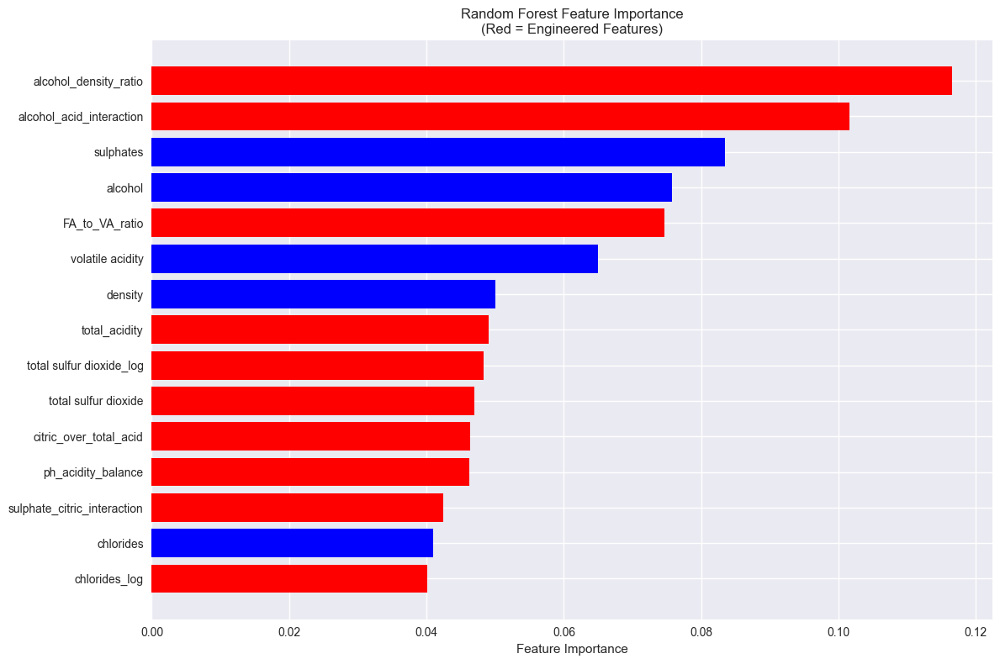

....Random Forest model completed...!


In [56]:
# Random Forest Classifier
print("RANDOM FOREST CLASSIFIER")
print("EDA recommendation: Robust, captures interactions, insensitive to scaling and moderate outliers")

# Create Random Forest model
rf_model = RandomForestClassifier(
    n_estimators=100,
    random_state=42,
    class_weight='balanced',  # Handle class imbalance
    n_jobs=-1  # Use all available cores
)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions
y_train_pred_rf = rf_model.predict(X_train)
y_val_pred_rf = rf_model.predict(X_val)
y_test_pred_rf = rf_model.predict(X_test)

# Calculate metrics
train_accuracy_rf = accuracy_score(y_train, y_train_pred_rf)
val_accuracy_rf = accuracy_score(y_val, y_val_pred_rf)
test_accuracy_rf = accuracy_score(y_test, y_test_pred_rf)

train_balanced_acc_rf = balanced_accuracy_score(y_train, y_train_pred_rf)
val_balanced_acc_rf = balanced_accuracy_score(y_val, y_val_pred_rf)
test_balanced_acc_rf = balanced_accuracy_score(y_test, y_test_pred_rf)

train_f1_rf = f1_score(y_train, y_train_pred_rf, average='macro')
val_f1_rf = f1_score(y_val, y_val_pred_rf, average='macro')
test_f1_rf = f1_score(y_test, y_test_pred_rf, average='macro')

print(f"\nRandom Forest Performance:")
print(f"Training - Accuracy: {train_accuracy_rf:.3f}, Balanced Acc: {train_balanced_acc_rf:.3f}, Macro F1: {train_f1_rf:.3f}")
print(f"Validation - Accuracy: {val_accuracy_rf:.3f}, Balanced Acc: {val_balanced_acc_rf:.3f}, Macro F1: {val_f1_rf:.3f}")
print(f"Test - Accuracy: {test_accuracy_rf:.3f}, Balanced Acc: {test_balanced_acc_rf:.3f}, Macro F1: {test_f1_rf:.3f}")

# Feature importance analysis
print(f"\nFeature Importance (Top 10):")
feature_importance_rf = pd.DataFrame({
    'feature': X_train.columns,
    'importance': rf_model.feature_importances_
}).sort_values('importance', ascending=False)

for i, (_, row) in enumerate(feature_importance_rf.head(10).iterrows(), 1):
    print(f"{i:2d}. {row['feature']}: {row['importance']:.3f}")

# Visualize feature importance
plt.figure(figsize=(12, 8))
top_features_rf = feature_importance_rf.head(15)
colors = ['red' if any(keyword in f.lower() for keyword in ['ratio', 'interaction', 'balance', 'total', 'log']) else 'blue' for f in top_features_rf['feature']]

plt.barh(range(len(top_features_rf)), top_features_rf['importance'], color=colors)
plt.yticks(range(len(top_features_rf)), top_features_rf['feature'])
plt.xlabel('Feature Importance')
plt.title('Random Forest Feature Importance\n(Red = Engineered Features)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Store Random Forest results
rf_results = {
    'model': 'Random Forest',
    'train_accuracy': train_accuracy_rf,
    'val_accuracy': val_accuracy_rf,
    'test_accuracy': test_accuracy_rf,
    'train_balanced_acc': train_balanced_acc_rf,
    'val_balanced_acc': val_balanced_acc_rf,
    'test_balanced_acc': test_balanced_acc_rf,
    'train_f1': train_f1_rf,
    'val_f1': val_f1_rf,
    'test_f1': test_f1_rf
}

print("....Random Forest model completed...!")
